In [1]:
# import Library and some random image data set
import tensorflow as tf
import numpy      as np
import seaborn    as sns 
import pandas     as pd
import os,sys
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
np.random.seed(78); tf.set_random_seed(78)

# get some of the STL data set
from sklearn.preprocessing import OneHotEncoder
from skimage import util 
from skimage.transform import resize
from skimage.io import imread
import warnings
from numpy import inf

from scipy.stats import kurtosis,skew

plt.rcParams.update({'font.size': 10})
import warnings
warnings.filterwarnings("ignore")
import gc
from IPython.display import display, clear_output
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d
from matplotlib import animation
%load_ext jupyternotify

<IPython.core.display.Javascript object>

<h1>Things to compare</h1>
<div>
<ol>
  <li>Z: Baseline </li>
  <li>A: abs(Theta)  </li>
  <li>B: Theta ^ 2</li>
  <li>C: sqrt(Theta ^ 2) </li>
  <li>D: - log(1+Theta ^ 2)</li>
  <li>E: - tanh(Theta) </li>
  <li>F: - tanh(Theta^2)</li>
  <li>G: - tanh(abs(Theta))</li>
  <li>H: - tanh(abs(Theta)^2)</li>
  <li>I:   sin(Theta)</li>
  <li>J:   abs(sin(Theta))</li>
  <li>K:   log(Theta^2)</li>
  <li>L:   Theta * log(Theta^2)</li>
</ol>
</div>

<div>
<ol>
  <li>CNN - no batch </li>
  <li>CNN - batch </li>
  <li>FNN - no batch </li>
  <li>FNN - batch </li>
</ol>
</div>

In [2]:
# read all of the data
# https://github.com/mttk/STL10
plt.rcParams.update({'font.size': 10})
def read_all_images(path_to_data):
    """
    :param path_to_data: the file containing the binary images from the STL-10 dataset
    :return: an array containing all the images
    """

    with open(path_to_data, 'rb') as f:
        # read whole file in uint8 chunks
        everything = np.fromfile(f, dtype=np.uint8)

        # We force the data into 3x96x96 chunks, since the
        # images are stored in "column-major order", meaning
        # that "the first 96*96 values are the red channel,
        # the next 96*96 are green, and the last are blue."
        # The -1 is since the size of the pictures depends
        # on the input file, and this way numpy determines
        # the size on its own.

        images = np.reshape(everything, (-1, 3, 96, 96))

        # Now transpose the images into a standard image format
        # readable by, for example, matplotlib.imshow
        # You might want to comment this line or reverse the shuffle
        # if you will use a learning algorithm like CNN, since they like
        # their channels separated.
        images = np.transpose(images, (0, 3, 2, 1))
        return images
def read_labels(path_to_labels):
    """
    :param path_to_labels: path to the binary file containing labels from the STL-10 dataset
    :return: an array containing the labels
    """
    with open(path_to_labels, 'rb') as f:
        labels = np.fromfile(f, dtype=np.uint8)
        return labels
def show_images(data,row=1,col=1):
    fig=plt.figure(figsize=(10,10))
    columns = col; rows = row
    for i in range(1, columns*rows +1):
        fig.add_subplot(rows, columns, i)
        plt.imshow(data[i-1])
    plt.show()

train_images = read_all_images("../../../DataSet/STL10/stl10_binary/train_X.bin") / 255.0
train_labels = read_labels    ("../../../DataSet/STL10/stl10_binary/train_Y.bin")
test_images  = read_all_images("../../../DataSet/STL10/stl10_binary/test_X.bin")  / 255.0
test_labels  = read_labels    ("../../../DataSet/STL10/stl10_binary/test_y.bin")

label_encoder= OneHotEncoder(sparse=False,categories='auto')
train_labels = label_encoder.fit_transform(train_labels.reshape((-1,1)))
test_labels  = label_encoder.fit_transform(test_labels.reshape((-1,1)))

print(train_images.shape,train_images.max(),train_images.min())
print(train_labels.shape,train_labels.max(),train_labels.min())
print(test_images.shape,test_images.max(),test_images.min())
print(test_labels.shape,test_labels.max(),test_labels.min())

(5000, 96, 96, 3) 1.0 0.0
(5000, 10) 1.0 0.0
(8000, 96, 96, 3) 1.0 0.0
(8000, 10) 1.0 0.0


In [17]:
# create the layers
def tf_softmax(x): return tf.nn.softmax(x)
def tf_relu(x):   return tf.nn.relu(x)
def d_tf_relu(x): return tf.cast(tf.greater(x,0),tf.float32)

class CNN():

    def __init__(self,k,inc,out, stddev=0.05,which_reg=0,act=tf_relu,d_act=d_tf_relu):
        self.w              = tf.Variable(tf.random_normal([k,k,inc,out],stddev=stddev,seed=2,dtype=tf.float32))
        self.m,self.v       = tf.Variable(tf.zeros_like(self.w)),tf.Variable(tf.zeros_like(self.w))
        self.act,self.d_act = act,d_act
        self.regularizer    = which_reg
    def getw(self): return self.w
    def feedforward(self,input,stride=1,padding='SAME'):
        self.input  = input
        self.layer  = tf.nn.conv2d(input,self.w,strides=[1,stride,stride,1],padding=padding) 
        self.layerA = self.act(self.layer)
        return self.layer, self.layerA
    def backprop(self,gradient,stride=1,padding='SAME'):
        grad_part_1 = gradient
        grad_part_2 = self.d_act(self.layer)
        grad_part_3 = self.input

        grad_middle = grad_part_1 * grad_part_2
        grad        = tf.nn.conv2d_backprop_filter(input = grad_part_3,filter_sizes = tf.shape(self.w),  out_backprop = grad_middle,strides=[1,stride,stride,1],padding=padding) / batch_size
        grad_pass   = tf.nn.conv2d_backprop_input (input_sizes = tf.shape(self.input),filter= self.w,out_backprop = grad_middle,strides=[1,stride,stride,1],padding=padding)

        if self.regularizer == 'A': grad = grad + lamda * tf.sign(self.w)
        if self.regularizer == 'B': grad = grad + lamda * 2.0 * self.w
        if self.regularizer == 'C': grad = grad + lamda * (1.0/tf.sqrt(tf.square(self.w)+ 10e-8)) * self.w
        if self.regularizer == 'D': grad = grad + lamda * -(2*self.w)/(1 + self.w**2)
        if self.regularizer == 'E': grad = grad + lamda * -(1-tf.tanh(self.w) ** 2)
        if self.regularizer == 'F': grad = grad + lamda * -(1-tf.tanh(self.w** 2) ** 2) * 2.0 * self.w 
        if self.regularizer == 'G': grad = grad + lamda * -(1-tf.tanh(tf.abs(self.w)) ** 2) * tf.sign(self.w)
        if self.regularizer == 'H': grad = grad + lamda * -(1-tf.tanh(tf.abs(self.w)** 2) ** 2) * 2.0 * tf.abs(self.w) *  tf.sign(self.w)
        if self.regularizer == 'I': grad = grad + lamda * tf.cos(self.w)
        if self.regularizer == 'J': grad = grad + lamda * tf.sign(tf.sin(self.w)) * tf.cos(self.w)
        if self.regularizer == 'K': grad = grad + lamda * (2)/(self.w + 10e-8)
        if self.regularizer == 'L': grad = grad + lamda * (tf.log(self.w**2) + 2.0)
        
        update_w = []
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1) ; v_hat = self.v / (1-beta2)
        adam_middle = m_hat * learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,adam_middle  )))
        return grad_pass,grad,update_w
class tf_batch_norm_layer():
    
    def __init__(self,vector_shape,axis):
        self.moving_mean = tf.Variable(tf.zeros(shape=[1,1,1,vector_shape],dtype=tf.float32))
        self.moving_vari = tf.Variable(tf.zeros(shape=[1,1,1,vector_shape],dtype=tf.float32))
        self.axis        = axis
    def feedforward(self,input,training_phase=True,eps = 1e-8):
        self.input = input
        self.input_size          = self.input.shape
        self.batch,self.h,self.w,self.c = self.input_size[0].value,self.input_size[1].value,self.input_size[2].value,self.input_size[3].value

        # Training Moving Average Mean         
        def training_fn():
            self.mean    = tf.reduce_mean(self.input,axis=self.axis ,keepdims=True)
            self.var     = tf.reduce_mean(tf.square(self.input-self.mean),axis=self.axis,keepdims=True)
            centered_data= (self.input - self.mean)/tf.sqrt(self.var + eps)
            
            update_variable = []
            update_variable.append(tf.assign(self.moving_mean,self.moving_mean*0.9 + 0.1 * self.mean ))
            update_variable.append(tf.assign(self.moving_vari,self.moving_vari*0.9 + 0.1 * self.var  ))
            return centered_data,update_variable
        
        # Testing Moving Average Mean        
        def  testing_fn():
            centered_data   = (self.input - self.moving_mean)/tf.sqrt(self.moving_vari + eps)
            update_variable = []
            update_variable.append(tf.assign(self.moving_mean,self.moving_mean))
            update_variable.append(tf.assign(self.moving_vari,self.moving_vari))
            return centered_data,update_variable
        
        self.output,update_variable = tf.cond(training_phase,true_fn=training_fn,false_fn=testing_fn)
        return self.output,update_variable
    def backprop(self,grad,eps = 1e-8):
        change_parts = 1.0 /(self.batch * self.h * self.w)
        grad_sigma   = tf.reduce_sum( grad *  (self.input-self.mean)     ,axis=self.axis,keepdims=True) * -0.5 * (self.var+eps) ** -1.5
        grad_mean    = tf.reduce_sum( grad *  (-1./tf.sqrt(self.var+eps)),axis=self.axis,keepdims=True) + grad_sigma * change_parts * 2.0 * tf.reduce_sum((self.input-self.mean),axis=self.axis,keepdims=True) * -1
        grad_x       = grad * 1/(tf.sqrt(self.var+eps)) + grad_sigma * change_parts * 2.0 * (self.input-self.mean) + grad_mean * change_parts
        return grad_x

def save_to_image(data,name):
    l1g,l2g,l3g,l4g,l5g,l6g = data
    l1g,l2g,l3g,l4g,l5g,l6g = np.asarray(l1g),np.asarray(l2g),np.asarray(l3g),np.asarray(l4g),np.asarray(l5g),np.asarray(l6g)
    plt.figure(figsize=(25,15))
    plt.suptitle('Current Iter : ' + str(iter))
    plt.subplot(231); plt.hist(l1g.ravel(),50); plt.title('layer 1')
    plt.subplot(232); plt.hist(l2g.ravel(),50); plt.title('layer 2')
    plt.subplot(233); plt.hist(l3g.ravel(),50); plt.title('layer 3')
    plt.subplot(234); plt.hist(l4g.ravel(),50); plt.title('layer 4')
    plt.subplot(235); plt.hist(l5g.ravel(),50); plt.title('layer 5')
    plt.subplot(236); plt.hist(l6g.ravel(),50); plt.title('layer 6')
    plt.savefig(name + str(iter)+'.png')
    plt.tight_layout()
    plt.close('all')     
def append_stat(current_list,data,number):
    current_list[0].append(data[number].mean())
    current_list[1].append(data[number].std())
    current_list[2].append(skew    (data[number].ravel()))
    current_list[3].append(kurtosis(data[number].ravel()))
    current_list[4].append(np.count_nonzero(data[number]))
    return current_list
def transform_to_2d(data):
    batch,width,height,chan = data.shape
    return data.reshape((batch*width,height*chan))
def save_to_image(main_data,one,two,three,four,five,six,experiment_name,tran_acc,test_acc,current_exp,iter):
    plt.figure(figsize=(20,40))
    G = gridspec.GridSpec(8, 6)

    plt.figtext(0.5,1.0,"Iter: " + str(iter) + " Histogram Per " + experiment_name,ha="center", va="top", fontsize=35, color="black")
    plt.subplot(G[0, 0]).hist(main_data[0].ravel(),50,color='red');       plt.subplot(G[0, 0]).set_title(experiment_name+' 1')
    plt.subplot(G[0, 1]).hist(main_data[1].ravel(),50,color='orange');    plt.subplot(G[0, 1]).set_title(experiment_name+' 2')
    plt.subplot(G[0, 2]).hist(main_data[2].ravel(),50,color='yellow');  plt.subplot(G[0, 2]).set_title(experiment_name+' 3')
    plt.subplot(G[0, 3]).hist(main_data[3].ravel(),50,color='green');    plt.subplot(G[0, 3]).set_title(experiment_name+' 4')
    plt.subplot(G[0, 4]).hist(main_data[4].ravel(),50,color='blue');     plt.subplot(G[0, 4]).set_title(experiment_name+' 5')
    plt.subplot(G[0, 5]).hist(main_data[5].ravel(),50,color='black');     plt.subplot(G[0, 5]).set_title(experiment_name+' 6')

    plt.subplot(G[1, :]).set_title("Mean Per "+ experiment_name)
    plt.subplot(G[1, :]).plot(one[0]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[1, :]).plot(two[0]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[1, :]).plot(three[0],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[1, :]).plot(four[0],c='green',alpha=0.9,label='4')
    plt.subplot(G[1, :]).plot(five[0],c='blue',alpha=0.9,label='5')
    plt.subplot(G[1, :]).plot(six[0],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[2, :]).set_title("Standard Deviation Per "+ experiment_name)
    plt.subplot(G[2, :]).plot(one[1]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[2, :]).plot(two[1]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[2, :]).plot(three[1],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[2, :]).plot(four[1],c='green',alpha=0.9,label='4')
    plt.subplot(G[2, :]).plot(five[1],c='blue',alpha=0.9,label='5')
    plt.subplot(G[2, :]).plot(six[1],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[3, :]).set_title("Skewness Per "+ experiment_name)
    plt.subplot(G[3, :]).plot(one[2]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[3, :]).plot(two[2]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[3, :]).plot(three[2],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[3, :]).plot(four[2],c='green',alpha=0.9,label='4')
    plt.subplot(G[3, :]).plot(five[2],c='blue',alpha=0.9,label='5')
    plt.subplot(G[3, :]).plot(six[2],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[4, :]).set_title("Kurtosis Per "+ experiment_name)
    plt.subplot(G[4, :]).plot(one[3]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[4, :]).plot(two[3]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[4, :]).plot(three[3],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[4, :]).plot(four[3],c='green',alpha=0.9,label='4')
    plt.subplot(G[4, :]).plot(five[3],c='blue',alpha=0.9,label='5')
    plt.subplot(G[4, :]).plot(six[3],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[5, :]).set_title("# Non-Zero Per "+ experiment_name)
    plt.subplot(G[5, :]).plot(one[4]  ,c='red',alpha=0.9   ,label='1')
    plt.subplot(G[5, :]).plot(two[4]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[5, :]).plot(three[4],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[5, :]).plot(four[4],c='green',alpha=0.9  ,label='4')
    plt.subplot(G[5, :]).plot(five[4],c='blue',alpha=0.9   ,label='5')
    plt.subplot(G[5, :]).plot(six[4],c='black',alpha=0.9   ,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[6, :]).set_title("Train/Test accuracy")
    plt.subplot(G[6, :]).plot(train_acc  ,c='red',alpha=0.9, label='Train')
    plt.subplot(G[6, :]).plot(test_acc   ,c='blue',alpha=0.9,label='Test')
    plt.legend()

    plt.figtext(0.5,0,"Correlation Matrix Per "+ experiment_name,ha="center", va="bottom", fontsize=30, color="black")
    plt.subplot(G[7, 0]).imshow(np.corrcoef(transform_to_2d(main_data[0])),cmap='gray')
    plt.subplot(G[7, 1]).imshow(np.corrcoef(transform_to_2d(main_data[1])),cmap='gray')
    plt.subplot(G[7, 2]).imshow(np.corrcoef(transform_to_2d(main_data[2])),cmap='gray')
    plt.subplot(G[7, 3]).imshow(np.corrcoef(transform_to_2d(main_data[3])),cmap='gray')
    plt.subplot(G[7, 4]).imshow(np.corrcoef(transform_to_2d(main_data[4])),cmap='gray')
    plt.subplot(G[7, 5]).imshow(np.corrcoef(transform_to_2d(main_data[5])),cmap='gray')

    plt.tight_layout()
    plt.savefig(current_exp + '/' + experiment_name + '/' + str(iter) + '.png')
    plt.close('all')
def plot_rotation_weight(current_layers,current_layer_number,current_batch_norm_type,current_exp_name): 

    def rotate(angle):ax.view_init(azim=angle)
    plt.rcParams.update({'font.size': 8})
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    number_of_eps = [1,2,3,4,5,6,7,8,9,10,11]
    fig = plt.figure(figsize=(10,10))
    ax  = fig.add_subplot(111, projection='3d')
    count = 0
    for episode in range(num_eps+1):
        if episode == num_eps:
            ys   = current_layers.mean(0).flatten()
            xmin = ys.min(); xmax = ys.max(); step = 0.005
            hist,bins = np.histogram(ys, bins=np.linspace(xmin, xmax, (xmax-xmin)/step))
            ax.bar(bins[:-1], hist, width=0.01,zs=episode, zdir='y', color=colors[episode], alpha=0.8)
        else:
            ys   = current_layers[episode].flatten()
            xmin = ys.min(); xmax = ys.max(); step = 0.005
            hist,bins = np.histogram(ys, bins=np.linspace(xmin, xmax, (xmax-xmin)/step))
            ax.bar(bins[:-1], hist, width=0.01,zs=episode, zdir='y', color=colors[episode], alpha=0.4)
    ax.set_xlabel('Values')
    ax.set_ylabel('Episode')
    ax.get_yaxis().set_ticks(np.arange(num_eps+1))
    ax.set_zlabel('Histogram')

    ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

    # make the grid lines transparent
    ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    # ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    #plt.tight_layout()
    plt.show()

    animation.FuncAnimation(fig, rotate, frames=np.arange(0,362,2),interval=100) \
    .save(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/weight_'+str(current_layer_number)+'.gif', dpi=80, writer='imagemagick')
    plt.close('all')
def plot_image_weight(current_layers,current_layer_number,current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy):
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    def rt(number): return np.around(number,4)
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(15,15))
    plt.rcParams.update({'font.size': 50})

    fig.add_subplot(341); plt.hist(current_layers[0].flatten(),50,color=colors[0],alpha=0.8);plt.title('EPS: 1 Mean: '+str(rt(current_layers[0].mean())) +' STD: '+str(rt(current_layers[0].std())))
    fig.add_subplot(342); plt.hist(current_layers[1].flatten(),50,color=colors[1],alpha=0.8);plt.title('EPS: 2 Mean: '+str(rt(current_layers[1].mean())) +' STD: '+str(rt(current_layers[1].std())))
    fig.add_subplot(343); plt.hist(current_layers[2].flatten(),50,color=colors[2],alpha=0.8);plt.title('EPS: 3 Mean: '+str(rt(current_layers[2].mean())) +' STD: '+str(rt(current_layers[2].std())))
    fig.add_subplot(344); plt.hist(current_layers[3].flatten(),50,color=colors[3],alpha=0.8);plt.title('EPS: 4 Mean: '+str(rt(current_layers[3].mean())) +' STD: '+str(rt(current_layers[3].std())))
    
    fig.add_subplot(345); plt.hist(current_layers[4].flatten(),50,color=colors[4],alpha=0.8);plt.title('EPS: 5 Mean: '+str(rt(current_layers[4].mean())) +' STD: '+str(rt(current_layers[4].std())))
    fig.add_subplot(346); plt.hist(current_layers[5].flatten(),50,color=colors[5],alpha=0.8);plt.title('EPS: 6 Mean: '+str(rt(current_layers[5].mean())) +' STD: '+str(rt(current_layers[5].std())))
    fig.add_subplot(347); plt.hist(current_layers[6].flatten(),50,color=colors[6],alpha=0.8);plt.title('EPS: 7 Mean: '+str(rt(current_layers[6].mean())) +' STD: '+str(rt(current_layers[6].std())))
    fig.add_subplot(348); plt.hist(current_layers[7].flatten(),50,color=colors[7],alpha=0.8);plt.title('EPS: 8 Mean: '+str(rt(current_layers[7].mean())) +' STD: '+str(rt(current_layers[7].std())))
    
    fig.add_subplot(3,4,9);  plt.hist(current_layers[8].flatten(),50,color=colors[8],alpha=0.8);plt.title('EPS: 9 Mean: '+str(rt(current_layers[8].mean())) +' STD: '+str(rt(current_layers[8].std())))
    fig.add_subplot(3,4,10); plt.hist(current_layers[9].flatten(),50,color=colors[9],alpha=0.8);plt.title('EPS: 10 Mean: '+str(rt(current_layers[9].mean())) +' STD: '+str(rt(current_layers[9].std())))
    fig.add_subplot(3,4,11); plt.hist(current_layers.mean(0).flatten(),50,color=colors[10],alpha=0.8);plt.title('EPS: All Mean: '+str(rt(current_layers.mean(0).mean())) +' STD: '+str(rt(current_layers.mean(0).std())))
    fig.add_subplot(3,4,12); 
    plt.plot(current_exp_train_accuracy.max(0),  ' ' ,color='red')
    plt.plot(current_exp_train_accuracy.mean(0), '-' ,color='red',label='train mean')
    plt.plot(current_exp_train_accuracy.min(0) , ' ' ,color='red')
    plt.fill_between(range(num_epoch),current_exp_train_accuracy.max(0),current_exp_train_accuracy.min(0),facecolor='red', alpha=0.2)

    plt.plot(current_exp_test_accuracy.max(0),  ' ' ,color='blue')
    plt.plot(current_exp_test_accuracy.mean(0), '-' ,color='blue',label='test mean')
    plt.plot(current_exp_test_accuracy.min(0) , ' ' ,color='blue')
    plt.fill_between(range(num_epoch),current_exp_test_accuracy.max(0),current_exp_test_accuracy.min(0),facecolor='blue', alpha=0.2)
    
    plt.legend()
    plt.tight_layout()
    plt.savefig(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/weight_'+str(current_layer_number)+'.png')
    plt.close('all')
def plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy):
    
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    def rt(number): return np.around(number,4)
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(15,15))
    plt.rcParams.update({'font.size': 50})
    gs = gridspec.GridSpec(3, 3)
    
    fig.add_subplot(331); plt.hist(current_weights_layer1.mean(0).flatten(),50,color=colors[0],alpha=0.8); plt.title('Layer 1 Histogram Mean :'+str(rt(current_weights_layer1.mean(0).mean()))+' STD: '+str(rt(current_weights_layer1.mean(0).std())))
    fig.add_subplot(332); plt.hist(current_weights_layer2.mean(0).flatten(),50,color=colors[1],alpha=0.8); plt.title('Layer 2 Histogram Mean :'+str(rt(current_weights_layer2.mean(0).mean()))+' STD: '+str(rt(current_weights_layer2.mean(0).std())))
    fig.add_subplot(333); plt.hist(current_weights_layer3.mean(0).flatten(),50,color=colors[2],alpha=0.8); plt.title('Layer 3 Histogram Mean :'+str(rt(current_weights_layer3.mean(0).mean()))+' STD: '+str(rt(current_weights_layer3.mean(0).std())))
    
    fig.add_subplot(334); plt.hist(current_weights_layer4.mean(0).flatten(),50,color=colors[3],alpha=0.8); plt.title('Layer 4 Histogram Mean :'+str(rt(current_weights_layer4.mean(0).mean()))+' STD: '+str(rt(current_weights_layer4.mean(0).std())))
    fig.add_subplot(335); plt.hist(current_weights_layer5.mean(0).flatten(),50,color=colors[4],alpha=0.8); plt.title('Layer 5 Histogram Mean :'+str(rt(current_weights_layer5.mean(0).mean()))+' STD: '+str(rt(current_weights_layer5.mean(0).std())))
    fig.add_subplot(336); plt.hist(current_weights_layer6.mean(0).flatten(),50,color=colors[5],alpha=0.8); plt.title('Layer 6 Histogram Mean :'+str(rt(current_weights_layer6.mean(0).mean()))+' STD: '+str(rt(current_weights_layer6.mean(0).std())))
    
    fig.add_subplot(gs[2,:]); 
    plt.plot(current_exp_train_accuracy.max(0),  ' ' ,color='red')
    plt.plot(current_exp_train_accuracy.mean(0), '-' ,color='red',label='train mean')
    plt.plot(current_exp_train_accuracy.min(0) , ' ' ,color='red')
    plt.fill_between(range(num_epoch),current_exp_train_accuracy.max(0),current_exp_train_accuracy.min(0),facecolor='red', alpha=0.2)

    plt.plot(current_exp_test_accuracy.max(0),  ' ' ,color='blue')
    plt.plot(current_exp_test_accuracy.mean(0), '-' ,color='blue',label='test mean')
    plt.plot(current_exp_test_accuracy.min(0) , ' ' ,color='blue')
    plt.fill_between(range(num_epoch),current_exp_test_accuracy.max(0),current_exp_test_accuracy.min(0),facecolor='blue', alpha=0.2)
    
    plt.tight_layout()
    plt.legend()
    plt.savefig(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/z_all.png')
    plt.close('all')
    
def send_notification_email(letter,episode):
    import smtplib, ssl

    port = 587  # For starttls
    smtp_server = "smtp.gmail.com"
    sender_email = "sendresultsforme@gmail.com"
    receiver_email = "jae.duk.seo@gmail.com"
    password = "Password123*"
    message = "Subject: " + str(letter) + " : "+str(episode)+" is done!"

    context = ssl.create_default_context()
    with smtplib.SMTP(smtp_server, port) as server:
        server.ehlo()  # Can be omitted
        server.starttls(context=context)
        server.ehlo()  # Can be omitted
        server.login(sender_email, password)
        server.sendmail(sender_email, receiver_email, message)

In [6]:
# set hyper parameter
plt.rcParams.update({'font.size': 25})
num_eps   = 10; num_epoch = 150; learning_rate = 0.0008; batch_size = 20; beta1,beta2,adam_e = 0.9,0.999,1e-9; lamda = 0.00001


                    Starting Episode: 0

Current : 0	 Train Acc : 0.133	 Test Acc : 0.182	.35 0.05
Current : 15	 Train Acc : 0.379	 Test Acc : 0.388	.55
Current : 30	 Train Acc : 0.432	 Test Acc : 0.424	.45
Current : 45	 Train Acc : 0.469	 Test Acc : 0.444	.45
Current : 60	 Train Acc : 0.495	 Test Acc : 0.464	.45
Current : 75	 Train Acc : 0.519	 Test Acc : 0.473	.45
Current : 90	 Train Acc : 0.534	 Test Acc : 0.478	.55
Current : 105	 Train Acc : 0.549	 Test Acc : 0.482	.55
Current : 120	 Train Acc : 0.565	 Test Acc : 0.488	.55
Current : 135	 Train Acc : 0.575	 Test Acc : 0.489	.55
Z  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.12	 Test Acc : 0.141	0.25 0.05
Current : 15	 Train Acc : 0.385	 Test Acc : 0.384	.55
Current : 30	 Train Acc : 0.429	 Test Acc : 0.422	.55
Current : 45	 Train Acc : 0.469	 Test Acc : 0.455	.55
Current : 60	 Train Acc : 0.505	 Test Acc : 0.477	.55
Current : 75	 Train Acc : 0.534	 Test Acc

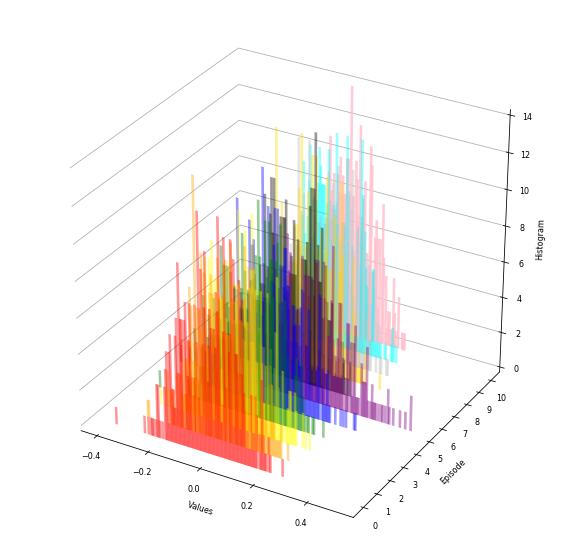

Z  1


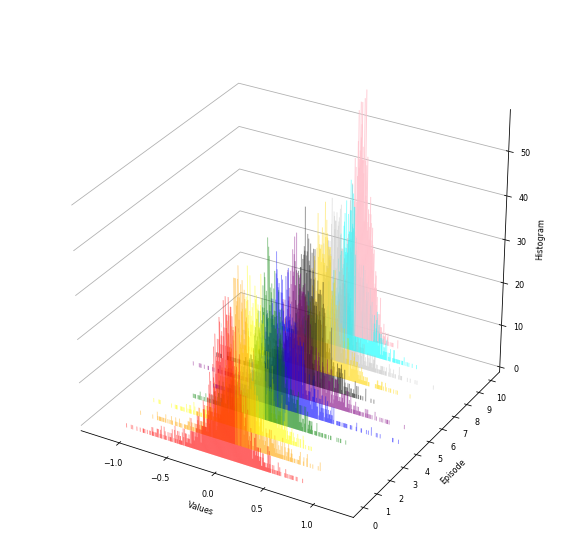

Z  2


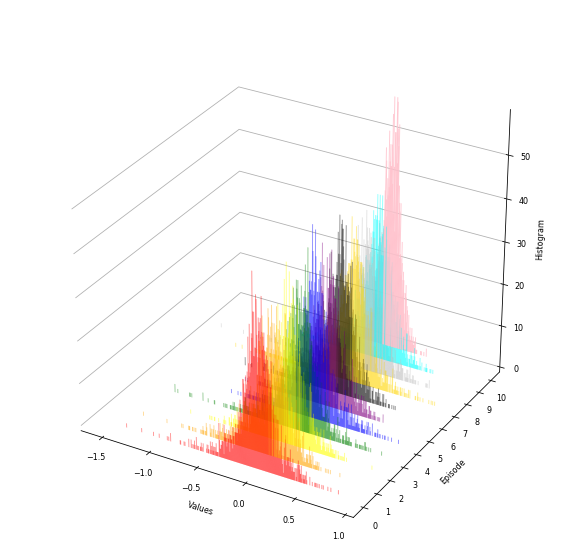

Z  3


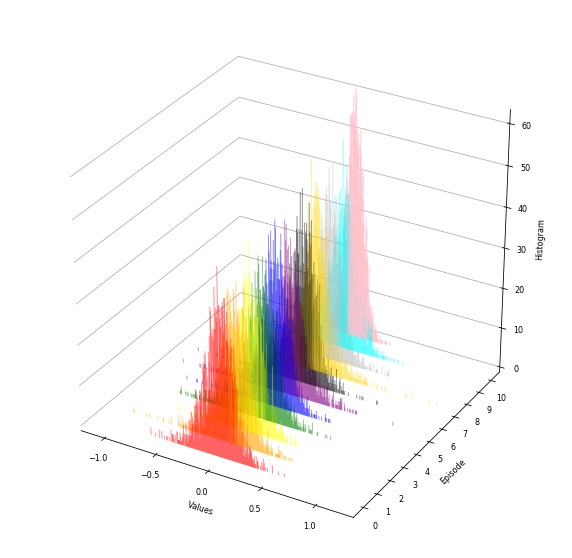

Z  4


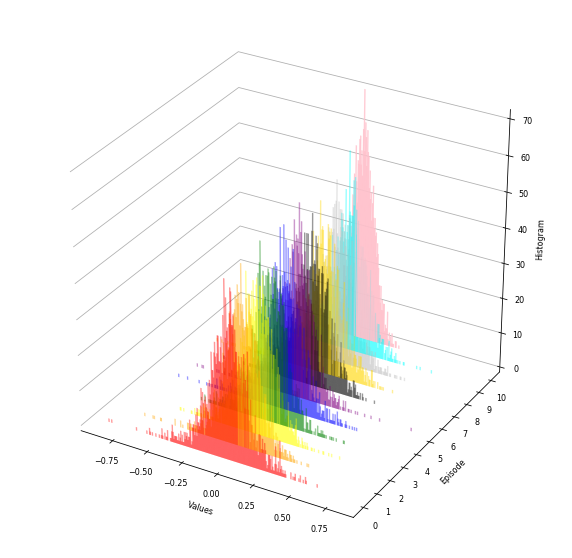

Z  5


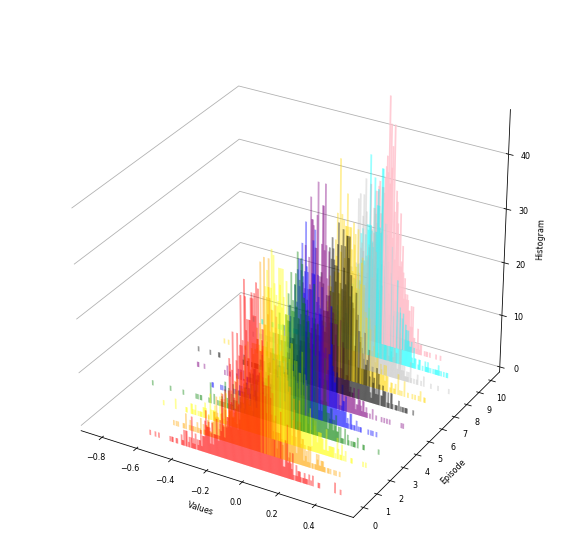

Z  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.107	 Test Acc : 0.159	.15 0.05
Current : 15	 Train Acc : 0.351	 Test Acc : 0.364	.45
Current : 30	 Train Acc : 0.393	 Test Acc : 0.397	.55
Current : 45	 Train Acc : 0.422	 Test Acc : 0.423	.45
Current : 60	 Train Acc : 0.441	 Test Acc : 0.437	.45
Current : 75	 Train Acc : 0.466	 Test Acc : 0.451	.45
Current : 90	 Train Acc : 0.486	 Test Acc : 0.457	.45
Current : 105	 Train Acc : 0.499	 Test Acc : 0.465	.45
Current : 120	 Train Acc : 0.511	 Test Acc : 0.479	.45
Current : 135	 Train Acc : 0.529	 Test Acc : 0.484	.45
A  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.106	 Test Acc : 0.153	.15 0.05
Current : 15	 Train Acc : 0.362	 Test Acc : 0.368	.45
Current : 30	 Train Acc : 0.411	 Test Acc : 0.399	.35
Current : 45	 Train Acc : 0.436	 Test Acc : 0.41	0.35
Current : 60	 Train Acc : 0.451	 Test Acc : 0.423	.45
Current : 75	 Train Acc : 0.463	 Tes

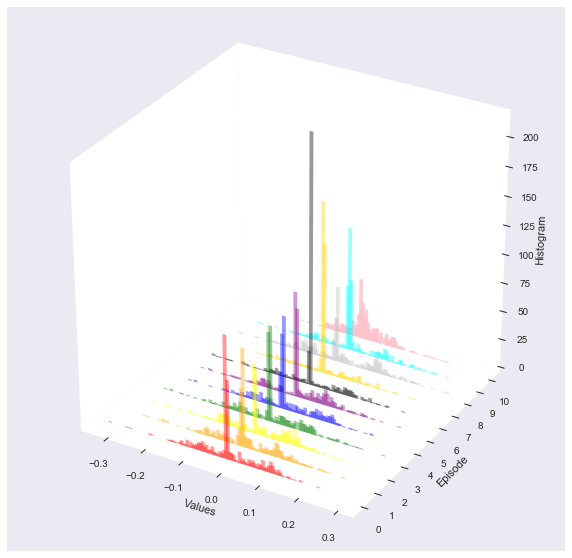

A  1


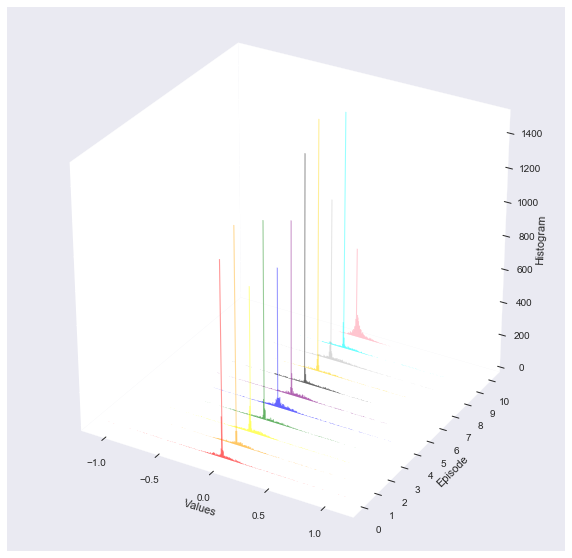

A  2


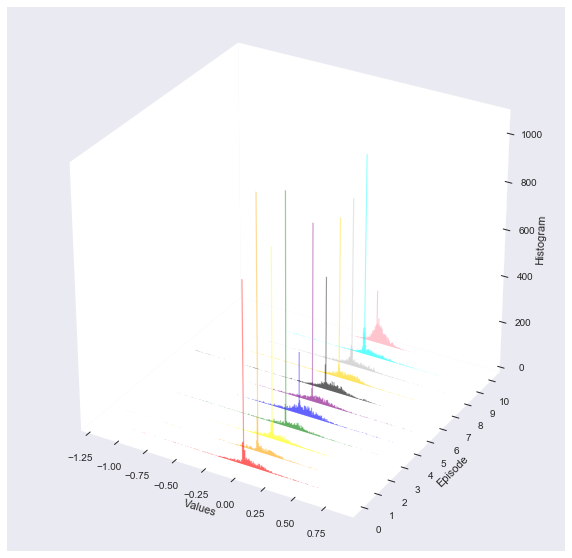

A  3


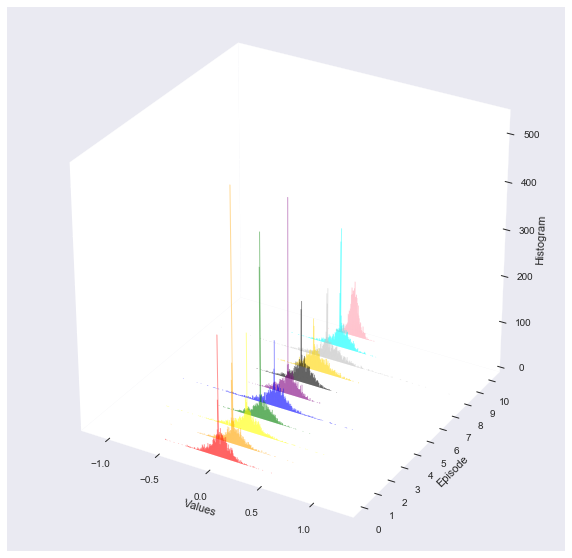

A  4


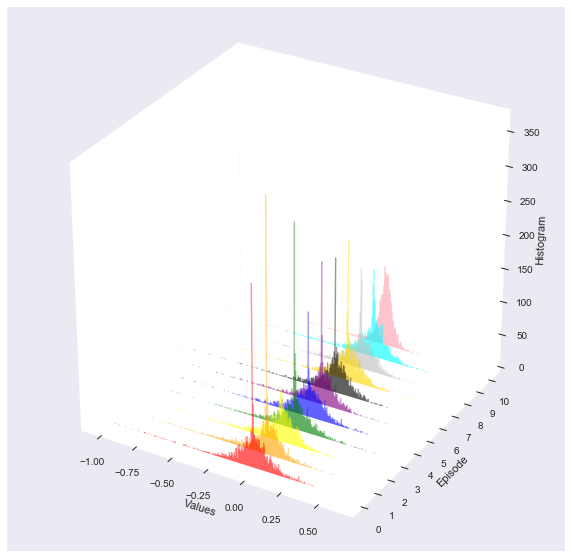

A  5


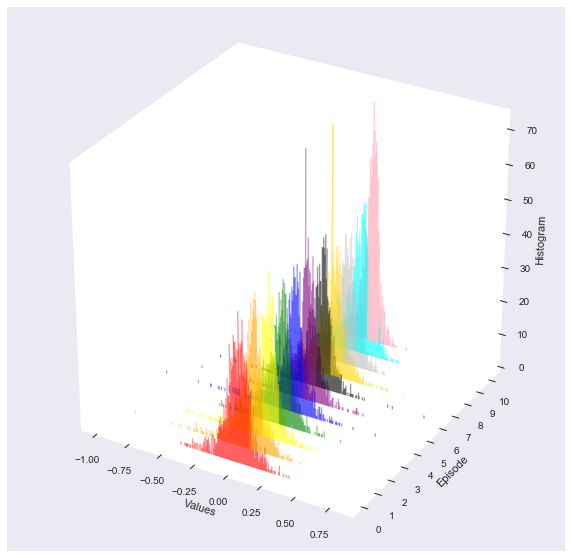

A  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.123	 Test Acc : 0.183	.25 0.05
Current : 15	 Train Acc : 0.375	 Test Acc : 0.372	.55
Current : 30	 Train Acc : 0.43	 Test Acc : 0.406	0.55
Current : 45	 Train Acc : 0.457	 Test Acc : 0.428	.45
Current : 60	 Train Acc : 0.477	 Test Acc : 0.439	.55
Current : 75	 Train Acc : 0.5	 Test Acc : 0.454	 0.55
Current : 90	 Train Acc : 0.521	 Test Acc : 0.46	0.45
Current : 105	 Train Acc : 0.535	 Test Acc : 0.471	.55
Current : 120	 Train Acc : 0.544	 Test Acc : 0.47	0.65
Current : 135	 Train Acc : 0.559	 Test Acc : 0.475	.65
B  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.125	 Test Acc : 0.185	.25 0.05
Current : 15	 Train Acc : 0.382	 Test Acc : 0.378	.55
Current : 30	 Train Acc : 0.422	 Test Acc : 0.409	.45
Current : 45	 Train Acc : 0.476	 Test Acc : 0.449	.45
Current : 60	 Train Acc : 0.508	 Test Acc : 0.47	0.45
Current : 75	 Train Acc : 0.534	 Tes

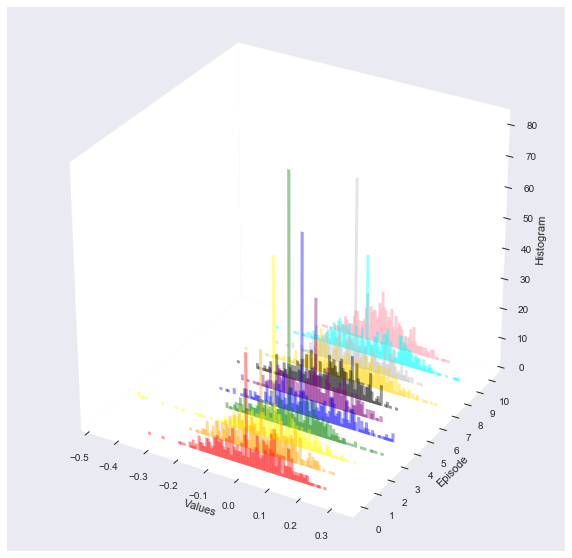

B  1


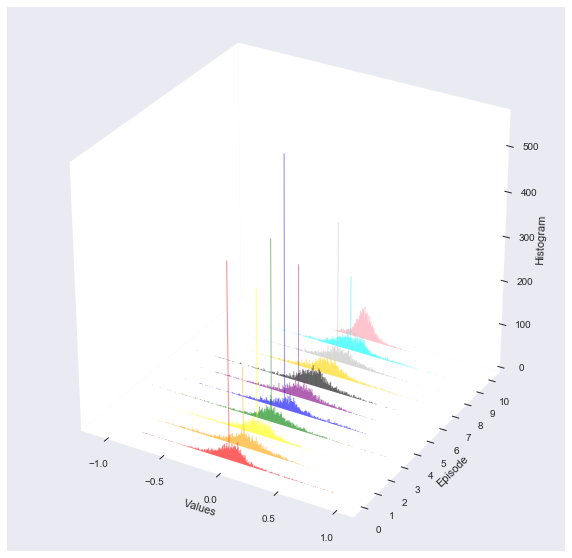

B  2


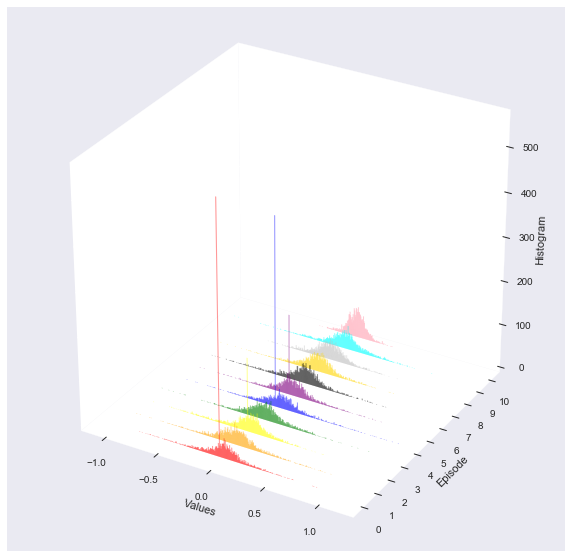

B  3


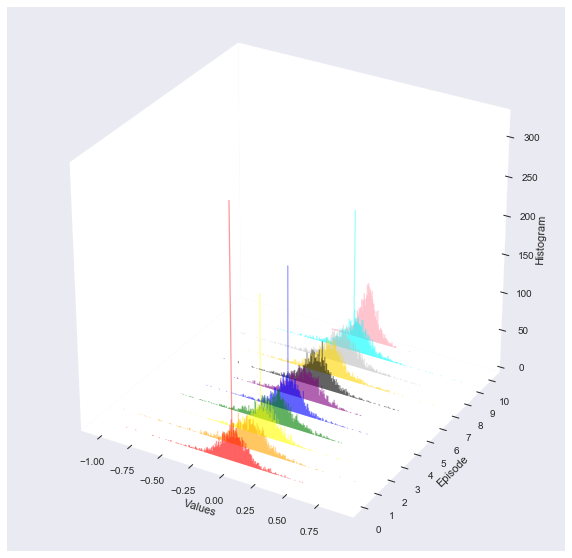

B  4


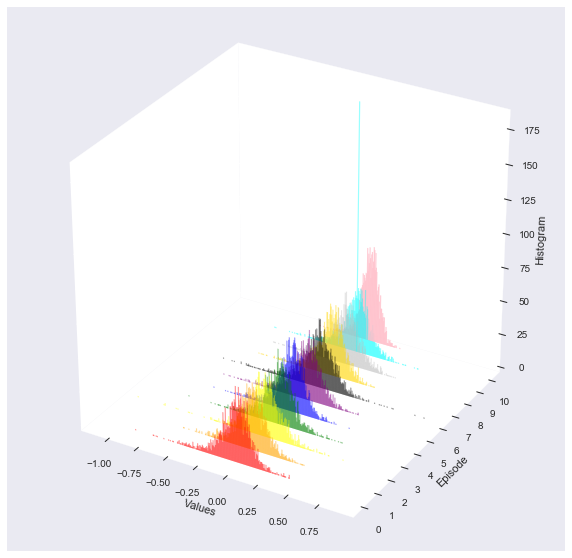

B  5


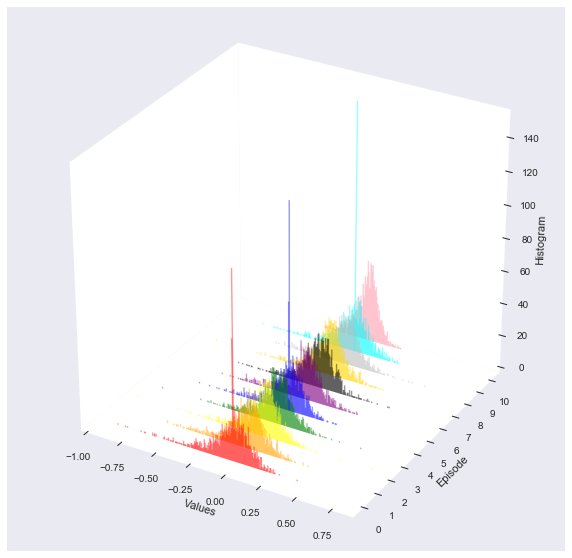

B  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.11	 Test Acc : 0.168	0.25 0.05
Current : 15	 Train Acc : 0.344	 Test Acc : 0.348	.45
Current : 30	 Train Acc : 0.403	 Test Acc : 0.393	.45
Current : 45	 Train Acc : 0.432	 Test Acc : 0.404	.45
Current : 60	 Train Acc : 0.447	 Test Acc : 0.429	.45
Current : 75	 Train Acc : 0.467	 Test Acc : 0.444	.45
Current : 90	 Train Acc : 0.482	 Test Acc : 0.452	.45
Current : 105	 Train Acc : 0.5	 Test Acc : 0.46	: 0.45
Current : 120	 Train Acc : 0.514	 Test Acc : 0.462	.45
Current : 135	 Train Acc : 0.527	 Test Acc : 0.466	.45
C  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.103	 Test Acc : 0.117	.15 0.05
Current : 15	 Train Acc : 0.355	 Test Acc : 0.358	.35
Current : 30	 Train Acc : 0.413	 Test Acc : 0.403	.35
Current : 45	 Train Acc : 0.443	 Test Acc : 0.43	0.35
Current : 60	 Train Acc : 0.466	 Test Acc : 0.438	.35
Current : 75	 Train Acc : 0.483	 Tes

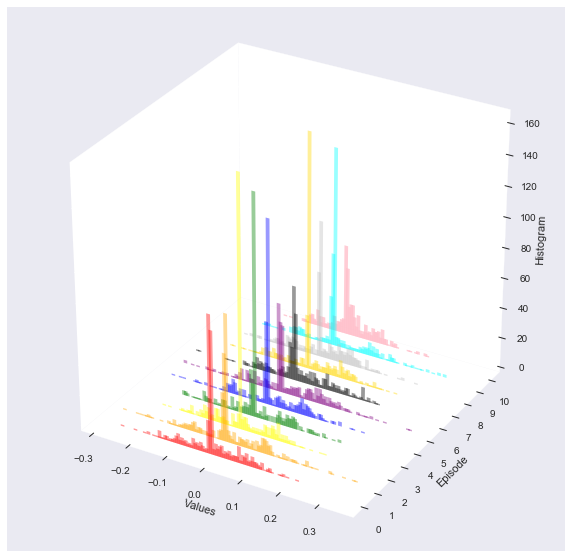

C  1


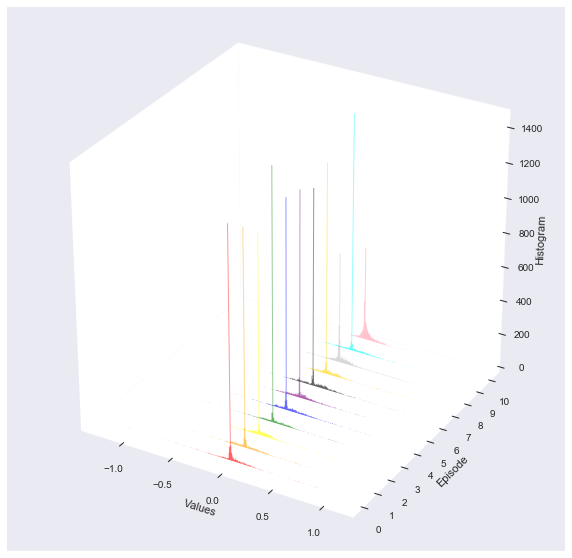

C  2


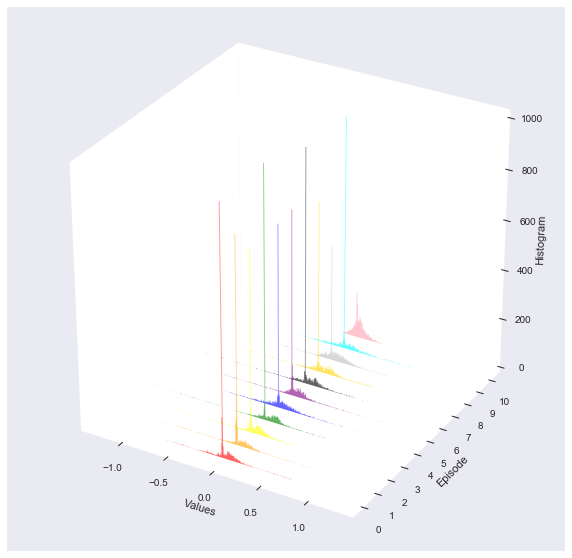

C  3


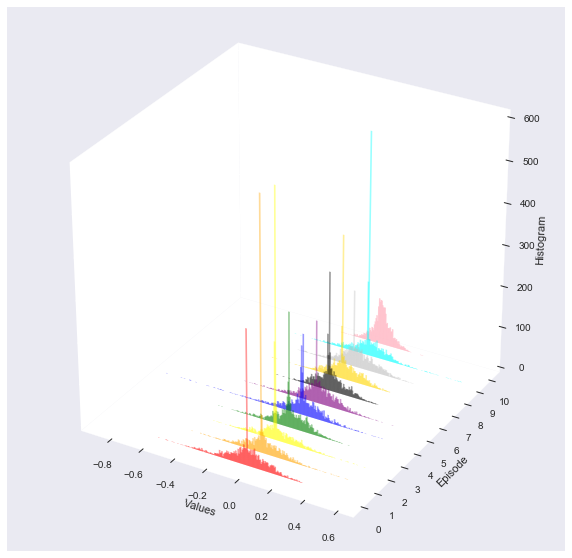

C  4


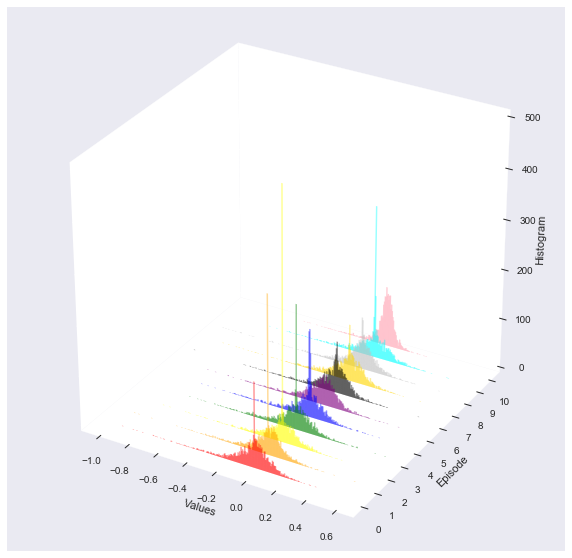

C  5


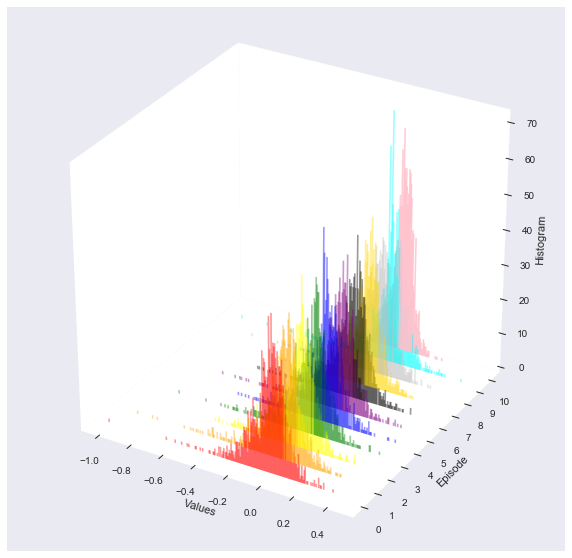

C  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.121	 Test Acc : 0.16	0.25 0.05
Current : 15	 Train Acc : 0.383	 Test Acc : 0.364	.35
Current : 30	 Train Acc : 0.427	 Test Acc : 0.397	.45
Current : 45	 Train Acc : 0.453	 Test Acc : 0.413	.45
Current : 60	 Train Acc : 0.504	 Test Acc : 0.446	.45
Current : 75	 Train Acc : 0.536	 Test Acc : 0.457	.35
Current : 90	 Train Acc : 0.562	 Test Acc : 0.468	.35
Current : 105	 Train Acc : 0.591	 Test Acc : 0.479	.35
Current : 120	 Train Acc : 0.614	 Test Acc : 0.481	.45
Current : 135	 Train Acc : 0.633	 Test Acc : 0.484	.55
D  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.126	 Test Acc : 0.163	.15 0.05
Current : 15	 Train Acc : 0.41	 Test Acc : 0.4	: 0.55
Current : 30	 Train Acc : 0.447	 Test Acc : 0.431	.55
Current : 45	 Train Acc : 0.476	 Test Acc : 0.456	.45
Current : 60	 Train Acc : 0.511	 Test Acc : 0.478	.45
Current : 75	 Train Acc : 0.541	 Tes

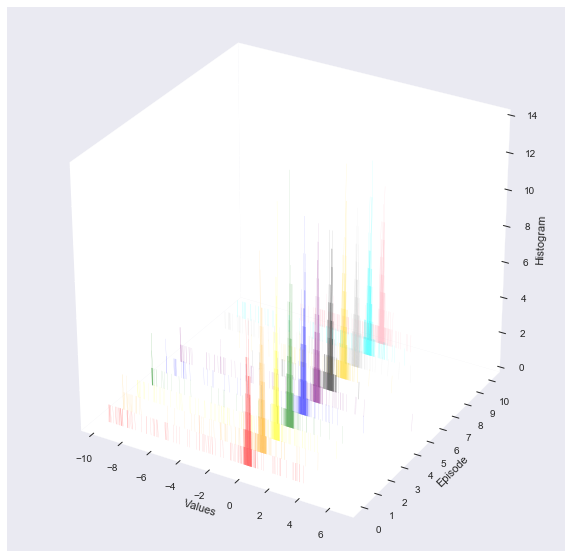

D  1


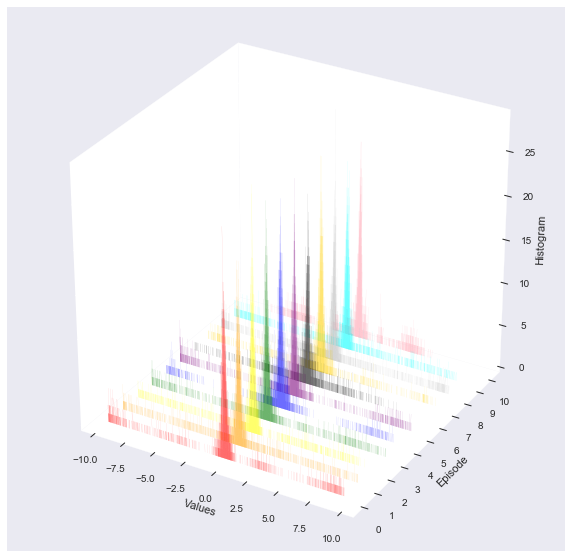

D  2


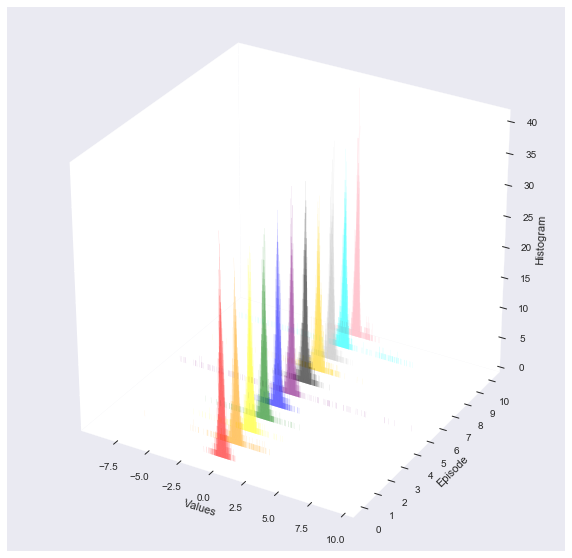

D  3


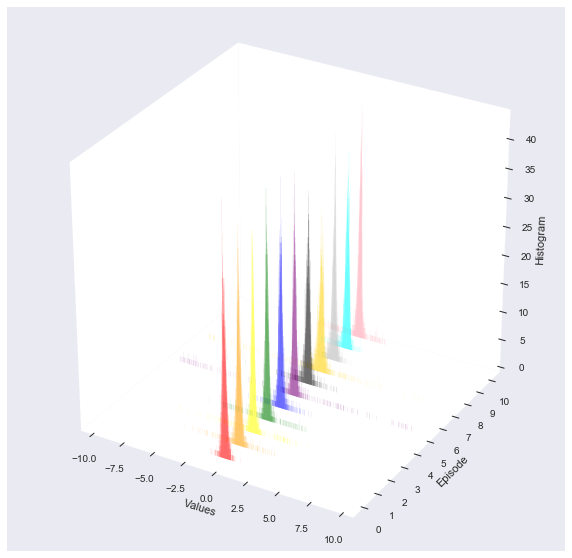

D  4


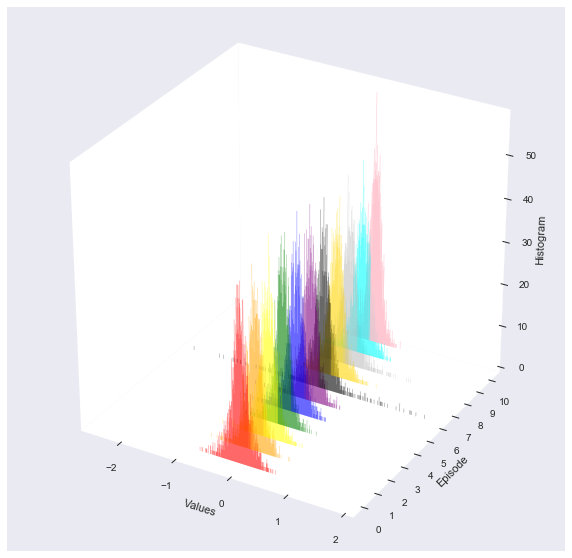

D  5


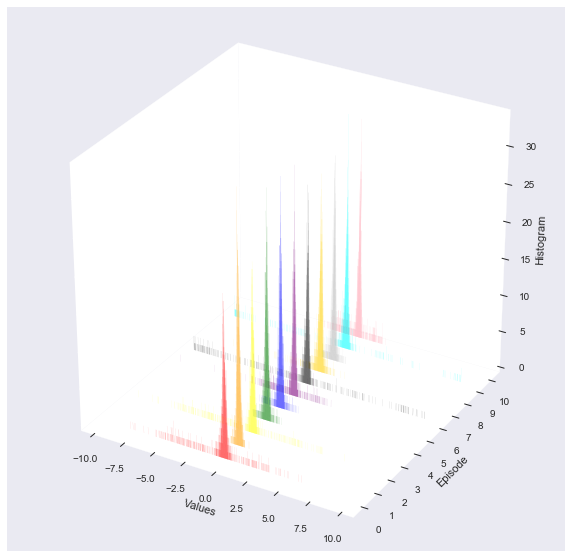

D  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.101	 Test Acc : 0.1	 0.15 0.05
Current : 15	 Train Acc : 0.38	 Test Acc : 0.367	0.45
Current : 30	 Train Acc : 0.424	 Test Acc : 0.411	.55
Current : 45	 Train Acc : 0.454	 Test Acc : 0.438	.45
Current : 60	 Train Acc : 0.48	 Test Acc : 0.452	0.55
Current : 75	 Train Acc : 0.509	 Test Acc : 0.461	.45
Current : 90	 Train Acc : 0.536	 Test Acc : 0.48	0.35
Current : 105	 Train Acc : 0.551	 Test Acc : 0.491	.35
Current : 120	 Train Acc : 0.57	 Test Acc : 0.493	0.35
Current : 135	 Train Acc : 0.588	 Test Acc : 0.499	.35
E  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 1

Current : 0	 Train Acc : 0.101	 Test Acc : 0.102	.25 0.05
Current : 15	 Train Acc : 0.147	 Test Acc : 0.148	.15
Current : 30	 Train Acc : 0.347	 Test Acc : 0.35	0.35
Current : 45	 Train Acc : 0.4	 Test Acc : 0.397	 0.35
Current : 60	 Train Acc : 0.436	 Test Acc : 0.421	.35
Current : 75	 Train Acc : 0.465	 Tes

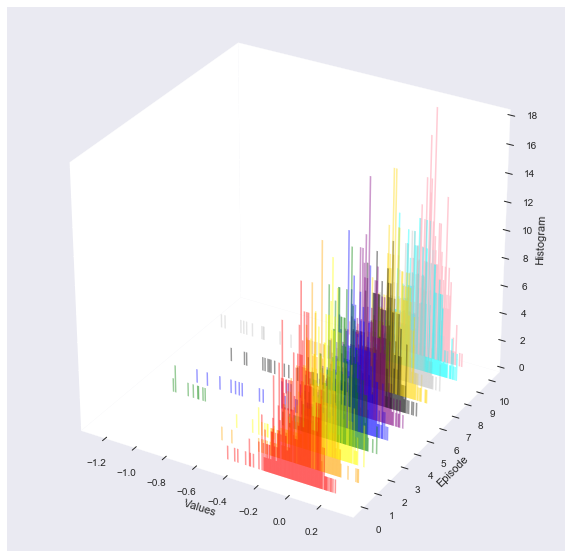

E  1


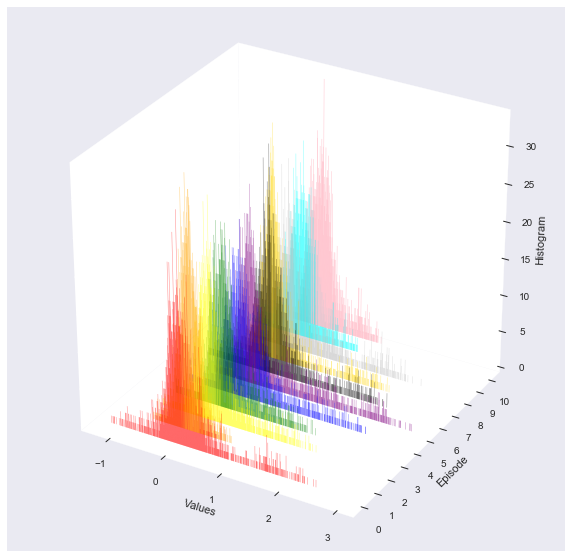

E  2


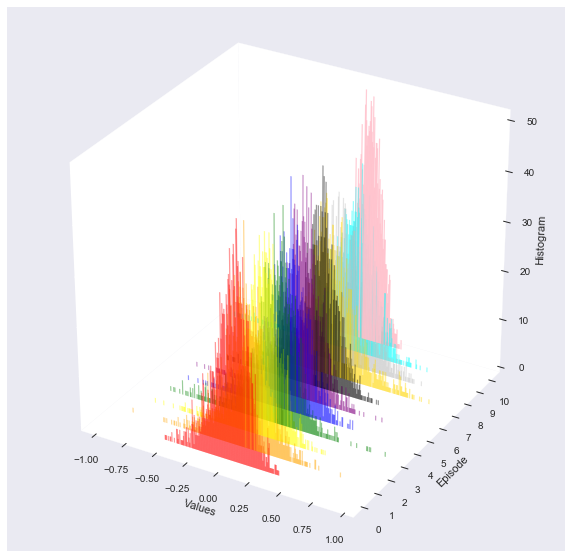

E  3


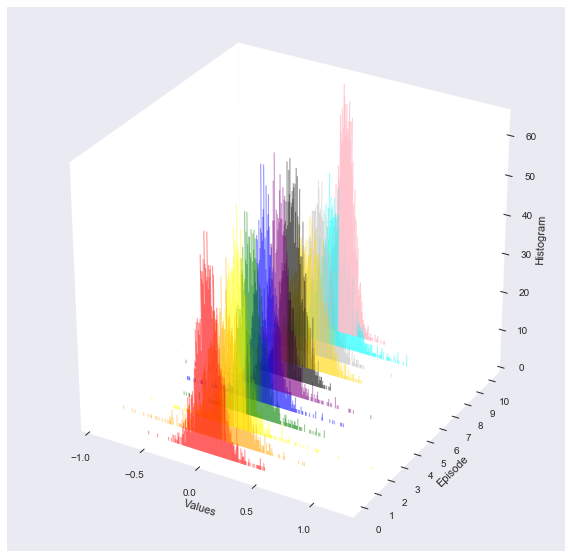

E  4


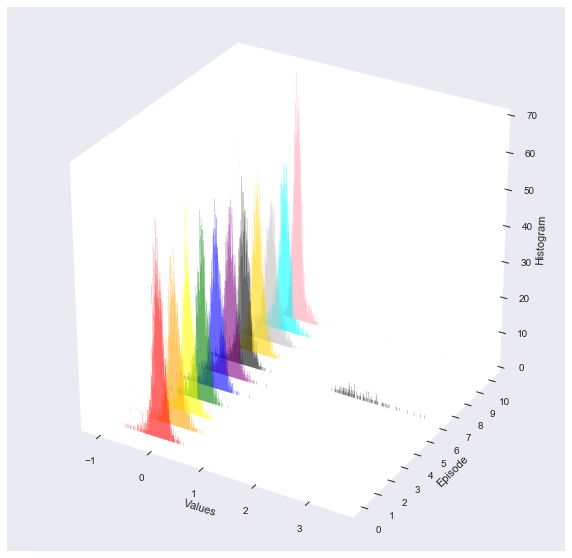

E  5


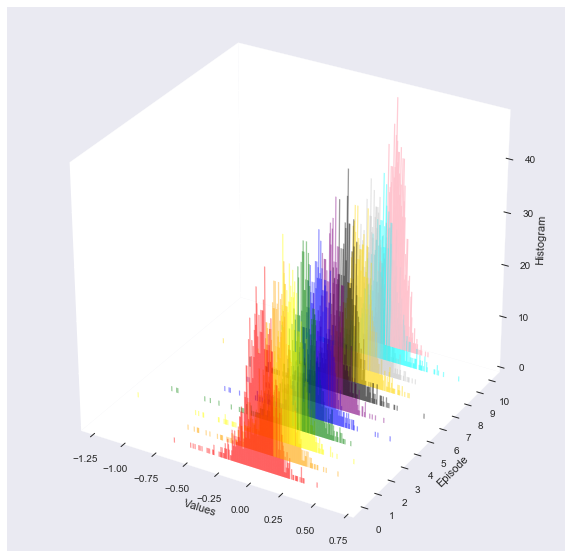

E  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.127	 Test Acc : 0.19	0.25 0.05
Current : 15	 Train Acc : 0.412	 Test Acc : 0.412	.45
Current : 30	 Train Acc : 0.463	 Test Acc : 0.442	.45
Current : 45	 Train Acc : 0.501	 Test Acc : 0.466	.55
Current : 60	 Train Acc : 0.536	 Test Acc : 0.487	.45
Current : 75	 Train Acc : 0.57	 Test Acc : 0.495	0.45
Current : 90	 Train Acc : 0.597	 Test Acc : 0.502	.55
Current : 105	 Train Acc : 0.619	 Test Acc : 0.508	.55
Current : 120	 Train Acc : 0.637	 Test Acc : 0.516	.55
Current : 135	 Train Acc : 0.653	 Test Acc : 0.516	.45
F  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.133	 Test Acc : 0.162	.25 0.05
Current : 15	 Train Acc : 0.41	 Test Acc : 0.405	0.55
Current : 30	 Train Acc : 0.455	 Test Acc : 0.426	.55
Current : 45	 Train Acc : 0.493	 Test Acc : 0.441	.55
Current : 60	 Train Acc : 0.531	 Test Acc : 0.459	.65
Current : 75	 Train Acc : 0.553	 Tes

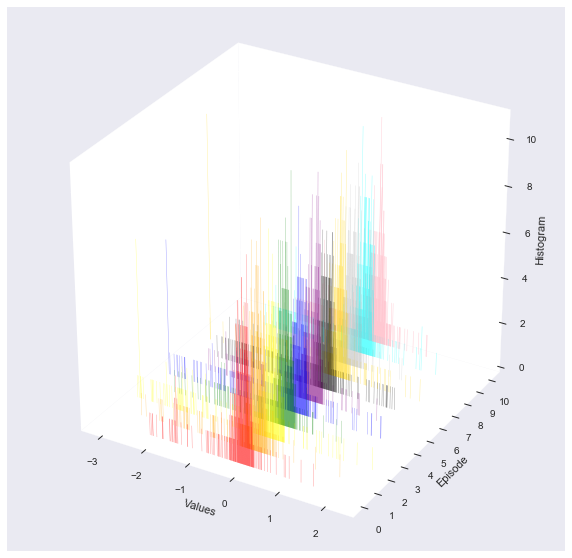

F  1


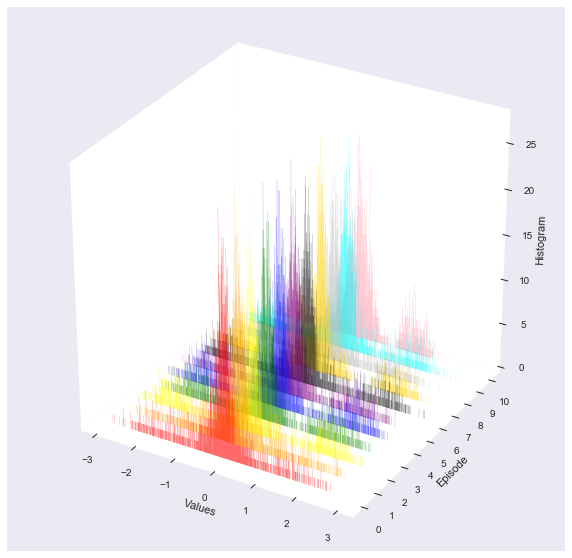

F  2


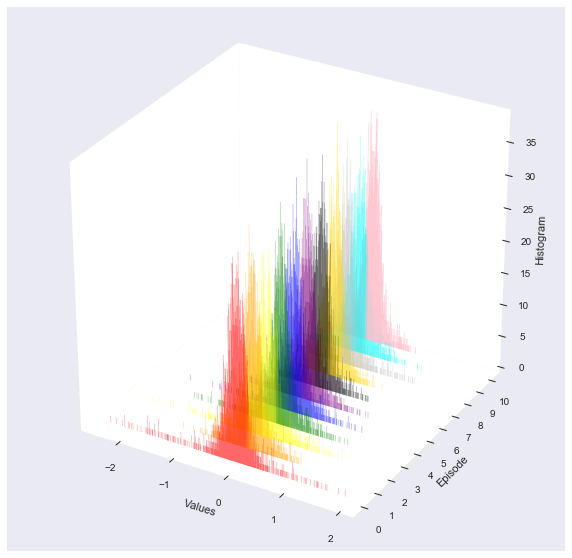

F  3


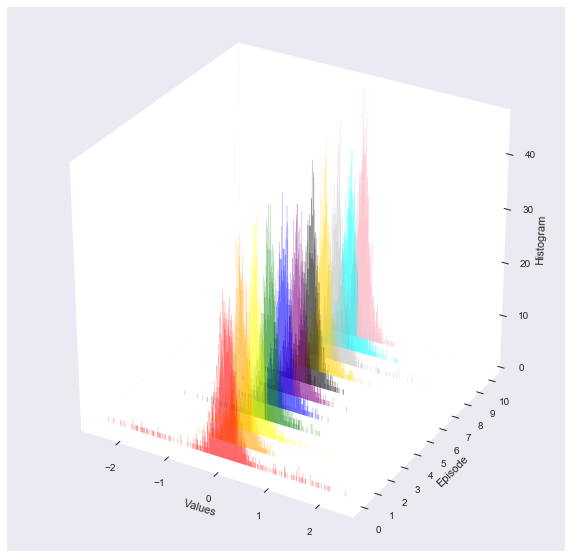

F  4


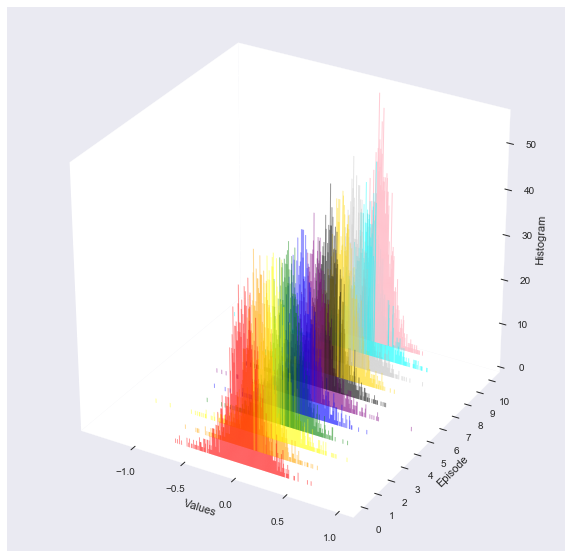

F  5


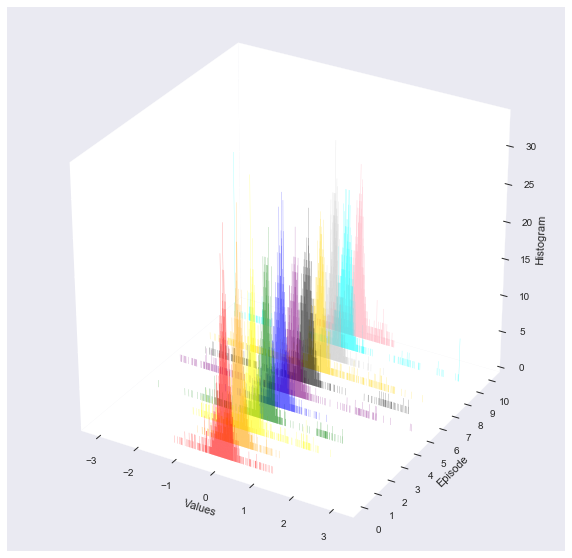

F  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.11	 Test Acc : 0.173	0.25 0.05
Current : 15	 Train Acc : 0.422	 Test Acc : 0.406	.45
Current : 30	 Train Acc : 0.478	 Test Acc : 0.435	.55
Current : 45	 Train Acc : 0.522	 Test Acc : 0.459	.55
Current : 60	 Train Acc : 0.558	 Test Acc : 0.474	.55
Current : 75	 Train Acc : 0.59	 Test Acc : 0.481	0.55
Current : 90	 Train Acc : 0.613	 Test Acc : 0.484	.55
Current : 105	 Train Acc : 0.635	 Test Acc : 0.485	.45
Current : 120	 Train Acc : 0.658	 Test Acc : 0.484	.45
Current : 135	 Train Acc : 0.678	 Test Acc : 0.485	.45
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.133	 Test Acc : 0.183	.15 0.05
Current : 15	 Train Acc : 0.435	 Test Acc : 0.417	.45
Current : 30	 Train Acc : 0.489	 Test Acc : 0.446	.55
Current : 45	 Train Acc : 0.536	 Test Acc : 0.468	.55
Current : 60	 Train Acc : 0.569	 Test Acc : 0.466	.55
Current : 75	 Train Acc : 0.592	 Tes

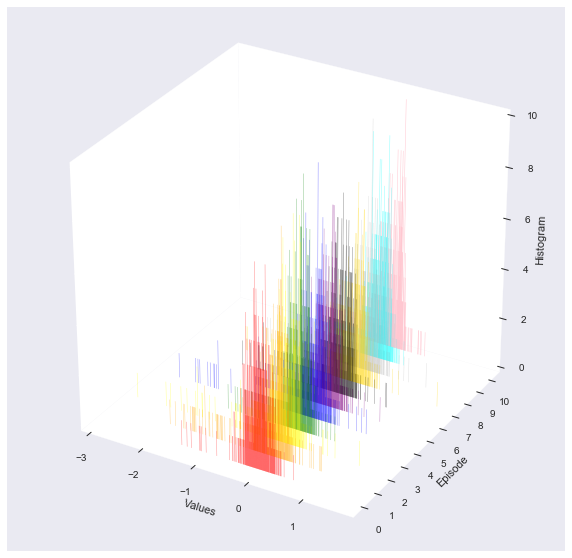

G  1


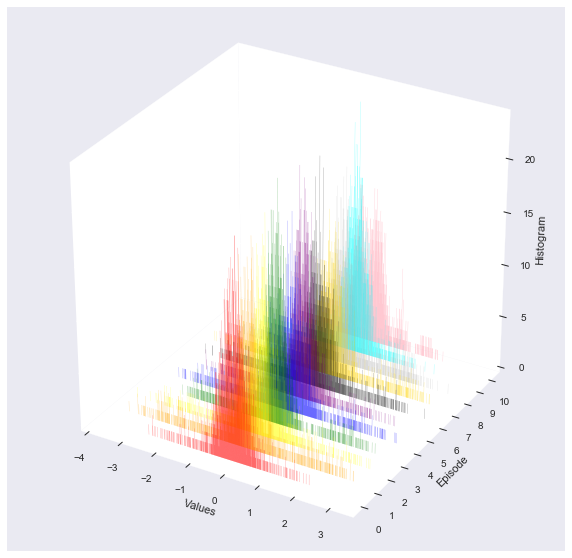

G  2


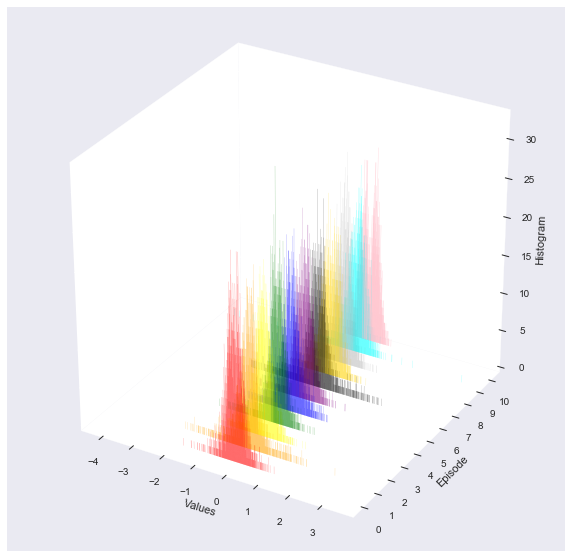

G  3


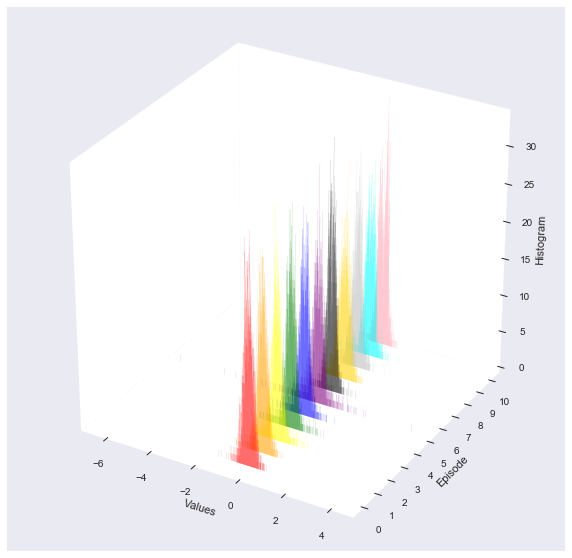

G  4


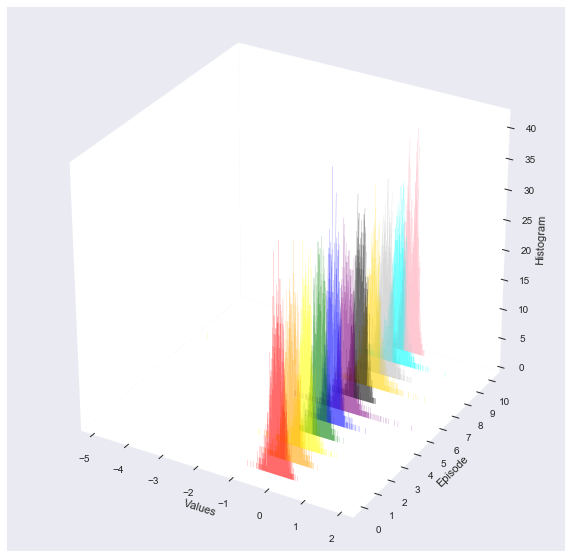

G  5


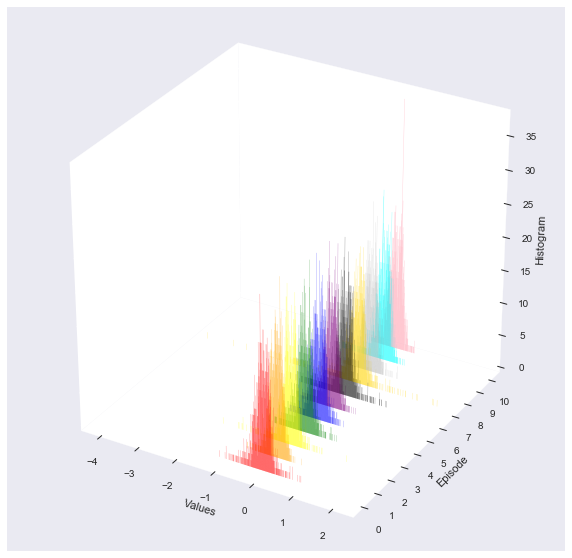

G  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.133	 Test Acc : 0.167	.15 0.05
Current : 15	 Train Acc : 0.408	 Test Acc : 0.401	.45
Current : 30	 Train Acc : 0.459	 Test Acc : 0.432	.45
Current : 45	 Train Acc : 0.498	 Test Acc : 0.454	.45
Current : 60	 Train Acc : 0.522	 Test Acc : 0.472	.45
Current : 75	 Train Acc : 0.545	 Test Acc : 0.478	.35
Current : 90	 Train Acc : 0.569	 Test Acc : 0.489	.35
Current : 105	 Train Acc : 0.585	 Test Acc : 0.493	.45
Current : 120	 Train Acc : 0.605	 Test Acc : 0.499	.35
Current : 135	 Train Acc : 0.633	 Test Acc : 0.51	0.35
H  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 1

Current : 0	 Train Acc : 0.133	 Test Acc : 0.171	.25 0.05
Current : 15	 Train Acc : 0.396	 Test Acc : 0.398	.45
Current : 30	 Train Acc : 0.447	 Test Acc : 0.417	.55
Current : 45	 Train Acc : 0.491	 Test Acc : 0.456	.55
Current : 60	 Train Acc : 0.527	 Test Acc : 0.481	.55
Current : 75	 Train Acc : 0.553	 Tes

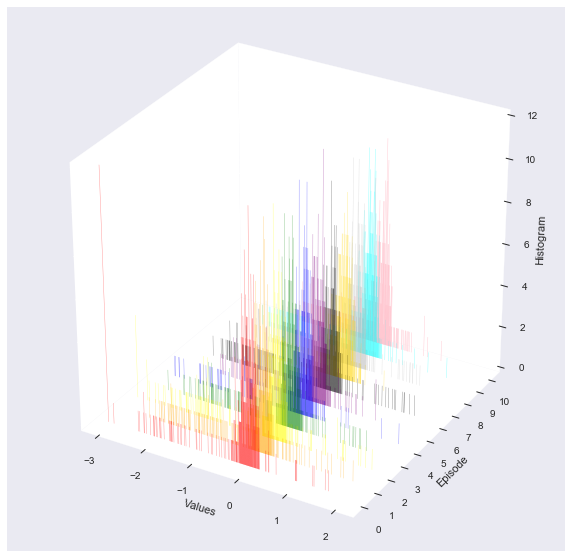

H  1


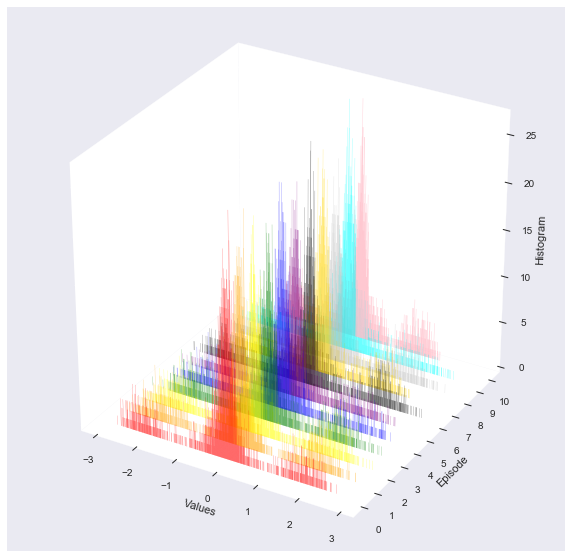

H  2


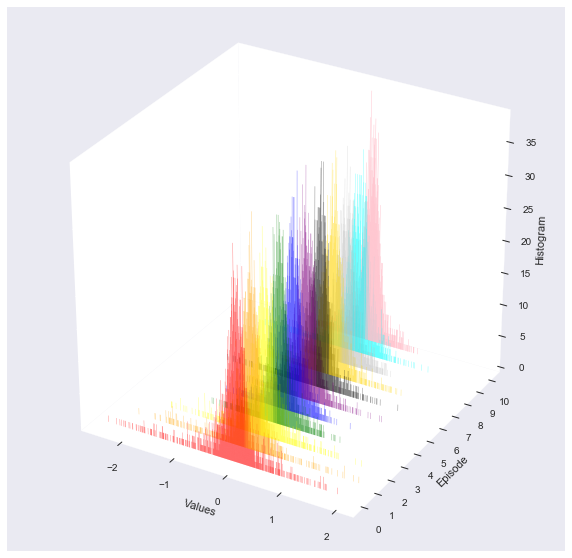

H  3


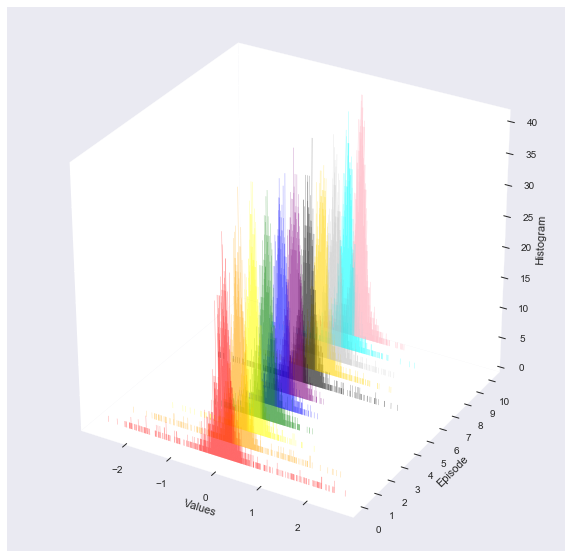

H  4


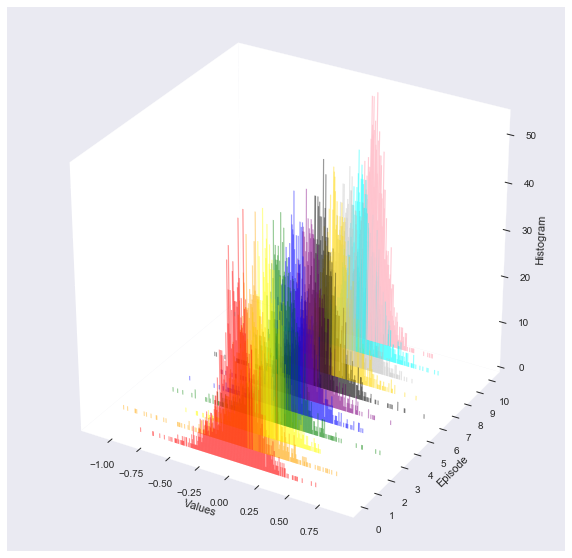

H  5


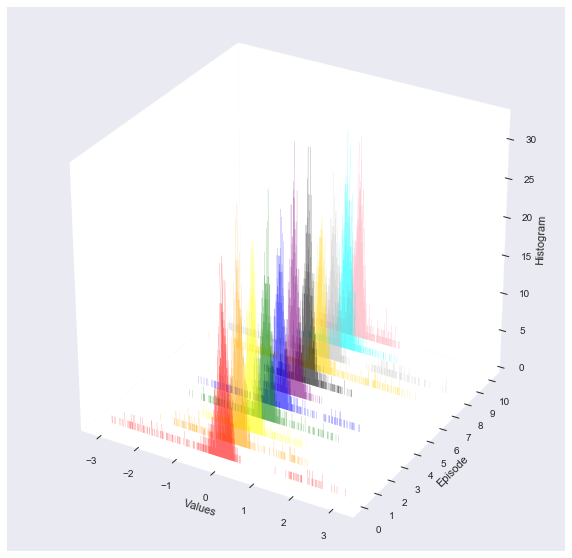

H  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15 0.05
Current : 15	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 30	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 45	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 60	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 75	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 90	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 105	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 120	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 135	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 1

Current : 0	 Train Acc : 0.102	 Test Acc : 0.1	 0.15 0.05
Current : 15	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 30	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 45	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 60	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 75	 Train Acc : 0.1	 Test 

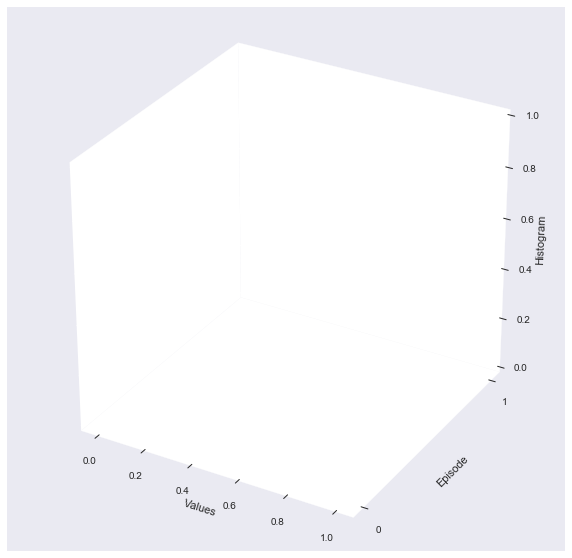

I  1


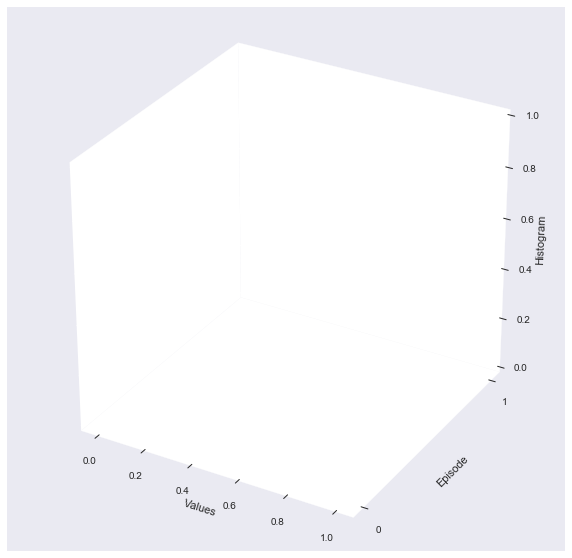

I  2


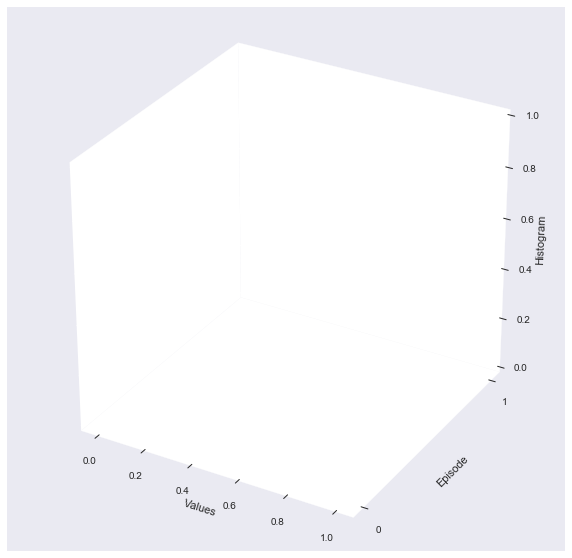

I  3


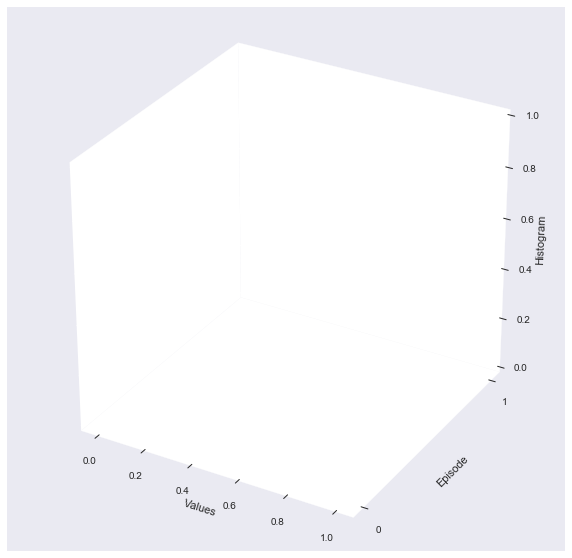

I  4


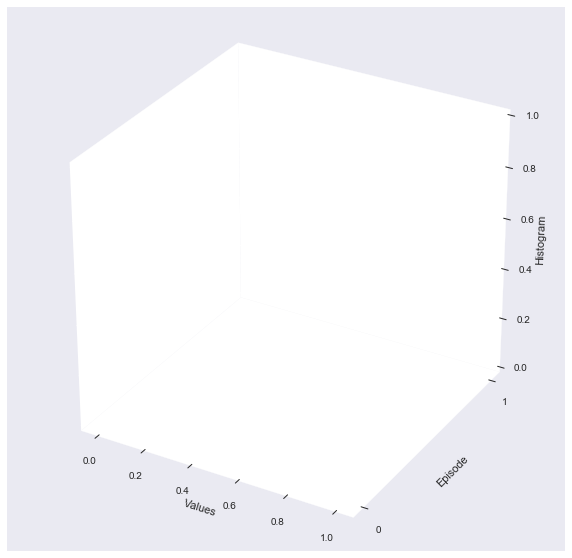

I  5


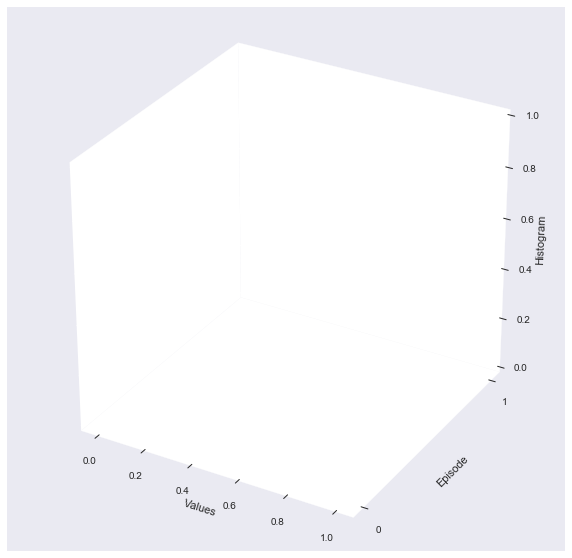

I  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.106	 Test Acc : 0.153	.15 0.05
Current : 15	 Train Acc : 0.34	 Test Acc : 0.348	0.45
Current : 30	 Train Acc : 0.405	 Test Acc : 0.39	0.45
Current : 45	 Train Acc : 0.434	 Test Acc : 0.414	.45
Current : 60	 Train Acc : 0.457	 Test Acc : 0.43	0.55
Current : 75	 Train Acc : 0.475	 Test Acc : 0.437	.55
Current : 90	 Train Acc : 0.492	 Test Acc : 0.443	.55
Current : 105	 Train Acc : 0.505	 Test Acc : 0.447	.55
Current : 120	 Train Acc : 0.517	 Test Acc : 0.45	0.55
Current : 135	 Train Acc : 0.525	 Test Acc : 0.447	.55
J  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.11	 Test Acc : 0.167	0.15 0.05
Current : 15	 Train Acc : 0.344	 Test Acc : 0.353	.45
Current : 30	 Train Acc : 0.391	 Test Acc : 0.387	.45
Current : 45	 Train Acc : 0.417	 Test Acc : 0.414	.35
Current : 60	 Train Acc : 0.446	 Test Acc : 0.433	.35
Current : 75	 Train Acc : 0.468	 Tes

In [ ]:
# all the experiemnt (no batch)
current_batch_norm_type = 'no_batch_cnn_STL'
all_the_exp = ['Z','A','B','C','D','E','F','G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,3,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); 
        l2 = CNN(3,16,16,which_reg=current_exp_name); 
        l3 = CNN(3,16,16,which_reg=current_exp_name); 

        l4 = CNN(3,16,16,which_reg=current_exp_name); 
        l5 = CNN(3,16,16,which_reg=current_exp_name); 
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,96,96,3))
        y = tf.placeholder(tf.float32,(batch_size,10))

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer2, layer2a = l2. feedforward(layer1a,stride=2)
        layer3, layer3a = l3. feedforward(layer2a,stride=2)
        layer4, layer4a = l4. feedforward(layer3a,stride=2)
        layer5, layer5a = l5. feedforward(layer4a)
        layer6, layer6a = l6. feedforward(layer5a)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,6,6,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5p,grad5w,grad5_up = l5.backprop(grad6p)
        grad4p,grad4w,grad4_up = l4.backprop(grad5p,stride=2)
        grad3p,grad3w,grad3_up = l3.backprop(grad4p,stride=2)
        grad2p,grad2w,grad2_up = l2.backprop(grad3p,stride=2)
        grad1p,grad1w,grad1_up = l1.backprop(grad2p,stride=2)

        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%15 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()

    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                         current_weights_layer4,current_weights_layer5,current_weights_layer6,
                         current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)


                    Starting Episode: 0

Current : 0	 Train Acc : 0.102	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 1

Current : 0	 Train Acc : 0.102	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 2

Current : 0	 Train Acc : 0.102	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 3

Current : 0	 Train Acc : 0.103	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
I 

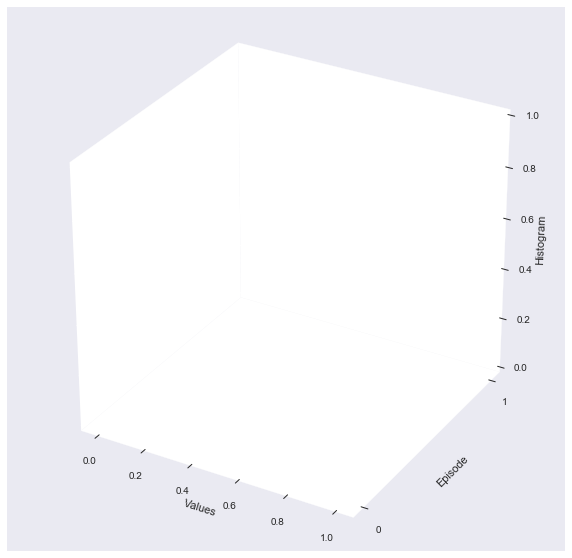

I  1


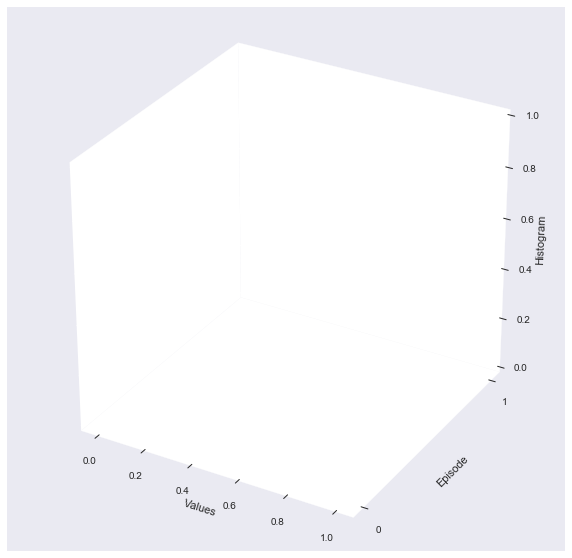

I  2


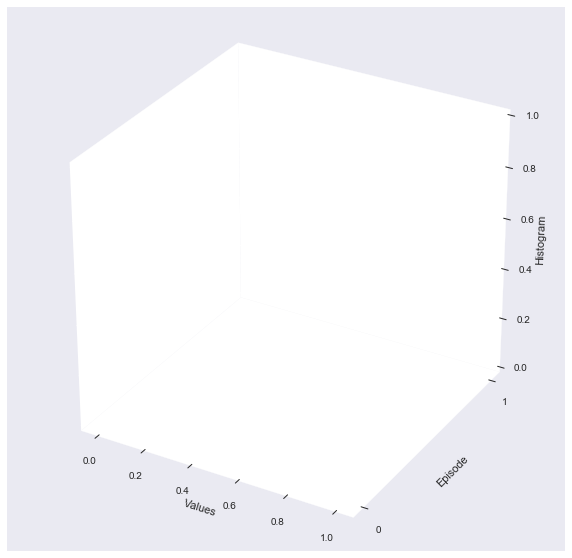

I  3


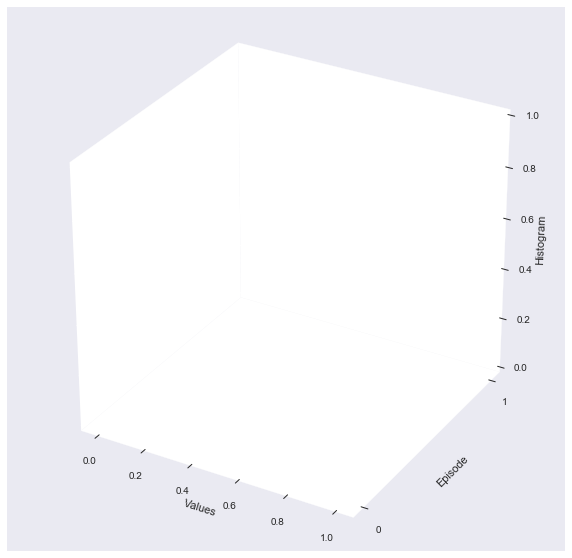

I  4


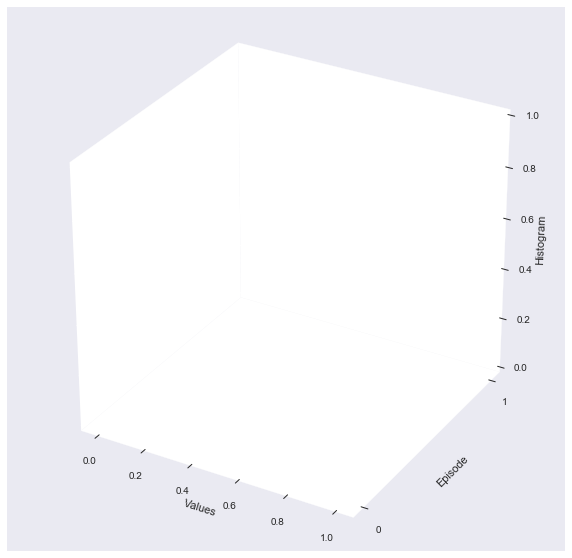

I  5


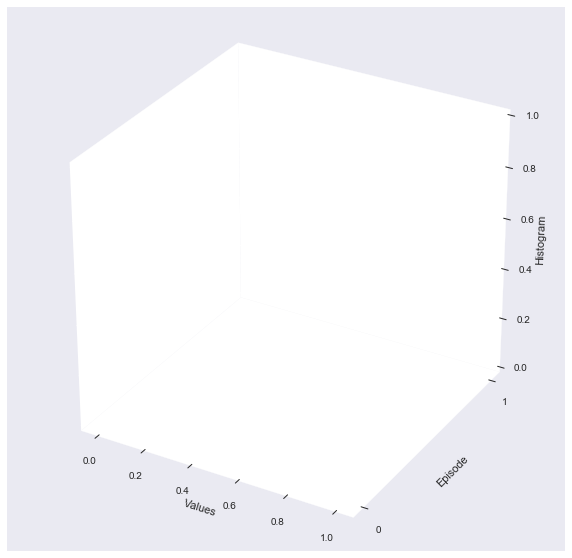

I  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.109	 Test Acc : 0.18	0.25 0.05
Current : 50	 Train Acc : 0.426	 Test Acc : 0.413	.45
Current : 100	 Train Acc : 0.485	 Test Acc : 0.457	.55
J  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.11	 Test Acc : 0.153	0.15 0.05
Current : 50	 Train Acc : 0.432	 Test Acc : 0.423	.45
Current : 100	 Train Acc : 0.511	 Test Acc : 0.468	.55
J  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.106	 Test Acc : 0.187	.15 0.05
Current : 50	 Train Acc : 0.448	 Test Acc : 0.431	.45
Current : 100	 Train Acc : 0.504	 Test Acc : 0.471	.55
J  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 3

Current : 0	 Train Acc : 0.117	 Test Acc : 0.139	.15 0.05
Current : 50	 Train Acc : 0.429	 Test Acc : 0.415	.45
Current : 100	 Train Acc : 0.481	 Test Acc : 0.451	.

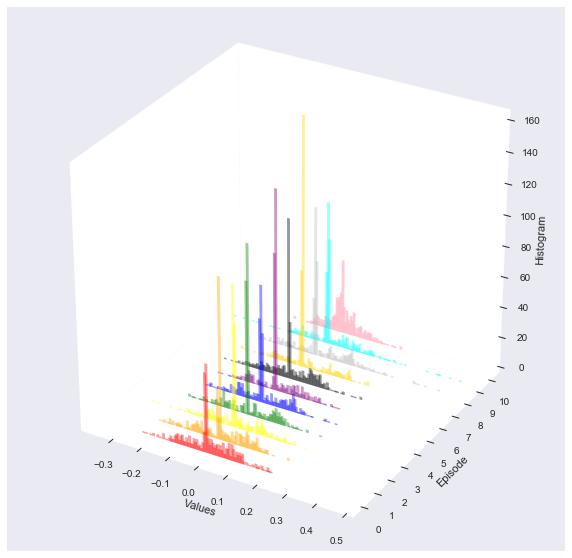

J  1


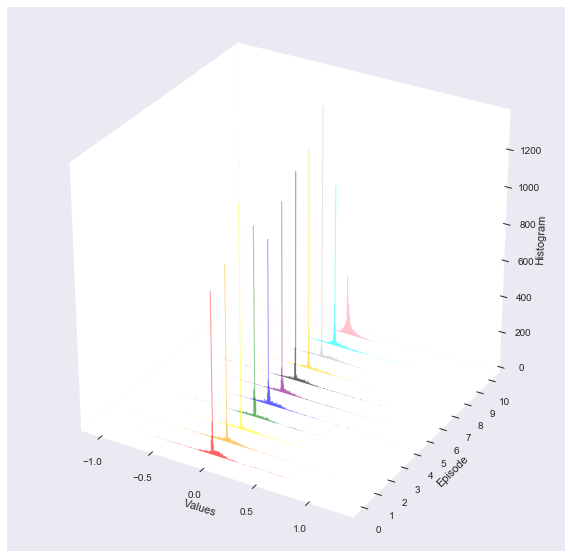

J  2


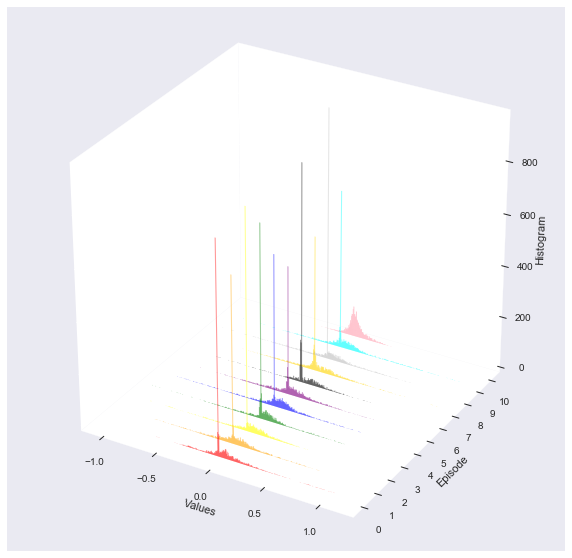

J  3


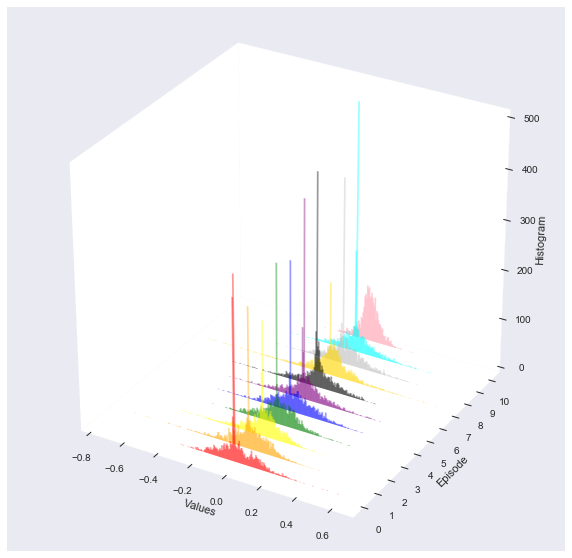

J  4


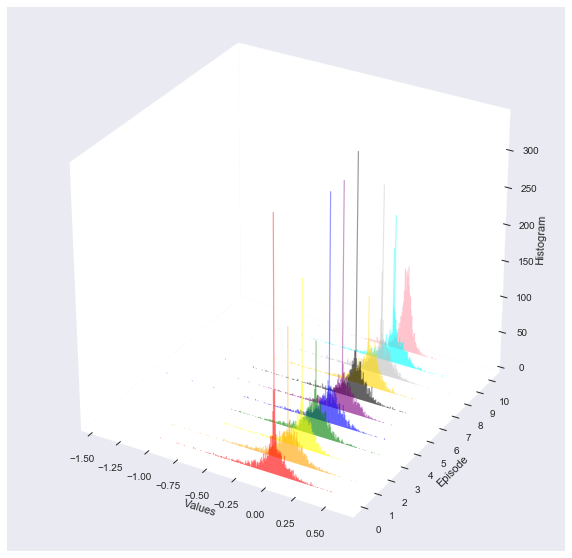

J  5


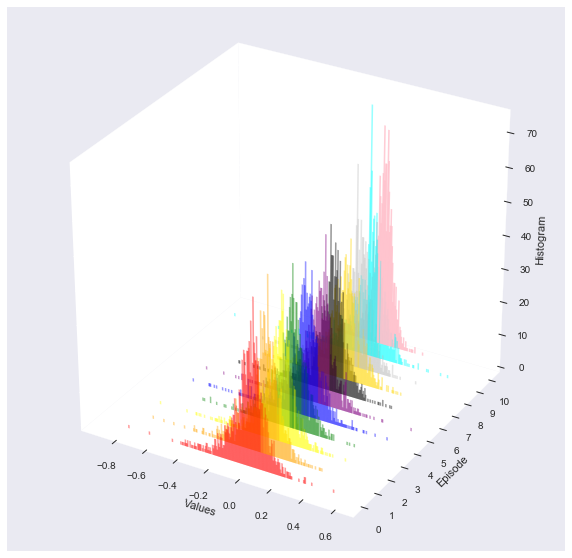

J  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.097	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
K  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 1

Current : 0	 Train Acc : 0.097	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
K  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 2

Current : 0	 Train Acc : 0.097	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
K  Current Iter : 149/150 batch : 7980/8000 acc : 0.15
                    Starting Episode: 3

Current : 0	 Train Acc : 0.097	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.15
Current : 100	 Train Acc : 0.1	 Test Acc : 0.1	 : 0.

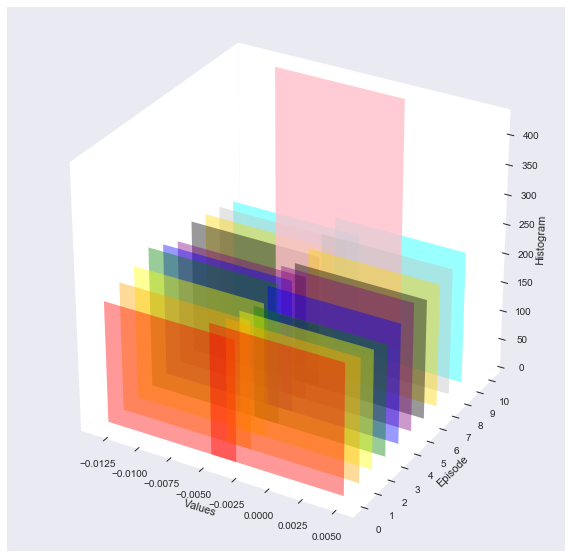

K  1


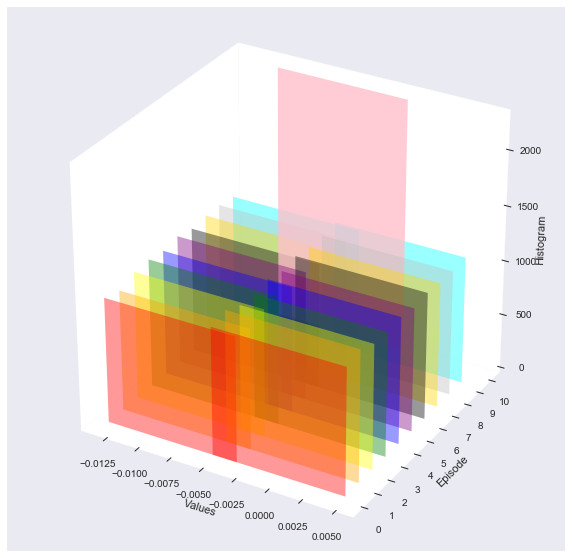

K  2


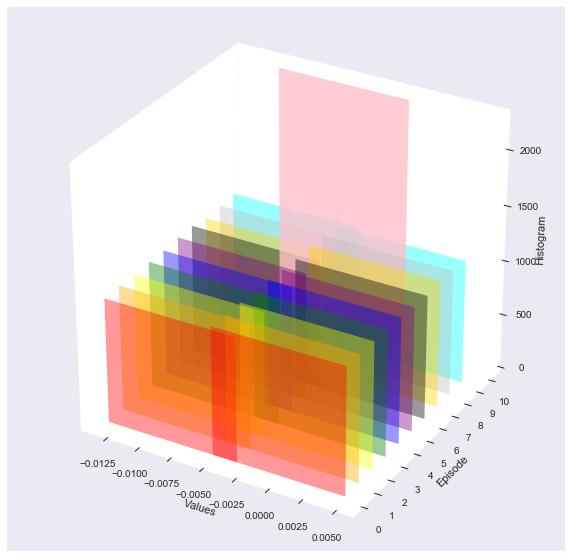

K  3


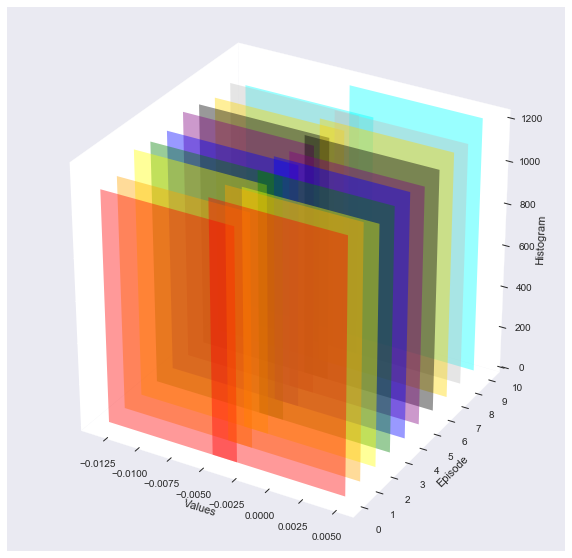

K  4


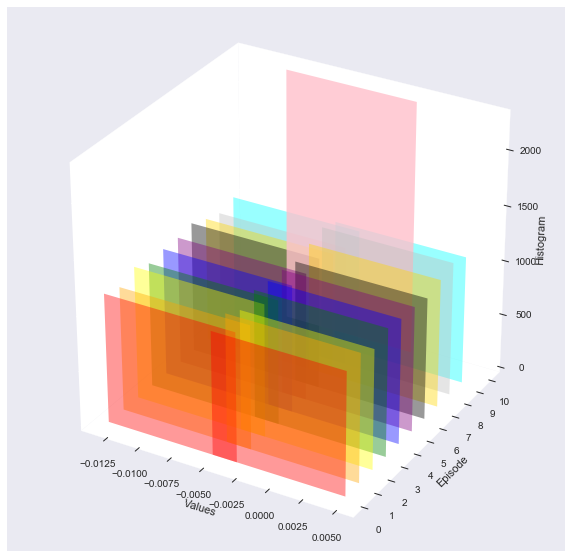

K  5


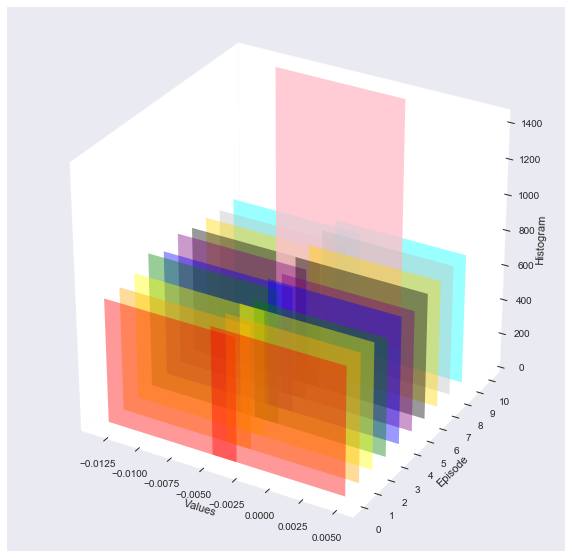

K  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.094	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.408	 Test Acc : 0.391	.45
Current : 100	 Train Acc : 0.483	 Test Acc : 0.451	.55
L  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.097	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.463	 Test Acc : 0.438	.55
Current : 100	 Train Acc : 0.536	 Test Acc : 0.467	.55
L  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 2

Current : 0	 Train Acc : 0.099	 Test Acc : 0.1	 0.15 0.05
Current : 50	 Train Acc : 0.439	 Test Acc : 0.418	.45
Current : 100	 Train Acc : 0.525	 Test Acc : 0.457	.45
L  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 3

Current : 0	 Train Acc : 0.094	 Test Acc : 0.1	 0.25 0.05
Current : 50	 Train Acc : 0.457	 Test Acc : 0.424	.35
Current : 100	 Train Acc : 0.522	 Test Acc : 0.459	.

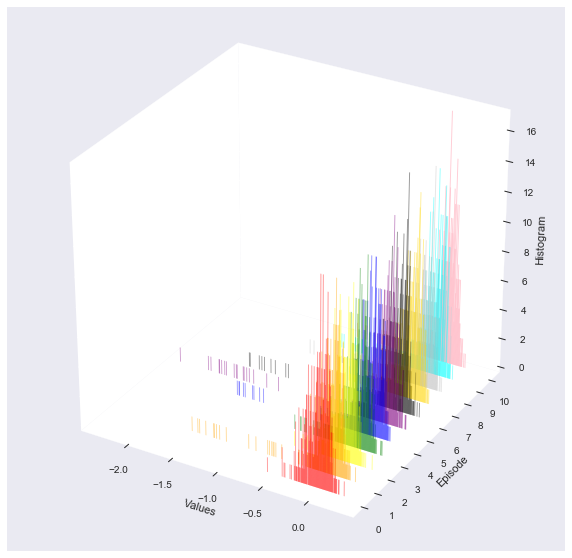

L  1


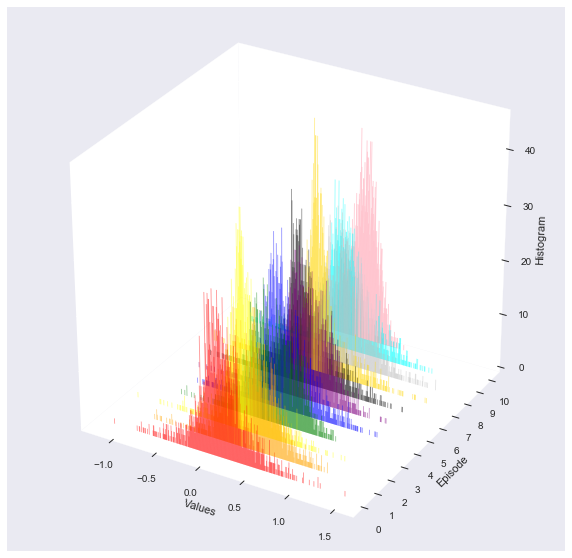

L  2


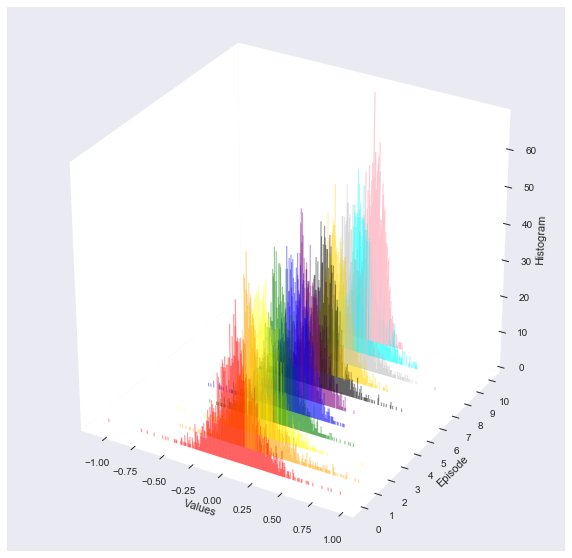

L  3


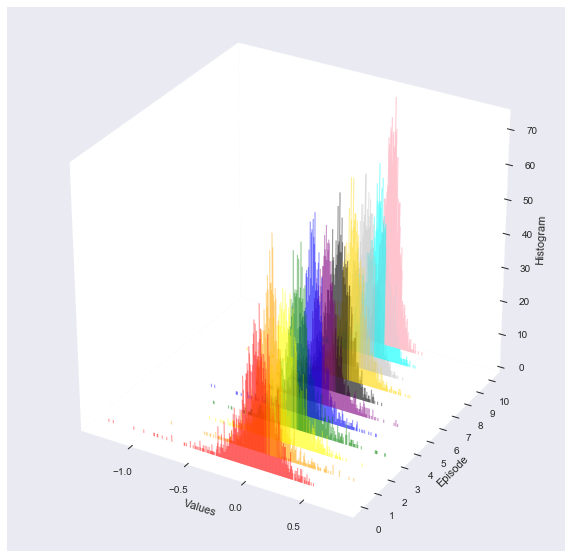

L  4


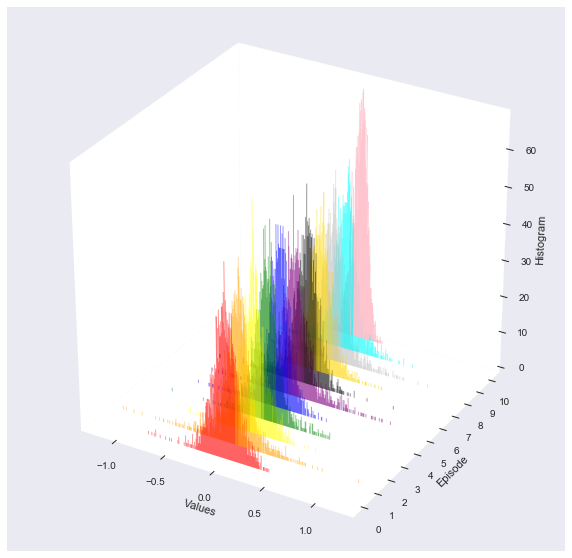

L  5


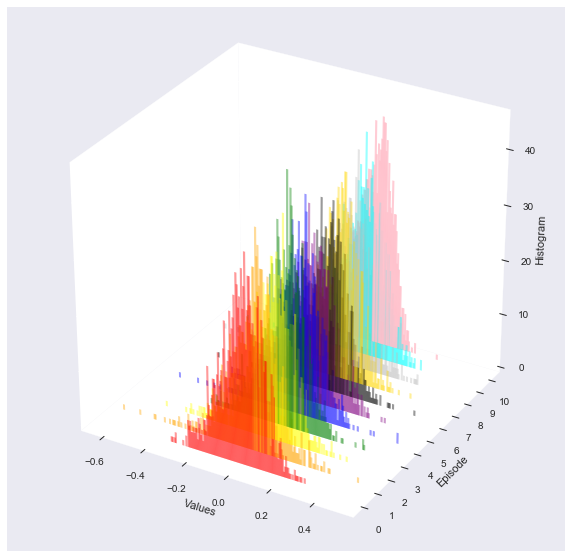

L  6


In [8]:
# all the experiemnt (no batch)
current_batch_norm_type = 'no_batch_cnn_STL'
all_the_exp = ['I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,3,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); 
        l2 = CNN(3,16,16,which_reg=current_exp_name); 
        l3 = CNN(3,16,16,which_reg=current_exp_name); 

        l4 = CNN(3,16,16,which_reg=current_exp_name); 
        l5 = CNN(3,16,16,which_reg=current_exp_name); 
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,96,96,3))
        y = tf.placeholder(tf.float32,(batch_size,10))

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer2, layer2a = l2. feedforward(layer1a,stride=2)
        layer3, layer3a = l3. feedforward(layer2a,stride=2)
        layer4, layer4a = l4. feedforward(layer3a,stride=2)
        layer5, layer5a = l5. feedforward(layer4a)
        layer6, layer6a = l6. feedforward(layer5a)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,6,6,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5p,grad5w,grad5_up = l5.backprop(grad6p)
        grad4p,grad4w,grad4_up = l4.backprop(grad5p,stride=2)
        grad3p,grad3w,grad3_up = l3.backprop(grad4p,stride=2)
        grad2p,grad2w,grad2_up = l2.backprop(grad3p,stride=2)
        grad1p,grad1w,grad1_up = l1.backprop(grad2p,stride=2)

        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()

    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                         current_weights_layer4,current_weights_layer5,current_weights_layer6,
                         current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

In [15]:
# set hyper parameter
plt.rcParams.update({'font.size': 25})
num_eps   = 10; num_epoch = 150; learning_rate = 0.0008; batch_size = 20; beta1,beta2,adam_e = 0.9,0.999,1e-9; lamda = 0.0001


                    Starting Episode: 0

Current : 0	 Train Acc : 0.282	 Test Acc : 0.319	.45 0.15
Current : 50	 Train Acc : 0.792	 Test Acc : 0.461	.65
Current : 100	 Train Acc : 0.936	 Test Acc : 0.43	0.35
Z  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.276	 Test Acc : 0.317	.55 0.15
Current : 50	 Train Acc : 0.782	 Test Acc : 0.441	.55
Current : 100	 Train Acc : 0.919	 Test Acc : 0.421	.55
Z  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.271	 Test Acc : 0.331	.45 0.15
Current : 50	 Train Acc : 0.798	 Test Acc : 0.435	.55
Current : 100	 Train Acc : 0.931	 Test Acc : 0.405	.55
Z  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 3

Current : 0	 Train Acc : 0.273	 Test Acc : 0.32	0.45 0.15
Current : 50	 Train Acc : 0.799	 Test Acc : 0.432	.55
Current : 100	 Train Acc : 0.938	 Test Acc : 0.415	.35
Z 

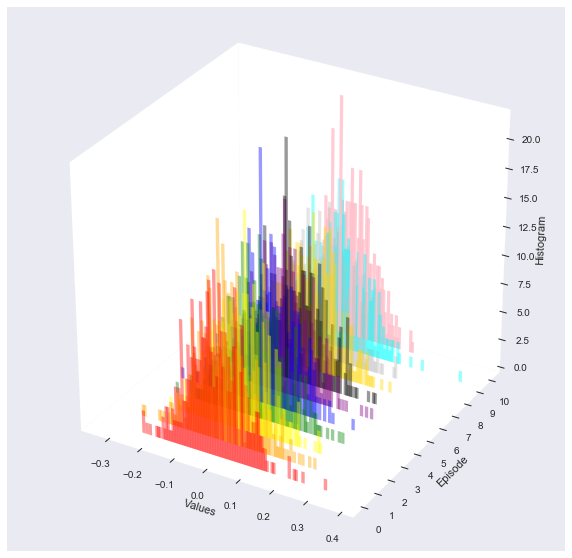

Z  1


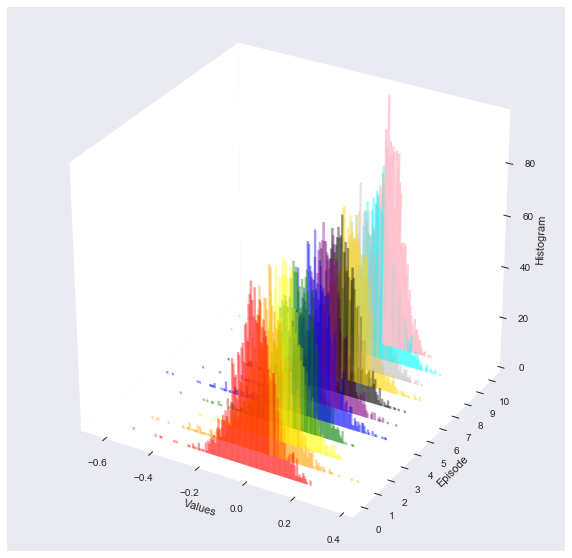

Z  2


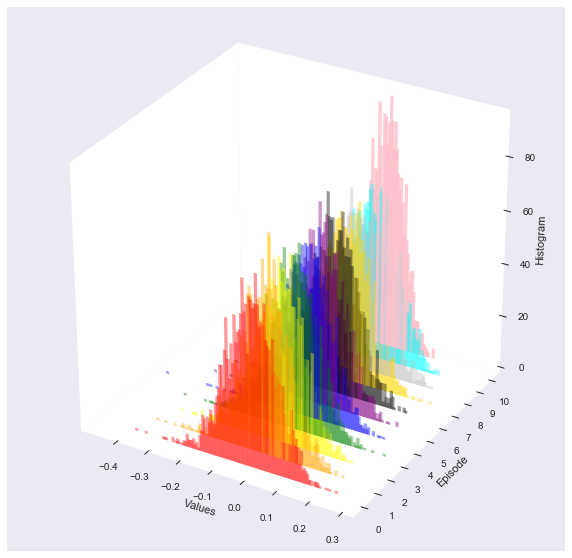

Z  3


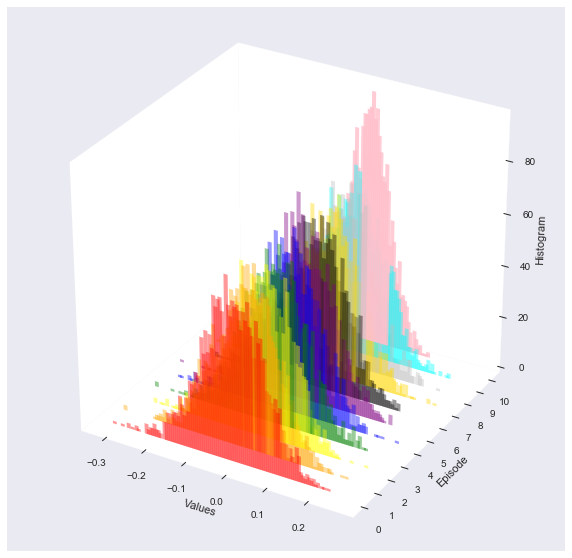

Z  4


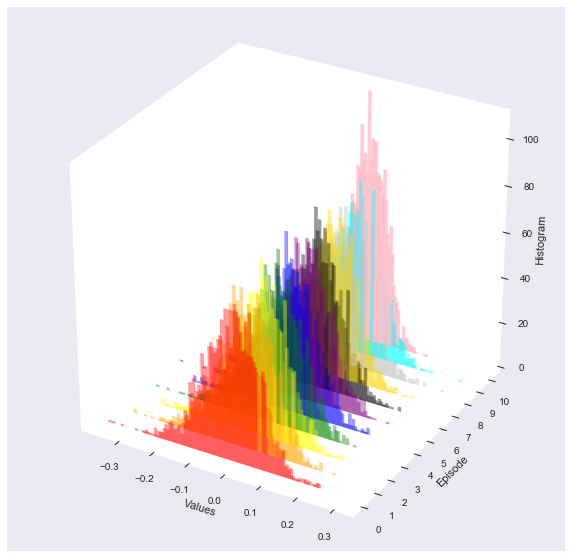

Z  5


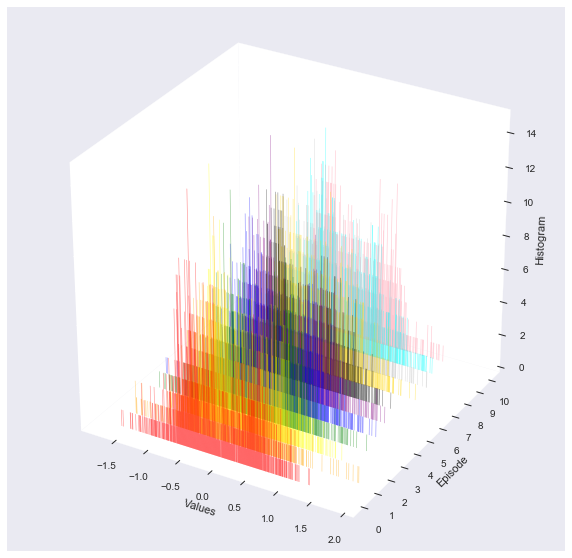

Z  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.283	 Test Acc : 0.273	.45 0.15
Current : 50	 Train Acc : 0.78	 Test Acc : 0.435	0.65
Current : 100	 Train Acc : 0.914	 Test Acc : 0.41	0.65
A  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.279	 Test Acc : 0.259	.15 0.15
Current : 50	 Train Acc : 0.803	 Test Acc : 0.439	.55
Current : 100	 Train Acc : 0.939	 Test Acc : 0.408	.45
A  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.278	 Test Acc : 0.297	.25 0.15
Current : 50	 Train Acc : 0.807	 Test Acc : 0.431	.45
Current : 100	 Train Acc : 0.939	 Test Acc : 0.415	.45
A  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 3

Current : 0	 Train Acc : 0.272	 Test Acc : 0.291	.45 0.15
Current : 50	 Train Acc : 0.803	 Test Acc : 0.445	.55
Current : 100	 Train Acc : 0.956	 Test Acc : 0.413	.

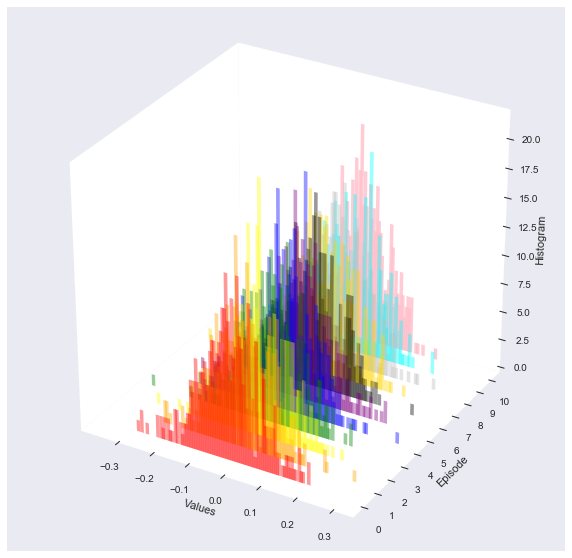

A  1


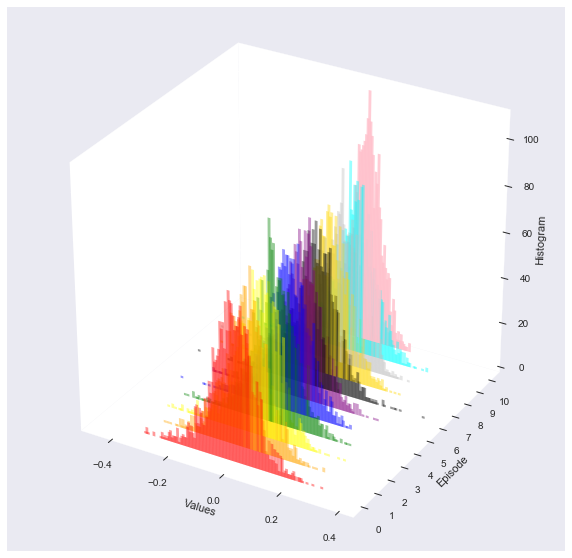

A  2


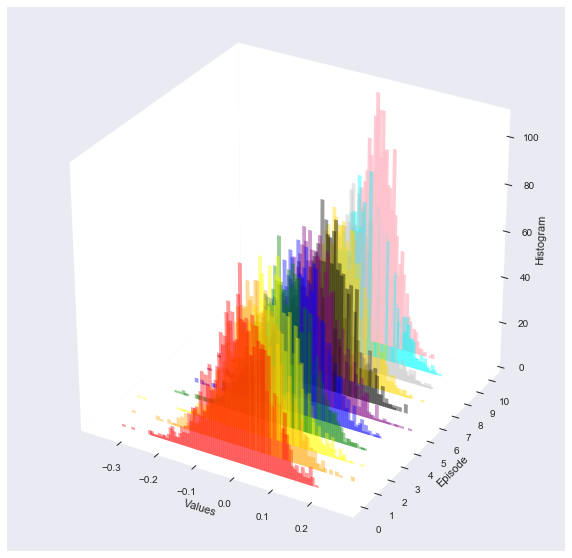

A  3


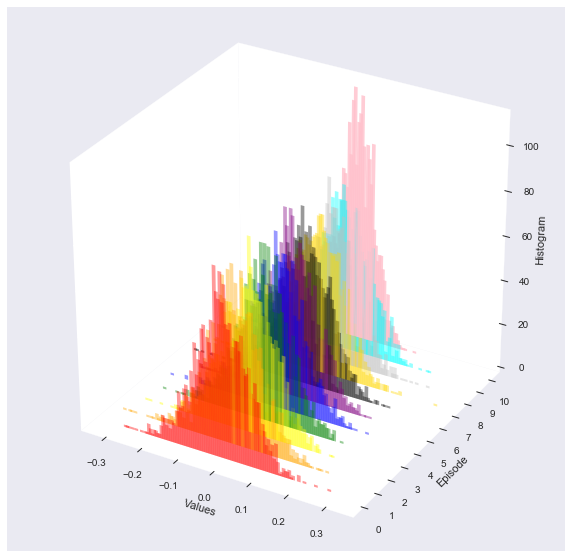

A  4


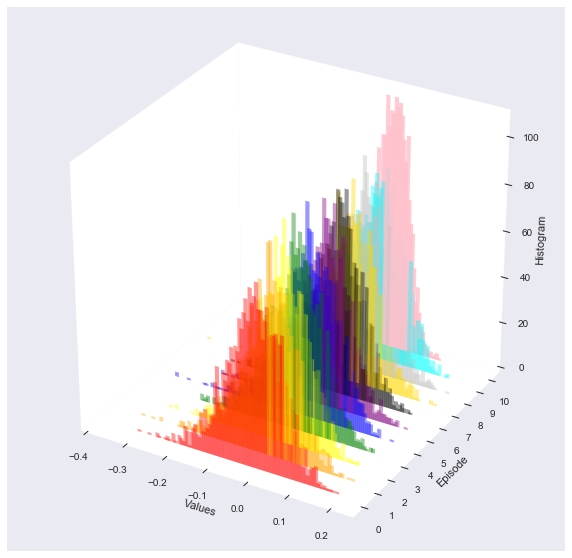

A  5


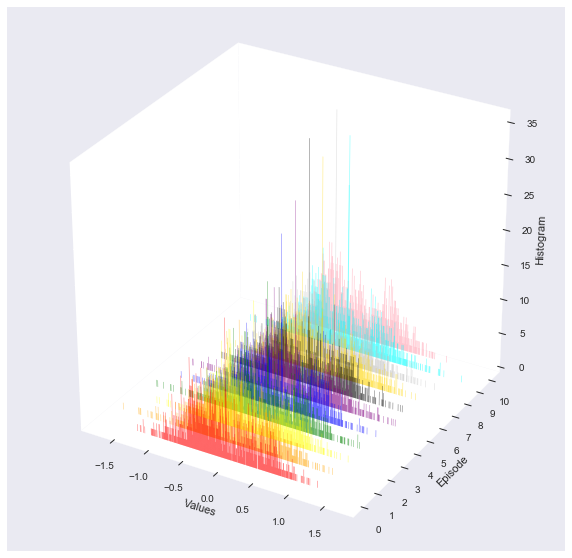

A  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.275	 Test Acc : 0.305	.35 0.15
Current : 50	 Train Acc : 0.816	 Test Acc : 0.432	.35
Current : 100	 Train Acc : 0.942	 Test Acc : 0.403	.45
B  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.27	 Test Acc : 0.323	0.35 0.15
Current : 50	 Train Acc : 0.8	 Test Acc : 0.451	 0.55
Current : 100	 Train Acc : 0.94	 Test Acc : 0.42	 0.55
B  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 2

Current : 0	 Train Acc : 0.273	 Test Acc : 0.322	.35 0.15
Current : 50	 Train Acc : 0.804	 Test Acc : 0.434	.45
Current : 100	 Train Acc : 0.936	 Test Acc : 0.414	.45
B  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 3

Current : 0	 Train Acc : 0.273	 Test Acc : 0.291	.35 0.15
Current : 50	 Train Acc : 0.8	 Test Acc : 0.459	 0.65
Current : 100	 Train Acc : 0.938	 Test Acc : 0.438	.

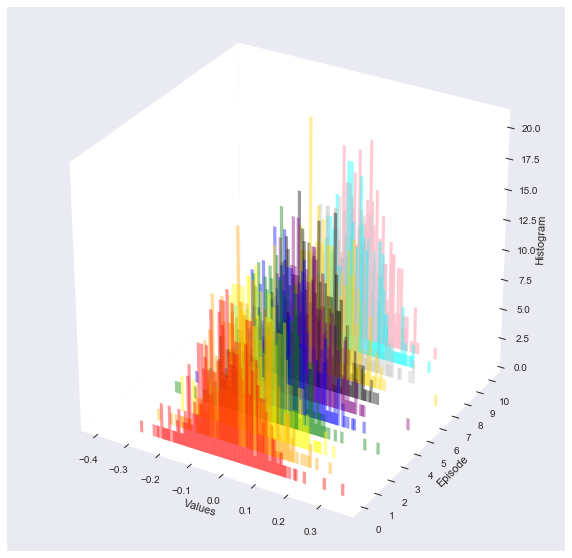

B  1


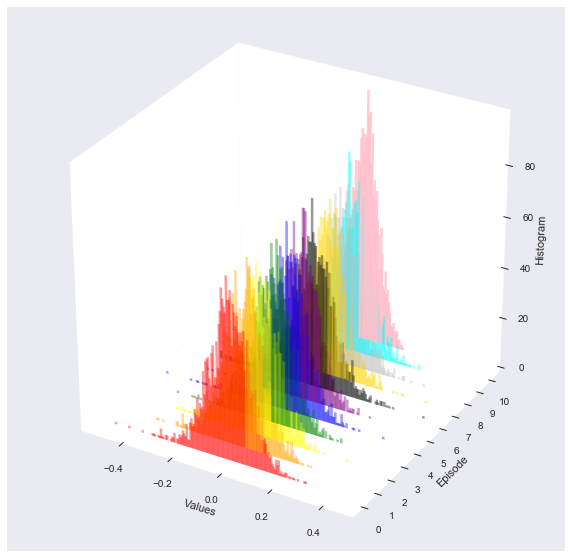

B  2


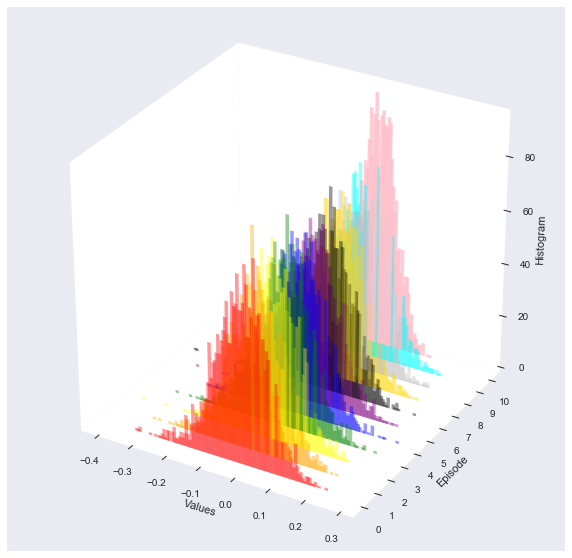

B  3


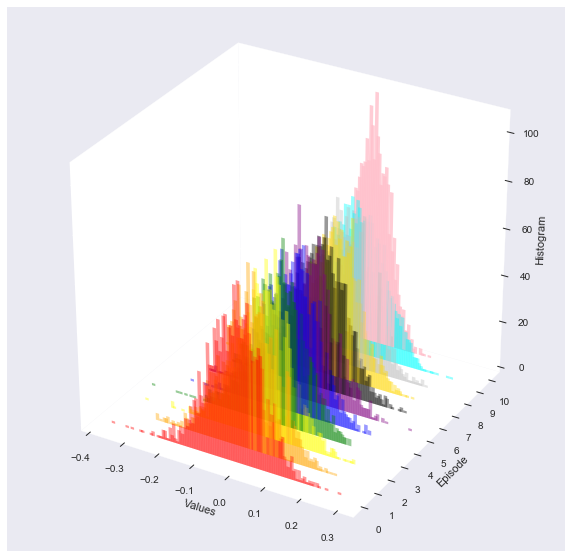

B  4


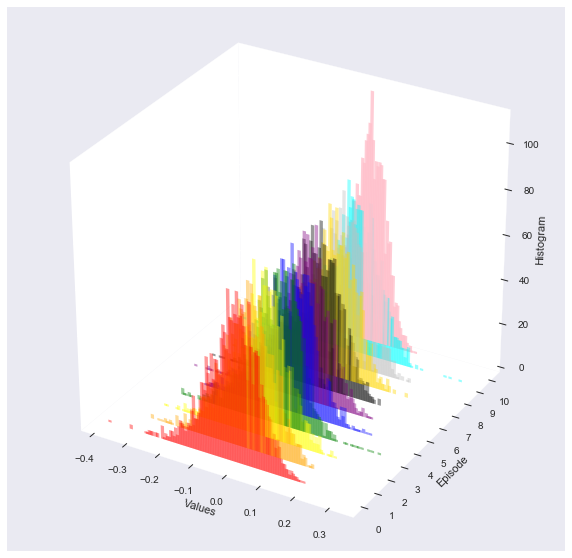

B  5


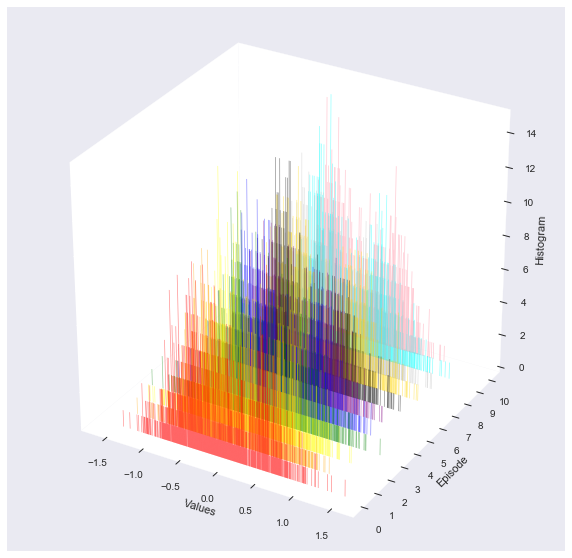

B  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.271	 Test Acc : 0.315	.45 0.15
Current : 50	 Train Acc : 0.799	 Test Acc : 0.45	0.65
Current : 100	 Train Acc : 0.931	 Test Acc : 0.415	.55
C  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.272	 Test Acc : 0.313	.35 0.15
Current : 50	 Train Acc : 0.8	 Test Acc : 0.458	 0.45
Current : 100	 Train Acc : 0.936	 Test Acc : 0.42	0.55
C  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 2

Current : 0	 Train Acc : 0.276	 Test Acc : 0.322	.35 0.15
Current : 50	 Train Acc : 0.811	 Test Acc : 0.453	.45
Current : 100	 Train Acc : 0.939	 Test Acc : 0.429	.45
C  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 3

Current : 0	 Train Acc : 0.27	 Test Acc : 0.283	0.35 0.15
Current : 50	 Train Acc : 0.791	 Test Acc : 0.439	.45
Current : 100	 Train Acc : 0.929	 Test Acc : 0.423	.

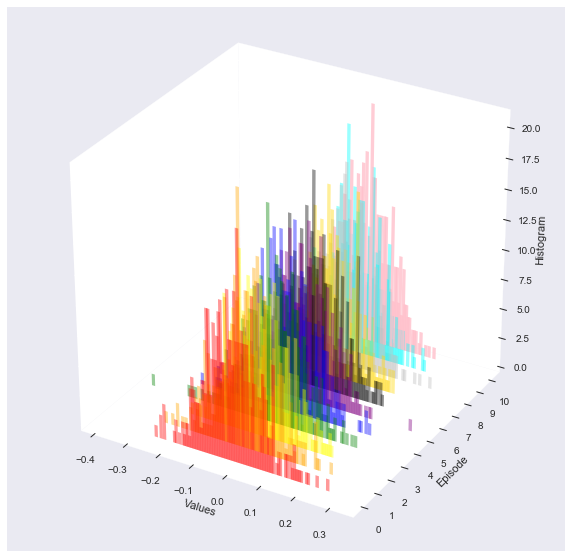

C  1


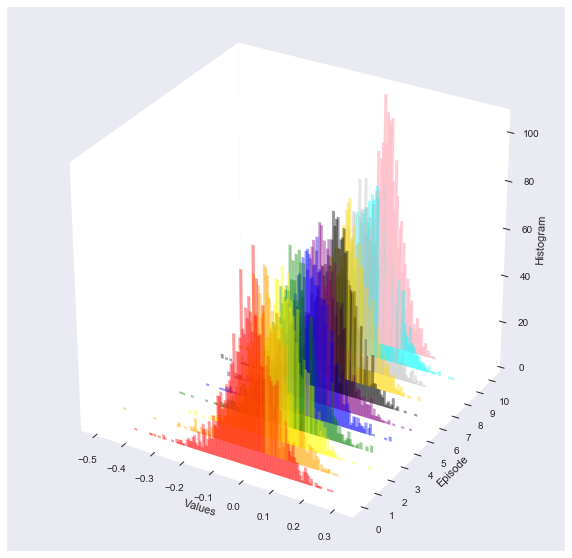

C  2


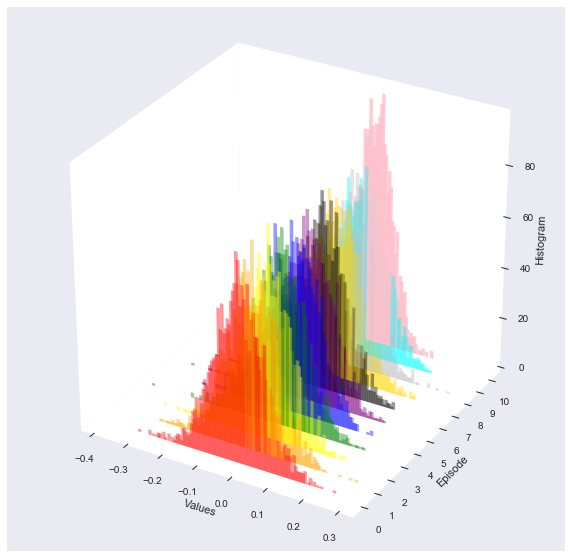

C  3


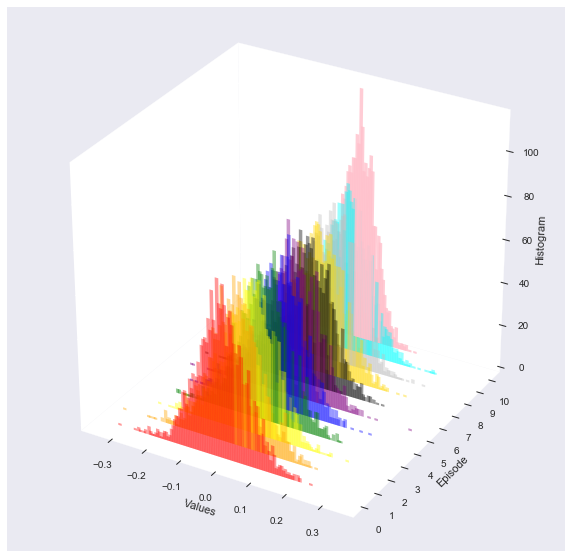

C  4


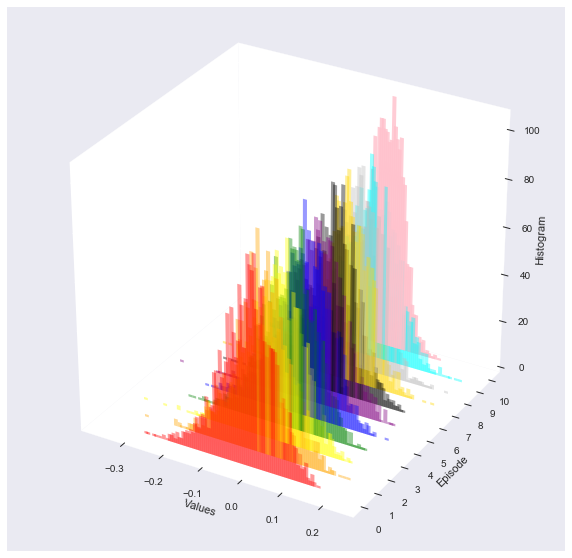

C  5


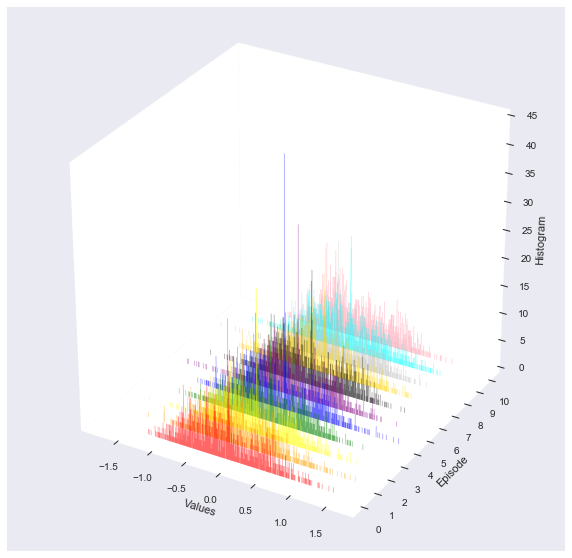

C  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.271	 Test Acc : 0.298	.45 0.15
Current : 50	 Train Acc : 0.782	 Test Acc : 0.457	.55
Current : 100	 Train Acc : 0.93	 Test Acc : 0.419	0.45
D  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 1

Current : 0	 Train Acc : 0.274	 Test Acc : 0.309	.35 0.15
Current : 50	 Train Acc : 0.79	 Test Acc : 0.411	0.45
Current : 100	 Train Acc : 0.933	 Test Acc : 0.401	.35
D  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.276	 Test Acc : 0.315	.35 0.15
Current : 50	 Train Acc : 0.781	 Test Acc : 0.462	.55
Current : 100	 Train Acc : 0.929	 Test Acc : 0.433	.45
D  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 3

Current : 0	 Train Acc : 0.274	 Test Acc : 0.331	.45 0.15
Current : 50	 Train Acc : 0.79	 Test Acc : 0.448	0.45
Current : 100	 Train Acc : 0.933	 Test Acc : 0.428	.

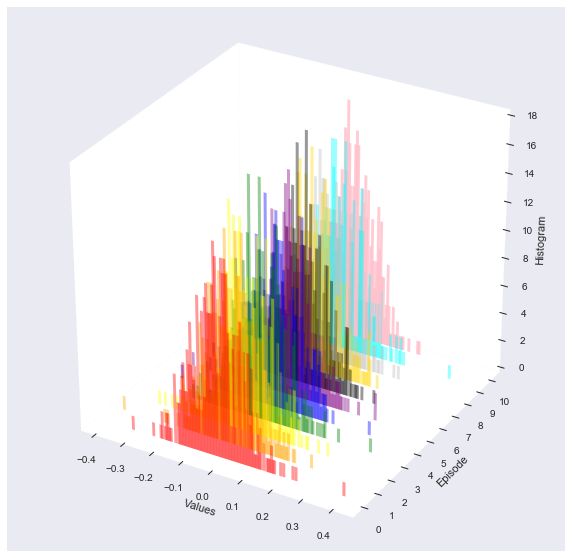

D  1


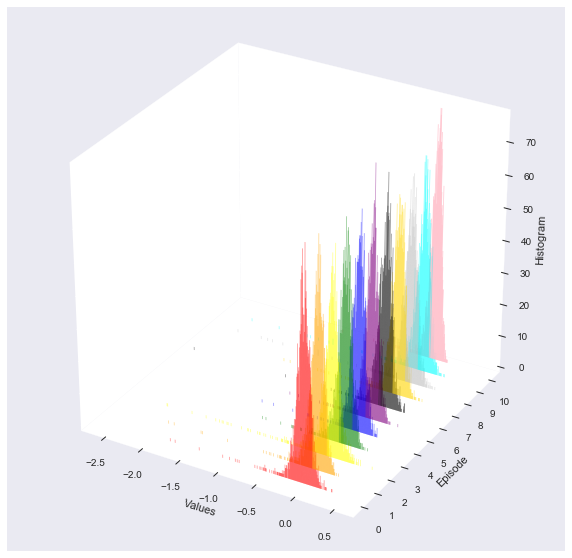

D  2


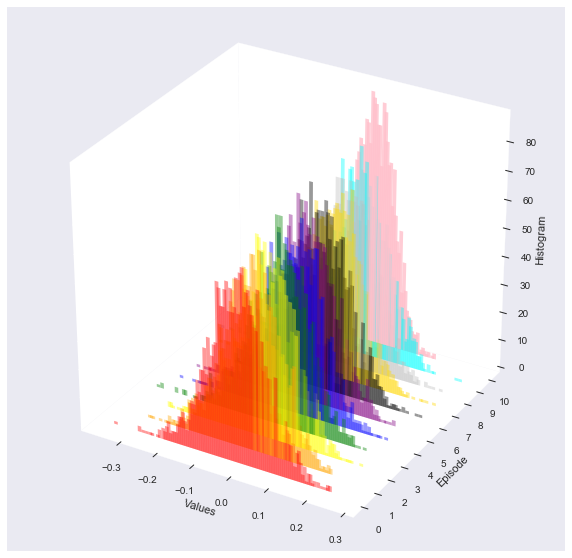

D  3


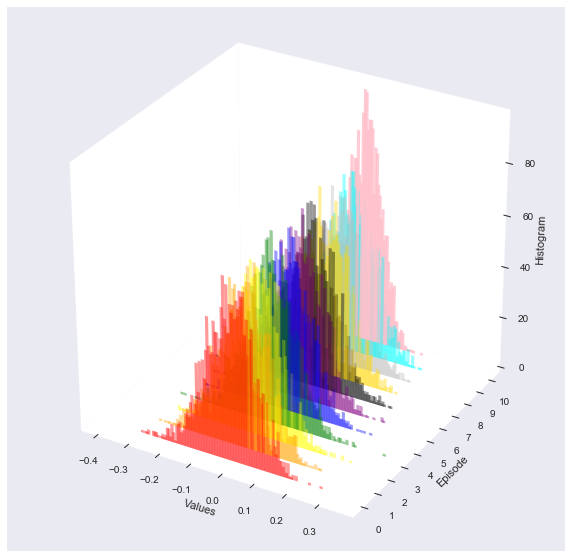

D  4


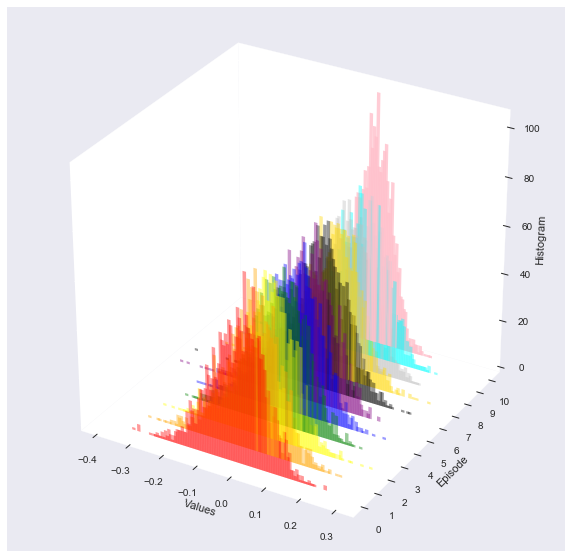

D  5


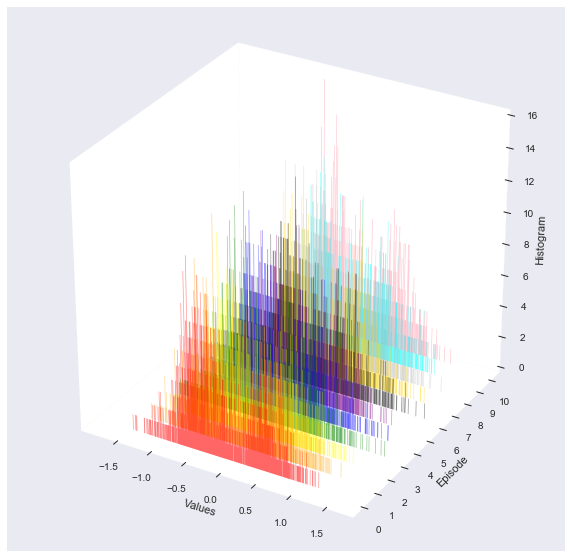

D  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.269	 Test Acc : 0.252	.35 0.15
Current : 50	 Train Acc : 0.786	 Test Acc : 0.437	.45
Current : 100	 Train Acc : 0.927	 Test Acc : 0.415	.45
E  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.276	 Test Acc : 0.286	.35 0.15
Current : 50	 Train Acc : 0.804	 Test Acc : 0.455	.45
Current : 100	 Train Acc : 0.937	 Test Acc : 0.431	.55
E  Current Iter : 149/150 batch : 7980/8000 acc : 0.65
                    Starting Episode: 2

Current : 0	 Train Acc : 0.277	 Test Acc : 0.322	.35 0.15
Current : 50	 Train Acc : 0.78	 Test Acc : 0.43	 0.45
Current : 100	 Train Acc : 0.917	 Test Acc : 0.42	0.55
E  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 3

Current : 0	 Train Acc : 0.277	 Test Acc : 0.309	.35 0.15
Current : 50	 Train Acc : 0.803	 Test Acc : 0.45	0.65
Current : 100	 Train Acc : 0.946	 Test Acc : 0.427	.

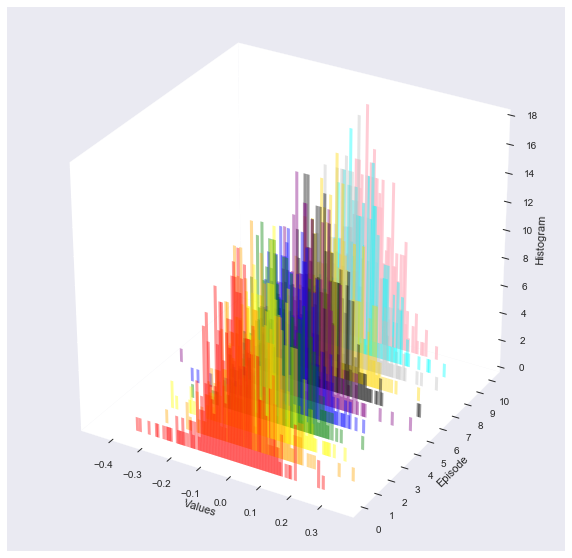

E  1


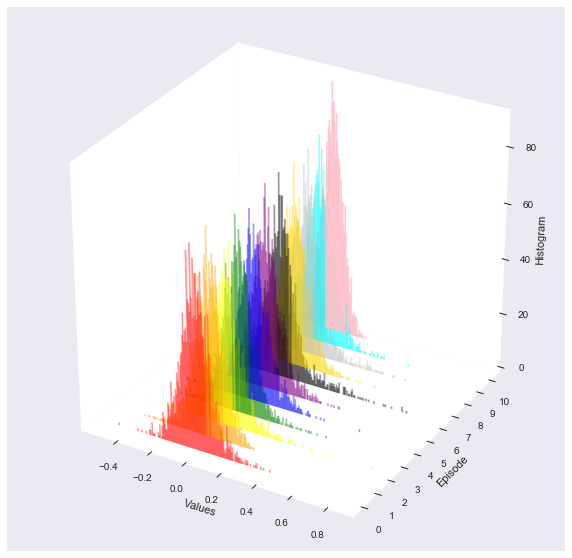

E  2


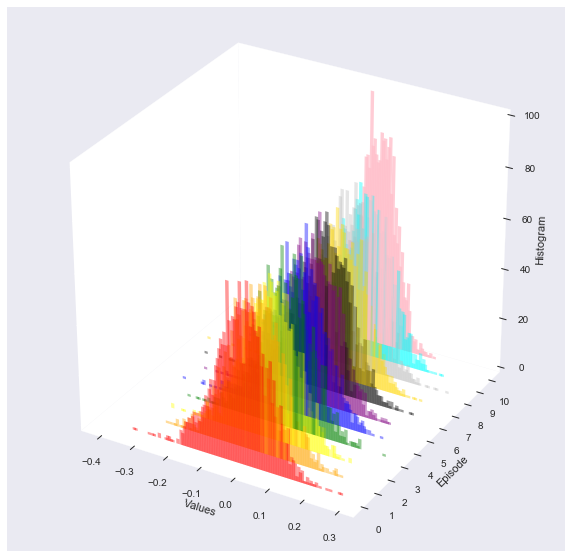

E  3


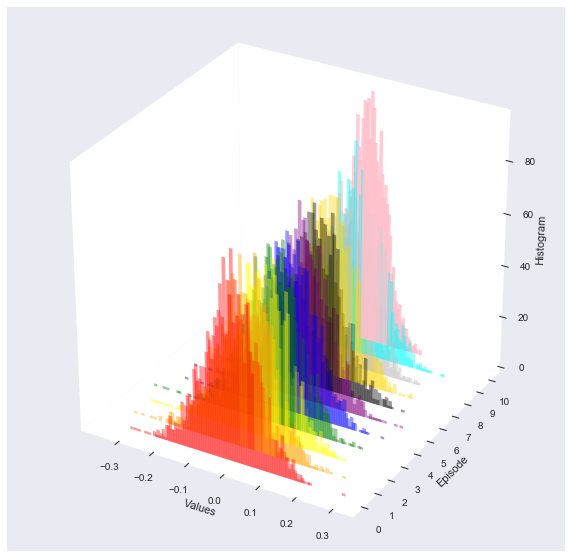

E  4


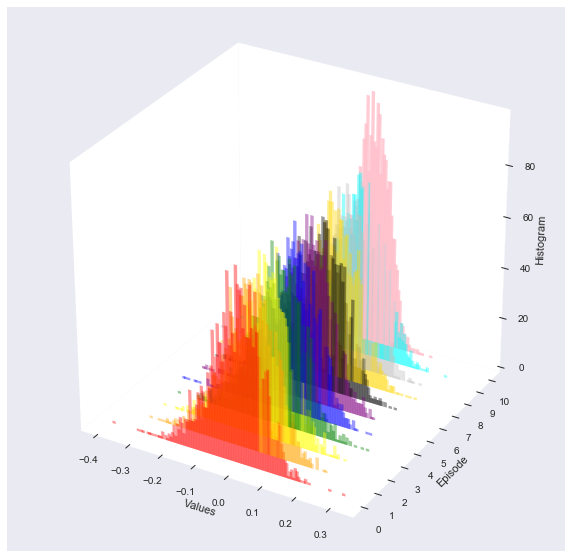

E  5


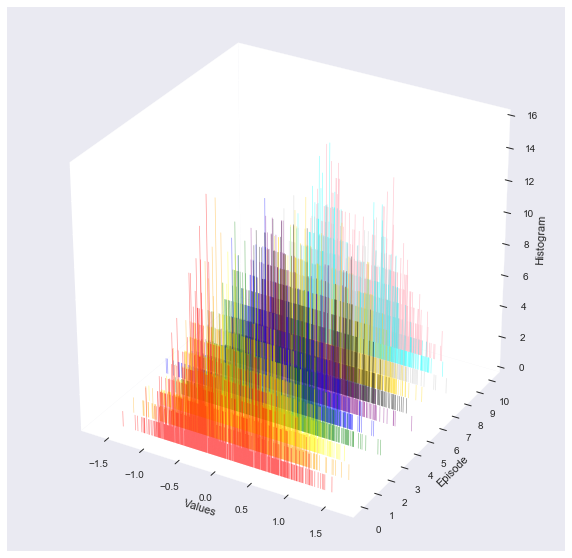

E  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.273	 Test Acc : 0.319	.35 0.15
Current : 50	 Train Acc : 0.794	 Test Acc : 0.434	.55
Current : 100	 Train Acc : 0.939	 Test Acc : 0.415	.55
F  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.274	 Test Acc : 0.317	.35 0.15
Current : 50	 Train Acc : 0.799	 Test Acc : 0.429	.45
Current : 100	 Train Acc : 0.924	 Test Acc : 0.413	.35
F  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.277	 Test Acc : 0.306	.35 0.15
Current : 50	 Train Acc : 0.788	 Test Acc : 0.443	.55
Current : 100	 Train Acc : 0.929	 Test Acc : 0.425	.55
F  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 3

Current : 0	 Train Acc : 0.271	 Test Acc : 0.325	.35 0.15
Current : 50	 Train Acc : 0.822	 Test Acc : 0.444	.45
Current : 100	 Train Acc : 0.954	 Test Acc : 0.414	.

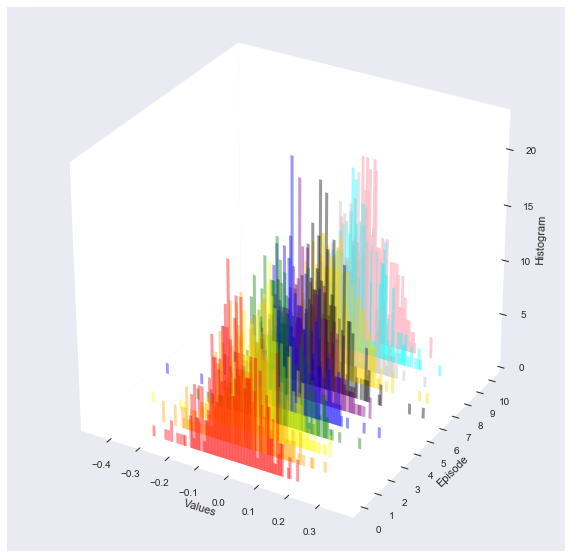

F  1


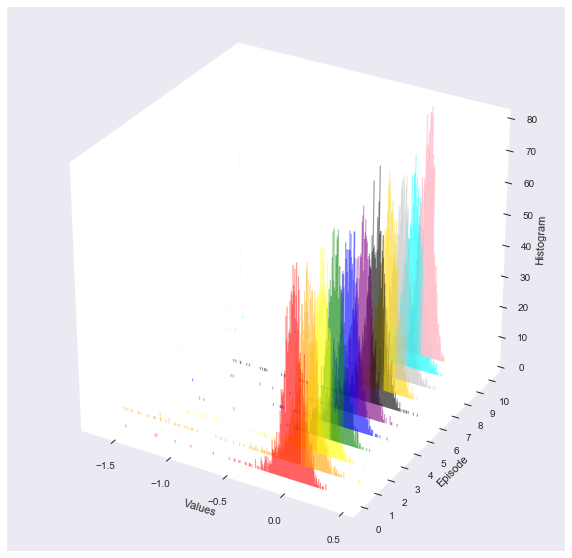

F  2


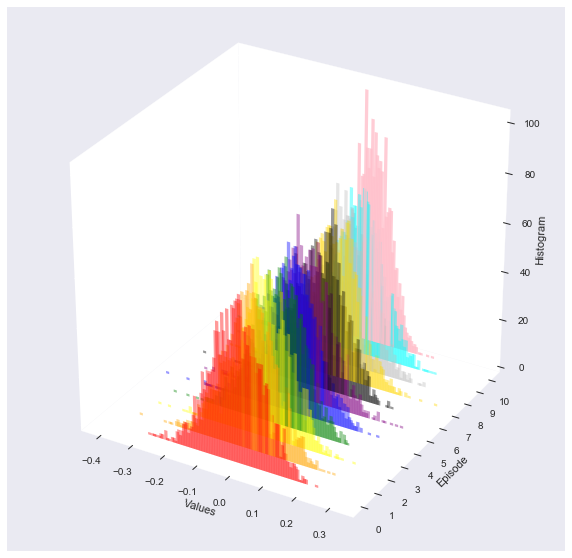

F  3


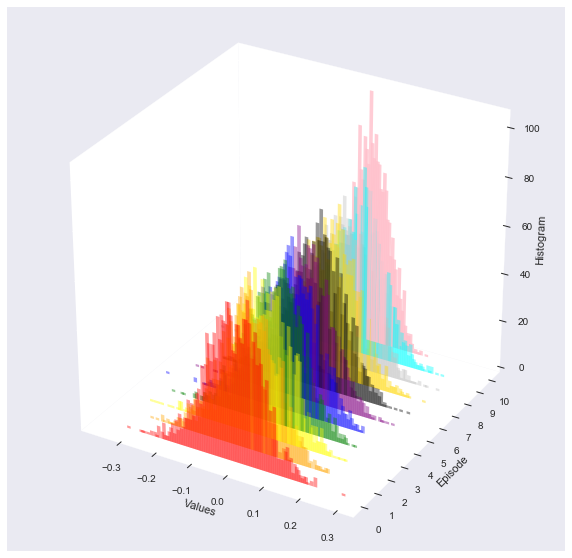

F  4


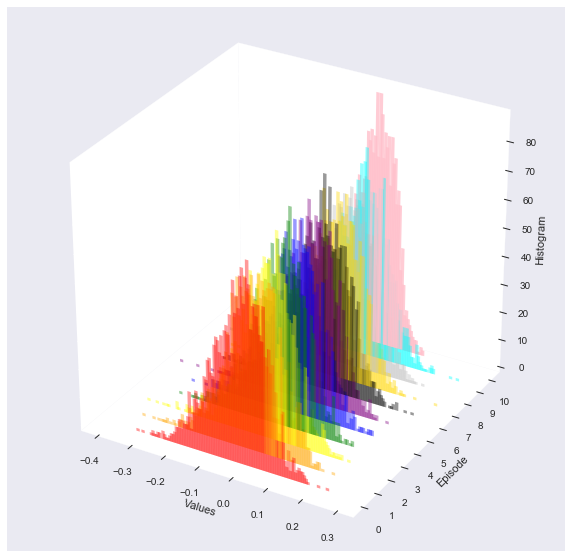

F  5


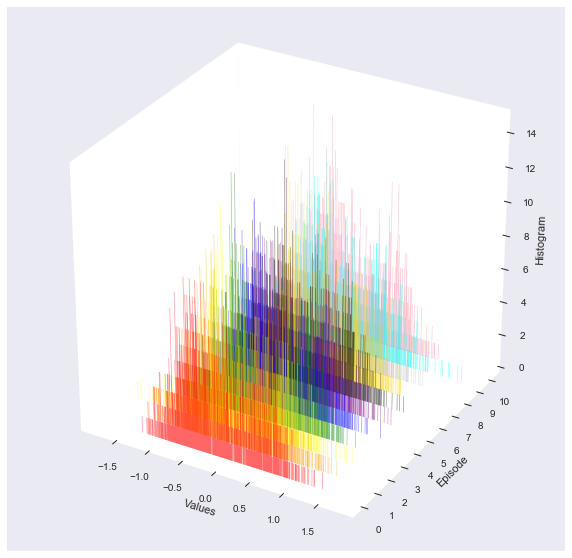

F  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.281	 Test Acc : 0.297	.35 0.15
Current : 50	 Train Acc : 0.811	 Test Acc : 0.438	.35
Current : 100	 Train Acc : 0.937	 Test Acc : 0.414	.35
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 1

Current : 0	 Train Acc : 0.275	 Test Acc : 0.272	.55 0.15
Current : 50	 Train Acc : 0.797	 Test Acc : 0.434	.55
Current : 100	 Train Acc : 0.927	 Test Acc : 0.412	.45
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.27	 Test Acc : 0.327	0.55 0.15
Current : 50	 Train Acc : 0.783	 Test Acc : 0.441	.45
Current : 100	 Train Acc : 0.934	 Test Acc : 0.432	.55
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.65
                    Starting Episode: 3

Current : 0	 Train Acc : 0.268	 Test Acc : 0.31	0.25 0.15
Current : 50	 Train Acc : 0.791	 Test Acc : 0.462	.55
Current : 100	 Train Acc : 0.941	 Test Acc : 0.427	.

SMTPConnectError: (421, b'4.4.5 Server busy, try again later.')

In [16]:
# all the experiemnt (batch)
current_batch_norm_type = 'batch_cnn_STL'
all_the_exp = ['Z','A','B','C','D','E','F','G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,3,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); l1n = tf_batch_norm_layer(16,(0,1,2))
        l2 = CNN(3,16,16,which_reg=current_exp_name); l2n = tf_batch_norm_layer(16,(0,1,2))
        l3 = CNN(3,16,16,which_reg=current_exp_name); l3n = tf_batch_norm_layer(16,(0,1,2))
        
        l4 = CNN(3,16,16,which_reg=current_exp_name); l4n = tf_batch_norm_layer(16,(0,1,2))
        l5 = CNN(3,16,16,which_reg=current_exp_name); l5n = tf_batch_norm_layer(16,(0,1,2))
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,96,96,3))
        y = tf.placeholder(tf.float32,(batch_size,10))
        is_train = tf.placeholder_with_default(True,())

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer1b,update1 = l1n.feedforward(layer1a,is_train)
        layer2, layer2a = l2. feedforward(layer1b,stride=2)
        layer2b,update2 = l2n.feedforward(layer2a,is_train)
        layer3, layer3a = l3. feedforward(layer2b,stride=2)
        layer3b,update3 = l3n.feedforward(layer3a,is_train)
        layer4, layer4a = l4. feedforward(layer3b,stride=2)
        layer4b,update4 = l4n.feedforward(layer4a,is_train)
        layer5, layer5a = l5. feedforward(layer4b)
        layer5b,update5 = l5n.feedforward(layer5a,is_train)
        layer6, layer6a = l6. feedforward(layer5b)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,6,6,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5n = l5n.backprop(grad6p)
        grad5p,grad5w,grad5_up = l5.backprop(grad5n)
        grad4n = l4n.backprop(grad5p)
        grad4p,grad4w,grad4_up = l4.backprop(grad4n,stride=2)
        grad3n = l3n.backprop(grad4p)
        grad3p,grad3w,grad3_up = l3.backprop(grad3n,stride=2)
        grad2n = l2n.backprop(grad3p)
        grad2p,grad2w,grad2_up = l2.backprop(grad2n,stride=2)
        grad1n = l1n.backprop(grad2p)
        grad1p,grad1w,grad1_up = l1.backprop(grad1n,stride=2)

        update_ops  = update1 + update2 + update3 + update4 + update5
        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update,update_ops],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label,is_train:False})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()
        
        # send me
        send_notification_email(letter,episode)

    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)


                    Starting Episode: 0

Current : 0	 Train Acc : 0.27	 Test Acc : 0.316	0.35 0.15
Current : 50	 Train Acc : 0.795	 Test Acc : 0.454	.55
Current : 100	 Train Acc : 0.933	 Test Acc : 0.429	.45
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 1

Current : 0	 Train Acc : 0.274	 Test Acc : 0.322	.25 0.15
Current : 50	 Train Acc : 0.809	 Test Acc : 0.443	.55
Current : 100	 Train Acc : 0.93	 Test Acc : 0.422	0.45
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 2

Current : 0	 Train Acc : 0.275	 Test Acc : 0.307	.35 0.15
Current : 50	 Train Acc : 0.793	 Test Acc : 0.455	.55
Current : 100	 Train Acc : 0.94	 Test Acc : 0.419	0.45
G  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 3

Current : 0	 Train Acc : 0.275	 Test Acc : 0.311	.25 0.15
Current : 50	 Train Acc : 0.773	 Test Acc : 0.43	0.55
Current : 100	 Train Acc : 0.917	 Test Acc : 0.398	.55
G 

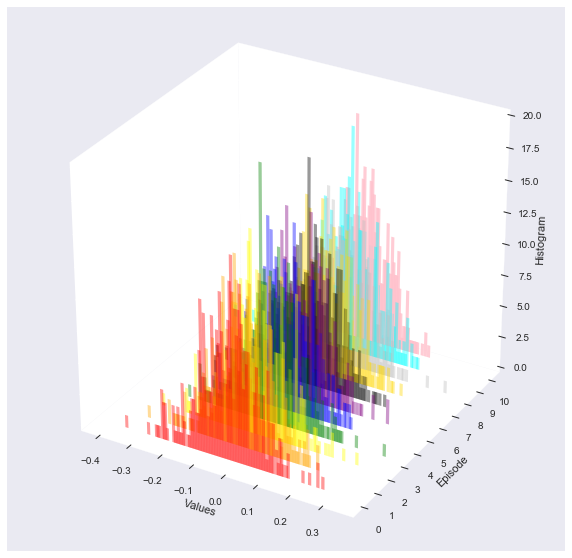

G  1


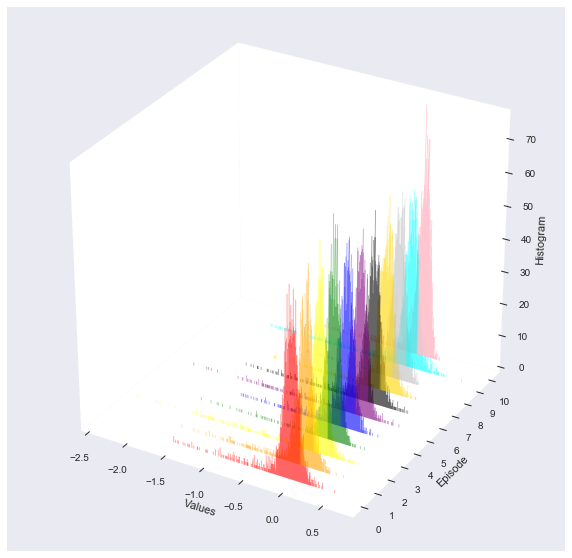

G  2


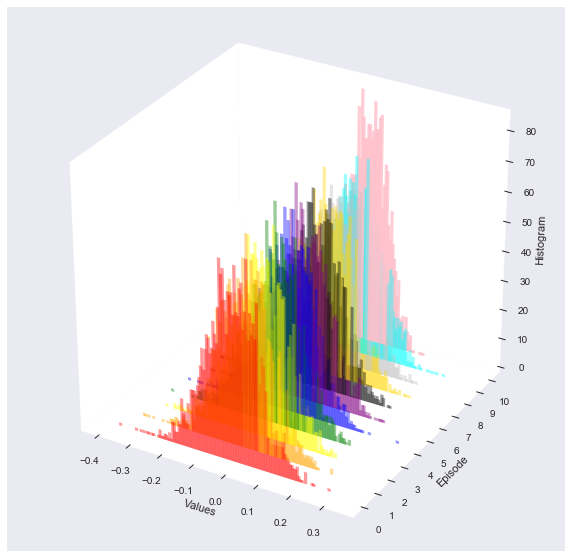

G  3


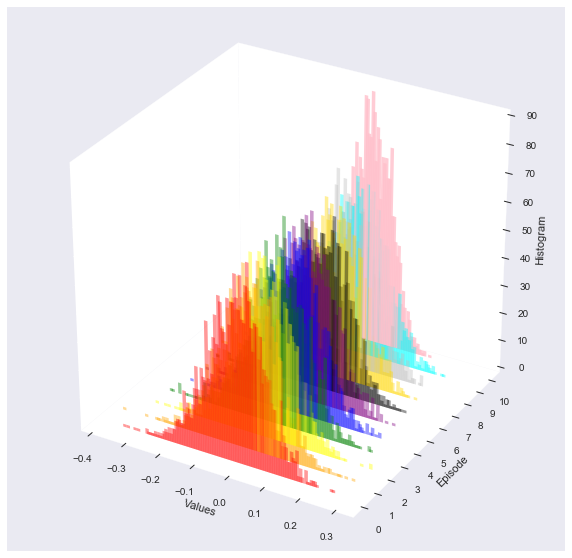

G  4


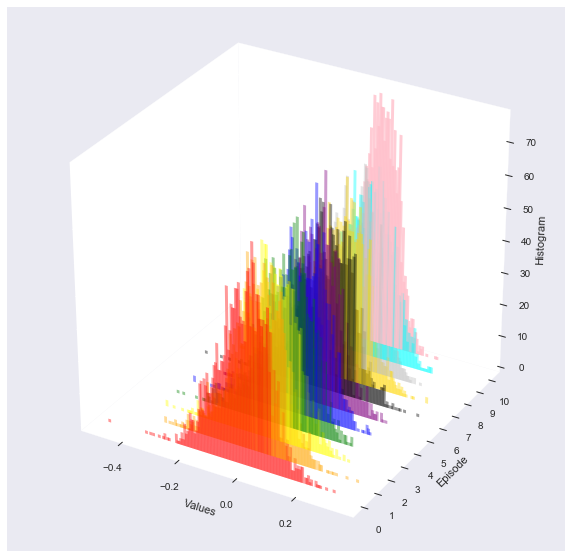

G  5


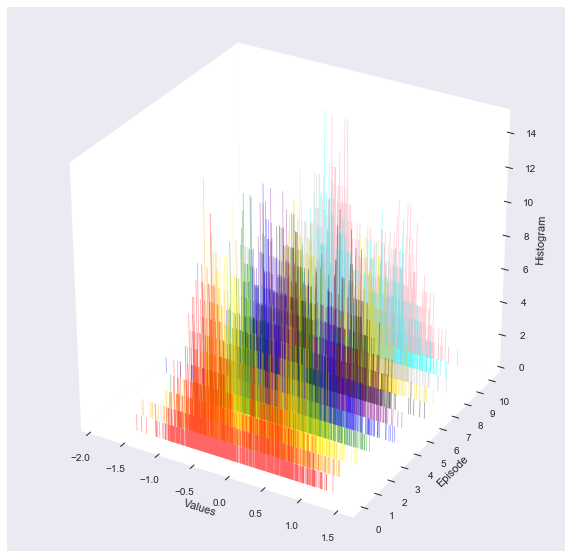

G  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.271	 Test Acc : 0.288	.45 0.15
Current : 50	 Train Acc : 0.807	 Test Acc : 0.455	.75
Current : 100	 Train Acc : 0.937	 Test Acc : 0.424	.35
H  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 1

Current : 0	 Train Acc : 0.275	 Test Acc : 0.331	.45 0.15
Current : 50	 Train Acc : 0.818	 Test Acc : 0.406	.45
Current : 100	 Train Acc : 0.943	 Test Acc : 0.407	.35
H  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 2

Current : 0	 Train Acc : 0.274	 Test Acc : 0.277	.35 0.15
Current : 50	 Train Acc : 0.801	 Test Acc : 0.429	.45
Current : 100	 Train Acc : 0.946	 Test Acc : 0.402	.45
H  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 3

Current : 0	 Train Acc : 0.275	 Test Acc : 0.28	0.35 0.15
Current : 50	 Train Acc : 0.799	 Test Acc : 0.451	.55
Current : 100	 Train Acc : 0.926	 Test Acc : 0.431	.

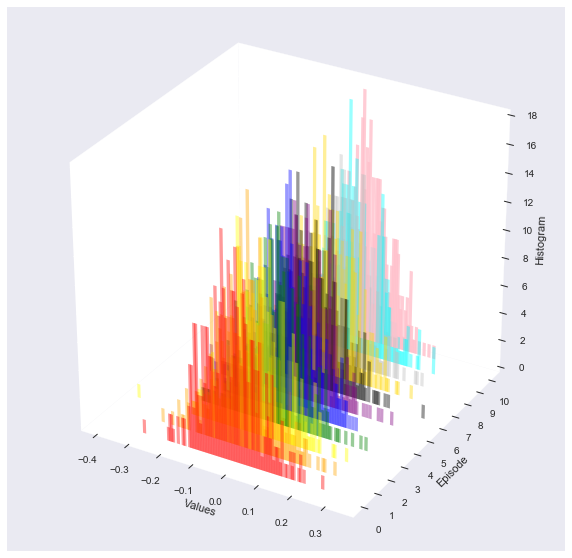

H  1


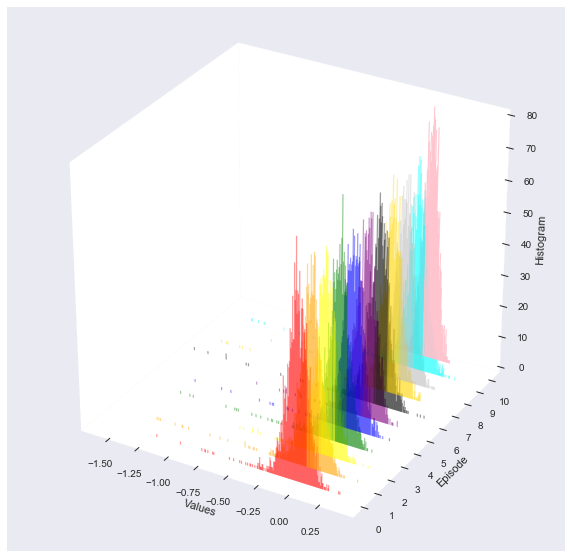

H  2


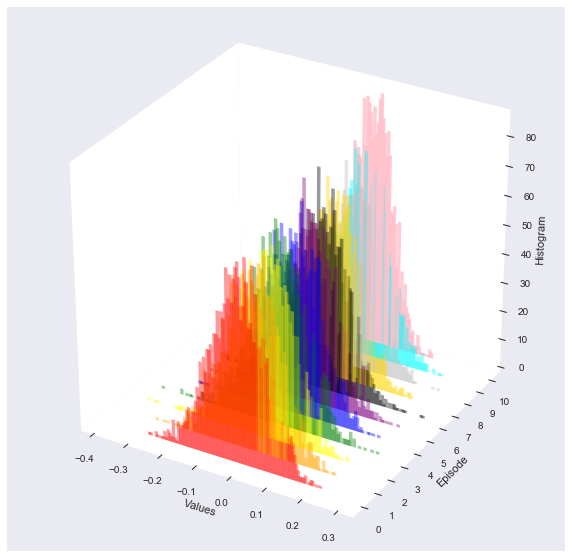

H  3


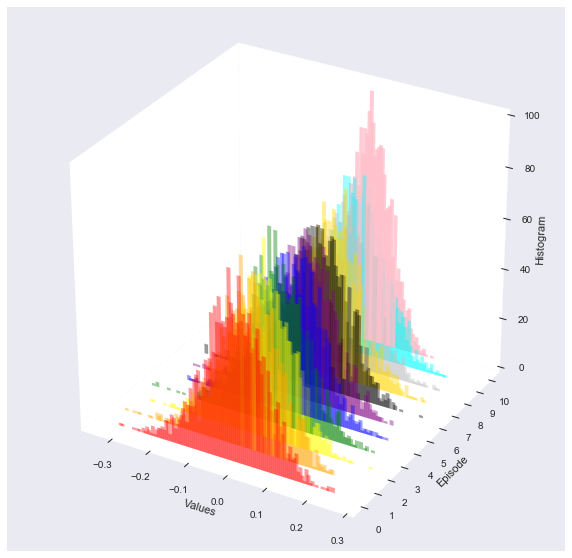

H  4


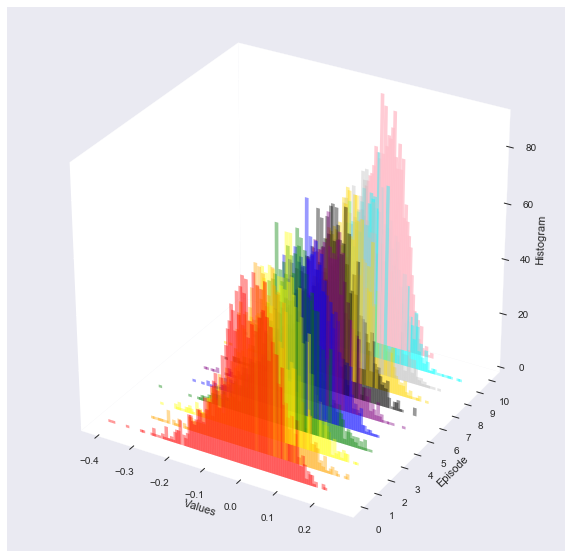

H  5


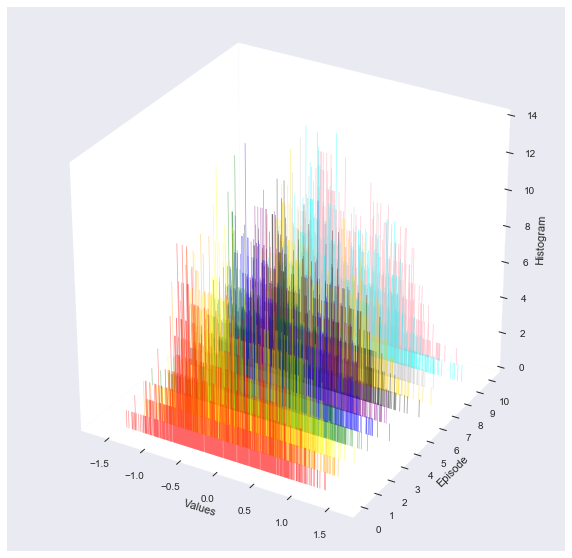

H  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.265	 Test Acc : 0.329	.35 0.15
Current : 50	 Train Acc : 0.795	 Test Acc : 0.452	.45
Current : 100	 Train Acc : 0.928	 Test Acc : 0.436	.45
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.45
                    Starting Episode: 1

Current : 0	 Train Acc : 0.268	 Test Acc : 0.322	.45 0.15
Current : 50	 Train Acc : 0.791	 Test Acc : 0.459	.55
Current : 100	 Train Acc : 0.941	 Test Acc : 0.437	.55
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.55
                    Starting Episode: 2

Current : 0	 Train Acc : 0.271	 Test Acc : 0.271	.45 0.15
Current : 50	 Train Acc : 0.791	 Test Acc : 0.444	.45
Current : 100	 Train Acc : 0.929	 Test Acc : 0.43	0.45
I  Current Iter : 149/150 batch : 7980/8000 acc : 0.35
                    Starting Episode: 3

Current : 0	 Train Acc : 0.271	 Test Acc : 0.3	 0.35 0.15
Current : 50	 Train Acc : 0.795	 Test Acc : 0.446	.55
Current : 100	 Train Acc : 0.939	 Test Acc : 0.415	.

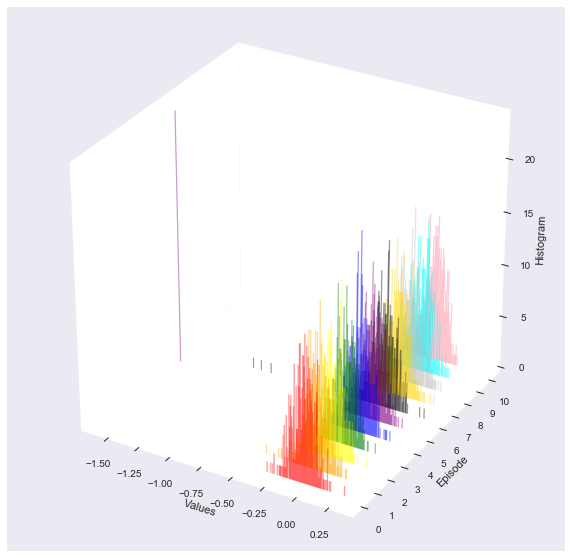

I  1


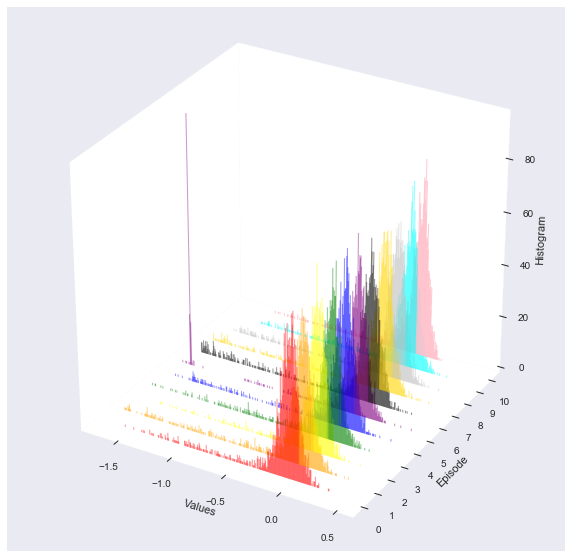

I  2


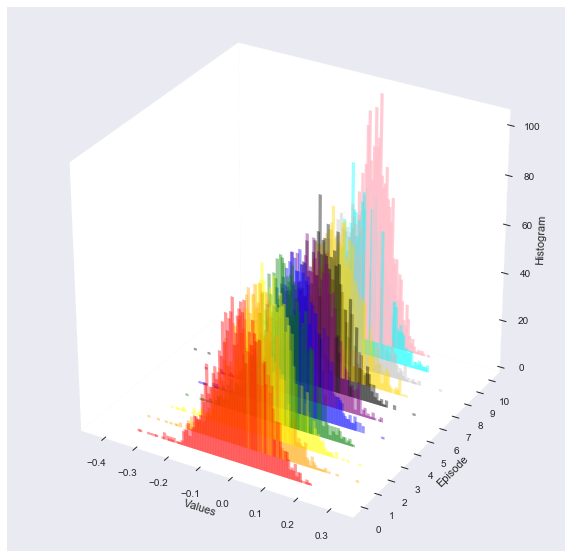

I  3


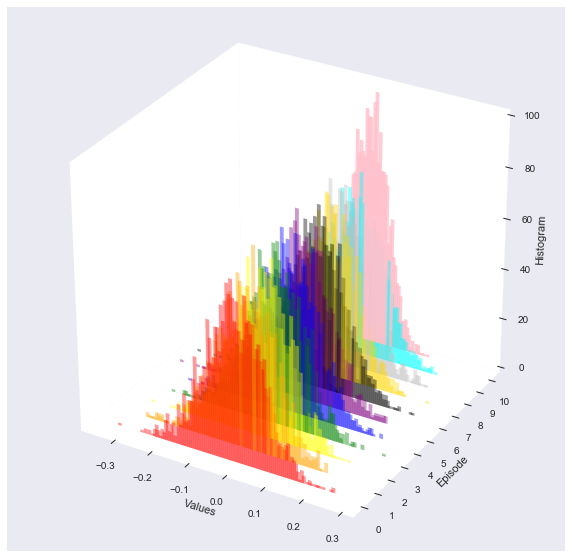

I  4


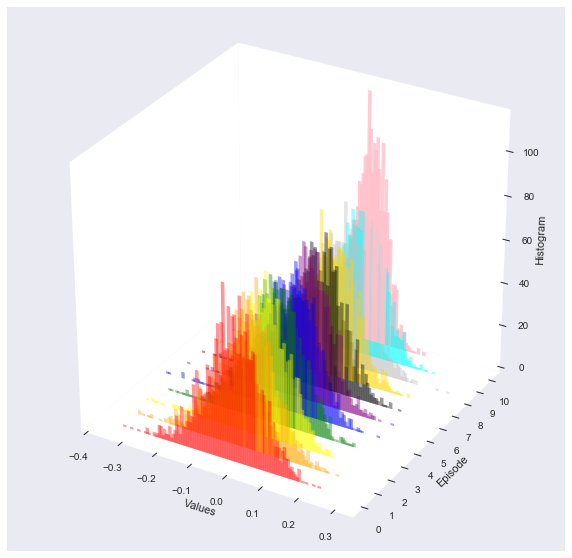

I  5


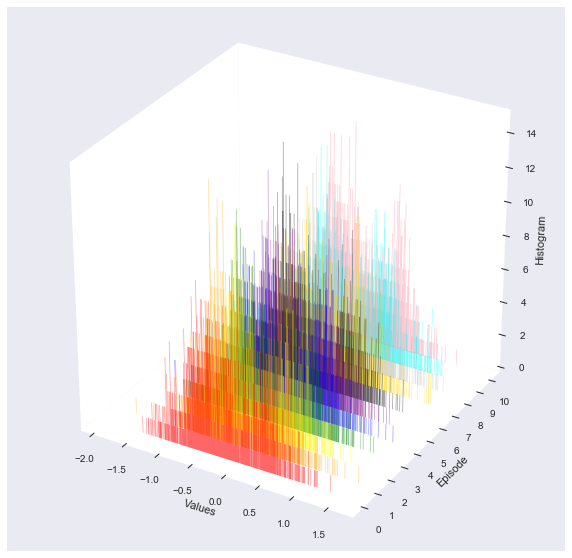

I  6

                    Starting Episode: 0

Current : 0	 Train Acc : 0.272	 Test Acc : 0.322	.25 0.15


In [ ]:
# all the experiemnt (batch)
current_batch_norm_type = 'batch_cnn_STL'
all_the_exp = ['G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,3,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); l1n = tf_batch_norm_layer(16,(0,1,2))
        l2 = CNN(3,16,16,which_reg=current_exp_name); l2n = tf_batch_norm_layer(16,(0,1,2))
        l3 = CNN(3,16,16,which_reg=current_exp_name); l3n = tf_batch_norm_layer(16,(0,1,2))
        
        l4 = CNN(3,16,16,which_reg=current_exp_name); l4n = tf_batch_norm_layer(16,(0,1,2))
        l5 = CNN(3,16,16,which_reg=current_exp_name); l5n = tf_batch_norm_layer(16,(0,1,2))
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,96,96,3))
        y = tf.placeholder(tf.float32,(batch_size,10))
        is_train = tf.placeholder_with_default(True,())

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer1b,update1 = l1n.feedforward(layer1a,is_train)
        layer2, layer2a = l2. feedforward(layer1b,stride=2)
        layer2b,update2 = l2n.feedforward(layer2a,is_train)
        layer3, layer3a = l3. feedforward(layer2b,stride=2)
        layer3b,update3 = l3n.feedforward(layer3a,is_train)
        layer4, layer4a = l4. feedforward(layer3b,stride=2)
        layer4b,update4 = l4n.feedforward(layer4a,is_train)
        layer5, layer5a = l5. feedforward(layer4b)
        layer5b,update5 = l5n.feedforward(layer5a,is_train)
        layer6, layer6a = l6. feedforward(layer5b)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,6,6,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5n = l5n.backprop(grad6p)
        grad5p,grad5w,grad5_up = l5.backprop(grad5n)
        grad4n = l4n.backprop(grad5p)
        grad4p,grad4w,grad4_up = l4.backprop(grad4n,stride=2)
        grad3n = l3n.backprop(grad4p)
        grad3p,grad3w,grad3_up = l3.backprop(grad3n,stride=2)
        grad2n = l2n.backprop(grad3p)
        grad2p,grad2w,grad2_up = l2.backprop(grad2n,stride=2)
        grad1n = l1n.backprop(grad2p)
        grad1p,grad1w,grad1_up = l1.backprop(grad1n,stride=2)

        update_ops  = update1 + update2 + update3 + update4 + update5
        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update,update_ops],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label,is_train:False})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()
        
        # send me
        try: 
            send_notification_email(letter,episode)
        except: 
            pass

    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

In [ ]:
%reset -f

In [ ]:
# CIFAR
# import Library and some random image data set
import tensorflow as tf
import numpy      as np
import seaborn    as sns 
import pandas     as pd
import os,sys
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
np.random.seed(78); tf.set_random_seed(78)

# get some of the STL data set
from sklearn.preprocessing import OneHotEncoder
from skimage import util 
from skimage.transform import resize
from skimage.io import imread
import warnings
from numpy import inf

from scipy.stats import kurtosis,skew

plt.rcParams.update({'font.size': 10})
import warnings
warnings.filterwarnings("ignore")
import gc
from IPython.display import display, clear_output
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d
from matplotlib import animation
%load_ext jupyternotify

from sklearn.utils import shuffle
from scipy.misc import imread
from scipy.misc import imresize
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from skimage.transform import resize

In [ ]:
# read the data
def unpickle(file):
    import pickle
    with open(file, 'rb') as fo:
        dict = pickle.load(fo, encoding='bytes')
    return dict
PathDicom = "../../../Dataset/cifar-10-batches-py/"
lstFilesDCM = []  # create an empty list
for dirName, subdirList, fileList in os.walk(PathDicom):
    for filename in fileList:
        if not ".html" in filename.lower() and not  ".meta" in filename.lower():  # check whether the file's DICOM
            lstFilesDCM.append(os.path.join(dirName,filename))

# Read the data traind and Test
batch0 = unpickle(lstFilesDCM[0])
batch1 = unpickle(lstFilesDCM[1])
batch2 = unpickle(lstFilesDCM[2])
batch3 = unpickle(lstFilesDCM[3])
batch4 = unpickle(lstFilesDCM[4])

onehot_encoder = OneHotEncoder(sparse=True)
train_batch = np.vstack((batch0[b'data'],batch1[b'data'],batch2[b'data'],batch3[b'data'],batch4[b'data']))
train_label = np.expand_dims(np.hstack((batch0[b'labels'],batch1[b'labels'],batch2[b'labels'],batch3[b'labels'],batch4[b'labels'])).T,axis=1).astype(np.float32)
train_label = onehot_encoder.fit_transform(train_label).toarray().astype(np.float32)

test_batch = unpickle(lstFilesDCM[5])[b'data']
test_label = np.expand_dims(np.array(unpickle(lstFilesDCM[5])[b'labels']),axis=0).T.astype(np.float32)
test_label = onehot_encoder.fit_transform(test_label).toarray().astype(np.float32)

# reshape data
train_batch = np.reshape(train_batch,(len(train_batch),3,32,32))
test_batch = np.reshape(test_batch,(len(test_batch),3,32,32))

# rotate data
train_batch = np.rot90(np.rot90(train_batch,1,axes=(1,3)),3,axes=(1,2)).astype(np.float32)
test_batch = np.rot90(np.rot90(test_batch,1,axes=(1,3)),3,axes=(1,2)).astype(np.float32)

train_images = train_batch/255.0
train_labels = train_label
test_images  = test_batch/255.0
test_labels  = test_label

print(train_images.shape,train_images.max(),train_images.min())
print(train_labels.shape,train_labels.max(),train_labels.min())
print(test_images.shape,test_images.max(),test_images.min())
print(test_labels.shape,test_labels.max(),test_labels.min())

In [ ]:
# create the layers
def tf_softmax(x): return tf.nn.softmax(x)
def tf_relu(x):   return tf.nn.relu(x)
def d_tf_relu(x): return tf.cast(tf.greater(x,0),tf.float32)

class CNN():

    def __init__(self,k,inc,out, stddev=0.05,which_reg=0,act=tf_relu,d_act=d_tf_relu):
        self.w              = tf.Variable(tf.random_normal([k,k,inc,out],stddev=stddev,seed=2,dtype=tf.float32))
        self.m,self.v       = tf.Variable(tf.zeros_like(self.w)),tf.Variable(tf.zeros_like(self.w))
        self.act,self.d_act = act,d_act
        self.regularizer    = which_reg
    def getw(self): return self.w
    def feedforward(self,input,stride=1,padding='SAME'):
        self.input  = input
        self.layer  = tf.nn.conv2d(input,self.w,strides=[1,stride,stride,1],padding=padding) 
        self.layerA = self.act(self.layer)
        return self.layer, self.layerA
    def backprop(self,gradient,stride=1,padding='SAME'):
        grad_part_1 = gradient
        grad_part_2 = self.d_act(self.layer)
        grad_part_3 = self.input

        grad_middle = grad_part_1 * grad_part_2
        grad        = tf.nn.conv2d_backprop_filter(input = grad_part_3,filter_sizes = tf.shape(self.w),  out_backprop = grad_middle,strides=[1,stride,stride,1],padding=padding) / batch_size
        grad_pass   = tf.nn.conv2d_backprop_input (input_sizes = tf.shape(self.input),filter= self.w,out_backprop = grad_middle,strides=[1,stride,stride,1],padding=padding)

        if self.regularizer == 'A': grad = grad + lamda * tf.sign(self.w)
        if self.regularizer == 'B': grad = grad + lamda * 2.0 * self.w
        if self.regularizer == 'C': grad = grad + lamda * (1.0/tf.sqrt(tf.square(self.w)+ 10e-8)) * self.w
        if self.regularizer == 'D': grad = grad + lamda * -(2*self.w)/(1 + self.w**2)
        if self.regularizer == 'E': grad = grad + lamda * -(1-tf.tanh(self.w) ** 2)
        if self.regularizer == 'F': grad = grad + lamda * -(1-tf.tanh(self.w** 2) ** 2) * 2.0 * self.w 
        if self.regularizer == 'G': grad = grad + lamda * -(1-tf.tanh(tf.abs(self.w)) ** 2) * tf.sign(self.w)
        if self.regularizer == 'H': grad = grad + lamda * -(1-tf.tanh(tf.abs(self.w)** 2) ** 2) * 2.0 * tf.abs(self.w) *  tf.sign(self.w)
        if self.regularizer == 'I': grad = grad + lamda * tf.cos(self.w)
        if self.regularizer == 'J': grad = grad + lamda * tf.sign(tf.sin(self.w)) * tf.cos(self.w)
        if self.regularizer == 'K': grad = grad + lamda * (2)/(self.w + 10e-8)
        if self.regularizer == 'L': grad = grad + lamda * (tf.log(self.w**2) + 2.0)
        
        update_w = []
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1) ; v_hat = self.v / (1-beta2)
        adam_middle = m_hat * learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,adam_middle  )))
        return grad_pass,grad,update_w
class tf_batch_norm_layer():
    
    def __init__(self,vector_shape,axis):
        self.moving_mean = tf.Variable(tf.zeros(shape=[1,1,1,vector_shape],dtype=tf.float32))
        self.moving_vari = tf.Variable(tf.zeros(shape=[1,1,1,vector_shape],dtype=tf.float32))
        self.axis        = axis
    def feedforward(self,input,training_phase=True,eps = 1e-8):
        self.input = input
        self.input_size          = self.input.shape
        self.batch,self.h,self.w,self.c = self.input_size[0].value,self.input_size[1].value,self.input_size[2].value,self.input_size[3].value

        # Training Moving Average Mean         
        def training_fn():
            self.mean    = tf.reduce_mean(self.input,axis=self.axis ,keepdims=True)
            self.var     = tf.reduce_mean(tf.square(self.input-self.mean),axis=self.axis,keepdims=True)
            centered_data= (self.input - self.mean)/tf.sqrt(self.var + eps)
            
            update_variable = []
            update_variable.append(tf.assign(self.moving_mean,self.moving_mean*0.9 + 0.1 * self.mean ))
            update_variable.append(tf.assign(self.moving_vari,self.moving_vari*0.9 + 0.1 * self.var  ))
            return centered_data,update_variable
        
        # Testing Moving Average Mean        
        def  testing_fn():
            centered_data   = (self.input - self.moving_mean)/tf.sqrt(self.moving_vari + eps)
            update_variable = []
            update_variable.append(tf.assign(self.moving_mean,self.moving_mean))
            update_variable.append(tf.assign(self.moving_vari,self.moving_vari))
            return centered_data,update_variable
        
        self.output,update_variable = tf.cond(training_phase,true_fn=training_fn,false_fn=testing_fn)
        return self.output,update_variable
    def backprop(self,grad,eps = 1e-8):
        change_parts = 1.0 /(self.batch * self.h * self.w)
        grad_sigma   = tf.reduce_sum( grad *  (self.input-self.mean)     ,axis=self.axis,keepdims=True) * -0.5 * (self.var+eps) ** -1.5
        grad_mean    = tf.reduce_sum( grad *  (-1./tf.sqrt(self.var+eps)),axis=self.axis,keepdims=True) + grad_sigma * change_parts * 2.0 * tf.reduce_sum((self.input-self.mean),axis=self.axis,keepdims=True) * -1
        grad_x       = grad * 1/(tf.sqrt(self.var+eps)) + grad_sigma * change_parts * 2.0 * (self.input-self.mean) + grad_mean * change_parts
        return grad_x

def save_to_image(data,name):
    l1g,l2g,l3g,l4g,l5g,l6g = data
    l1g,l2g,l3g,l4g,l5g,l6g = np.asarray(l1g),np.asarray(l2g),np.asarray(l3g),np.asarray(l4g),np.asarray(l5g),np.asarray(l6g)
    plt.figure(figsize=(25,15))
    plt.suptitle('Current Iter : ' + str(iter))
    plt.subplot(231); plt.hist(l1g.ravel(),50); plt.title('layer 1')
    plt.subplot(232); plt.hist(l2g.ravel(),50); plt.title('layer 2')
    plt.subplot(233); plt.hist(l3g.ravel(),50); plt.title('layer 3')
    plt.subplot(234); plt.hist(l4g.ravel(),50); plt.title('layer 4')
    plt.subplot(235); plt.hist(l5g.ravel(),50); plt.title('layer 5')
    plt.subplot(236); plt.hist(l6g.ravel(),50); plt.title('layer 6')
    plt.savefig(name + str(iter)+'.png')
    plt.tight_layout()
    plt.close('all')     
def append_stat(current_list,data,number):
    current_list[0].append(data[number].mean())
    current_list[1].append(data[number].std())
    current_list[2].append(skew    (data[number].ravel()))
    current_list[3].append(kurtosis(data[number].ravel()))
    current_list[4].append(np.count_nonzero(data[number]))
    return current_list
def transform_to_2d(data):
    batch,width,height,chan = data.shape
    return data.reshape((batch*width,height*chan))
def save_to_image(main_data,one,two,three,four,five,six,experiment_name,tran_acc,test_acc,current_exp,iter):
    plt.figure(figsize=(20,40))
    G = gridspec.GridSpec(8, 6)

    plt.figtext(0.5,1.0,"Iter: " + str(iter) + " Histogram Per " + experiment_name,ha="center", va="top", fontsize=35, color="black")
    plt.subplot(G[0, 0]).hist(main_data[0].ravel(),50,color='red');       plt.subplot(G[0, 0]).set_title(experiment_name+' 1')
    plt.subplot(G[0, 1]).hist(main_data[1].ravel(),50,color='orange');    plt.subplot(G[0, 1]).set_title(experiment_name+' 2')
    plt.subplot(G[0, 2]).hist(main_data[2].ravel(),50,color='yellow');  plt.subplot(G[0, 2]).set_title(experiment_name+' 3')
    plt.subplot(G[0, 3]).hist(main_data[3].ravel(),50,color='green');    plt.subplot(G[0, 3]).set_title(experiment_name+' 4')
    plt.subplot(G[0, 4]).hist(main_data[4].ravel(),50,color='blue');     plt.subplot(G[0, 4]).set_title(experiment_name+' 5')
    plt.subplot(G[0, 5]).hist(main_data[5].ravel(),50,color='black');     plt.subplot(G[0, 5]).set_title(experiment_name+' 6')

    plt.subplot(G[1, :]).set_title("Mean Per "+ experiment_name)
    plt.subplot(G[1, :]).plot(one[0]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[1, :]).plot(two[0]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[1, :]).plot(three[0],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[1, :]).plot(four[0],c='green',alpha=0.9,label='4')
    plt.subplot(G[1, :]).plot(five[0],c='blue',alpha=0.9,label='5')
    plt.subplot(G[1, :]).plot(six[0],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[2, :]).set_title("Standard Deviation Per "+ experiment_name)
    plt.subplot(G[2, :]).plot(one[1]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[2, :]).plot(two[1]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[2, :]).plot(three[1],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[2, :]).plot(four[1],c='green',alpha=0.9,label='4')
    plt.subplot(G[2, :]).plot(five[1],c='blue',alpha=0.9,label='5')
    plt.subplot(G[2, :]).plot(six[1],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[3, :]).set_title("Skewness Per "+ experiment_name)
    plt.subplot(G[3, :]).plot(one[2]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[3, :]).plot(two[2]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[3, :]).plot(three[2],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[3, :]).plot(four[2],c='green',alpha=0.9,label='4')
    plt.subplot(G[3, :]).plot(five[2],c='blue',alpha=0.9,label='5')
    plt.subplot(G[3, :]).plot(six[2],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[4, :]).set_title("Kurtosis Per "+ experiment_name)
    plt.subplot(G[4, :]).plot(one[3]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[4, :]).plot(two[3]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[4, :]).plot(three[3],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[4, :]).plot(four[3],c='green',alpha=0.9,label='4')
    plt.subplot(G[4, :]).plot(five[3],c='blue',alpha=0.9,label='5')
    plt.subplot(G[4, :]).plot(six[3],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[5, :]).set_title("# Non-Zero Per "+ experiment_name)
    plt.subplot(G[5, :]).plot(one[4]  ,c='red',alpha=0.9   ,label='1')
    plt.subplot(G[5, :]).plot(two[4]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[5, :]).plot(three[4],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[5, :]).plot(four[4],c='green',alpha=0.9  ,label='4')
    plt.subplot(G[5, :]).plot(five[4],c='blue',alpha=0.9   ,label='5')
    plt.subplot(G[5, :]).plot(six[4],c='black',alpha=0.9   ,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[6, :]).set_title("Train/Test accuracy")
    plt.subplot(G[6, :]).plot(train_acc  ,c='red',alpha=0.9, label='Train')
    plt.subplot(G[6, :]).plot(test_acc   ,c='blue',alpha=0.9,label='Test')
    plt.legend()

    plt.figtext(0.5,0,"Correlation Matrix Per "+ experiment_name,ha="center", va="bottom", fontsize=30, color="black")
    plt.subplot(G[7, 0]).imshow(np.corrcoef(transform_to_2d(main_data[0])),cmap='gray')
    plt.subplot(G[7, 1]).imshow(np.corrcoef(transform_to_2d(main_data[1])),cmap='gray')
    plt.subplot(G[7, 2]).imshow(np.corrcoef(transform_to_2d(main_data[2])),cmap='gray')
    plt.subplot(G[7, 3]).imshow(np.corrcoef(transform_to_2d(main_data[3])),cmap='gray')
    plt.subplot(G[7, 4]).imshow(np.corrcoef(transform_to_2d(main_data[4])),cmap='gray')
    plt.subplot(G[7, 5]).imshow(np.corrcoef(transform_to_2d(main_data[5])),cmap='gray')

    plt.tight_layout()
    plt.savefig(current_exp + '/' + experiment_name + '/' + str(iter) + '.png')
    plt.close('all')
def plot_rotation_weight(current_layers,current_layer_number,current_batch_norm_type,current_exp_name): 

    def rotate(angle):ax.view_init(azim=angle)
    plt.rcParams.update({'font.size': 8})
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    number_of_eps = [1,2,3,4,5,6,7,8,9,10,11]
    fig = plt.figure(figsize=(10,10))
    ax  = fig.add_subplot(111, projection='3d')
    count = 0
    for episode in range(num_eps+1):
        if episode == num_eps:
            ys   = current_layers.mean(0).flatten()
            xmin = ys.min(); xmax = ys.max(); step = 0.005
            hist,bins = np.histogram(ys, bins=np.linspace(xmin, xmax, (xmax-xmin)/step))
            ax.bar(bins[:-1], hist, width=0.01,zs=episode, zdir='y', color=colors[episode], alpha=0.8)
        else:
            ys   = current_layers[episode].flatten()
            xmin = ys.min(); xmax = ys.max(); step = 0.005
            hist,bins = np.histogram(ys, bins=np.linspace(xmin, xmax, (xmax-xmin)/step))
            ax.bar(bins[:-1], hist, width=0.01,zs=episode, zdir='y', color=colors[episode], alpha=0.4)
    ax.set_xlabel('Values')
    ax.set_ylabel('Episode')
    ax.get_yaxis().set_ticks(np.arange(num_eps+1))
    ax.set_zlabel('Histogram')

    ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

    # make the grid lines transparent
    ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    # ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    #plt.tight_layout()
    plt.show()

    animation.FuncAnimation(fig, rotate, frames=np.arange(0,362,2),interval=100) \
    .save(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/weight_'+str(current_layer_number)+'.gif', dpi=80, writer='imagemagick')
    plt.close('all')
def plot_image_weight(current_layers,current_layer_number,current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy):
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    def rt(number): return np.around(number,4)
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(15,15))
    plt.rcParams.update({'font.size': 50})

    fig.add_subplot(341); plt.hist(current_layers[0].flatten(),50,color=colors[0],alpha=0.8);plt.title('EPS: 1 Mean: '+str(rt(current_layers[0].mean())) +' STD: '+str(rt(current_layers[0].std())))
    fig.add_subplot(342); plt.hist(current_layers[1].flatten(),50,color=colors[1],alpha=0.8);plt.title('EPS: 2 Mean: '+str(rt(current_layers[1].mean())) +' STD: '+str(rt(current_layers[1].std())))
    fig.add_subplot(343); plt.hist(current_layers[2].flatten(),50,color=colors[2],alpha=0.8);plt.title('EPS: 3 Mean: '+str(rt(current_layers[2].mean())) +' STD: '+str(rt(current_layers[2].std())))
    fig.add_subplot(344); plt.hist(current_layers[3].flatten(),50,color=colors[3],alpha=0.8);plt.title('EPS: 4 Mean: '+str(rt(current_layers[3].mean())) +' STD: '+str(rt(current_layers[3].std())))
    
    fig.add_subplot(345); plt.hist(current_layers[4].flatten(),50,color=colors[4],alpha=0.8);plt.title('EPS: 5 Mean: '+str(rt(current_layers[4].mean())) +' STD: '+str(rt(current_layers[4].std())))
    fig.add_subplot(346); plt.hist(current_layers[5].flatten(),50,color=colors[5],alpha=0.8);plt.title('EPS: 6 Mean: '+str(rt(current_layers[5].mean())) +' STD: '+str(rt(current_layers[5].std())))
    fig.add_subplot(347); plt.hist(current_layers[6].flatten(),50,color=colors[6],alpha=0.8);plt.title('EPS: 7 Mean: '+str(rt(current_layers[6].mean())) +' STD: '+str(rt(current_layers[6].std())))
    fig.add_subplot(348); plt.hist(current_layers[7].flatten(),50,color=colors[7],alpha=0.8);plt.title('EPS: 8 Mean: '+str(rt(current_layers[7].mean())) +' STD: '+str(rt(current_layers[7].std())))
    
    fig.add_subplot(3,4,9);  plt.hist(current_layers[8].flatten(),50,color=colors[8],alpha=0.8);plt.title('EPS: 9 Mean: '+str(rt(current_layers[8].mean())) +' STD: '+str(rt(current_layers[8].std())))
    fig.add_subplot(3,4,10); plt.hist(current_layers[9].flatten(),50,color=colors[9],alpha=0.8);plt.title('EPS: 10 Mean: '+str(rt(current_layers[9].mean())) +' STD: '+str(rt(current_layers[9].std())))
    fig.add_subplot(3,4,11); plt.hist(current_layers.mean(0).flatten(),50,color=colors[10],alpha=0.8);plt.title('EPS: All Mean: '+str(rt(current_layers.mean(0).mean())) +' STD: '+str(rt(current_layers.mean(0).std())))
    fig.add_subplot(3,4,12); 
    plt.plot(current_exp_train_accuracy.max(0),  ' ' ,color='red')
    plt.plot(current_exp_train_accuracy.mean(0), '-' ,color='red',label='train mean')
    plt.plot(current_exp_train_accuracy.min(0) , ' ' ,color='red')
    plt.fill_between(range(num_epoch),current_exp_train_accuracy.max(0),current_exp_train_accuracy.min(0),facecolor='red', alpha=0.2)

    plt.plot(current_exp_test_accuracy.max(0),  ' ' ,color='blue')
    plt.plot(current_exp_test_accuracy.mean(0), '-' ,color='blue',label='test mean')
    plt.plot(current_exp_test_accuracy.min(0) , ' ' ,color='blue')
    plt.fill_between(range(num_epoch),current_exp_test_accuracy.max(0),current_exp_test_accuracy.min(0),facecolor='blue', alpha=0.2)
    
    plt.legend()
    plt.tight_layout()
    plt.savefig(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/weight_'+str(current_layer_number)+'.png')
    plt.close('all')
def plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy):
    
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    def rt(number): return np.around(number,4)
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(15,15))
    plt.rcParams.update({'font.size': 50})
    gs = gridspec.GridSpec(3, 3)
    
    fig.add_subplot(331); plt.hist(current_weights_layer1.mean(0).flatten(),50,color=colors[0],alpha=0.8); plt.title('Layer 1 Histogram Mean :'+str(rt(current_weights_layer1.mean(0).mean()))+' STD: '+str(rt(current_weights_layer1.mean(0).std())))
    fig.add_subplot(332); plt.hist(current_weights_layer2.mean(0).flatten(),50,color=colors[1],alpha=0.8); plt.title('Layer 2 Histogram Mean :'+str(rt(current_weights_layer2.mean(0).mean()))+' STD: '+str(rt(current_weights_layer2.mean(0).std())))
    fig.add_subplot(333); plt.hist(current_weights_layer3.mean(0).flatten(),50,color=colors[2],alpha=0.8); plt.title('Layer 3 Histogram Mean :'+str(rt(current_weights_layer3.mean(0).mean()))+' STD: '+str(rt(current_weights_layer3.mean(0).std())))
    
    fig.add_subplot(334); plt.hist(current_weights_layer4.mean(0).flatten(),50,color=colors[3],alpha=0.8); plt.title('Layer 4 Histogram Mean :'+str(rt(current_weights_layer4.mean(0).mean()))+' STD: '+str(rt(current_weights_layer4.mean(0).std())))
    fig.add_subplot(335); plt.hist(current_weights_layer5.mean(0).flatten(),50,color=colors[4],alpha=0.8); plt.title('Layer 5 Histogram Mean :'+str(rt(current_weights_layer5.mean(0).mean()))+' STD: '+str(rt(current_weights_layer5.mean(0).std())))
    fig.add_subplot(336); plt.hist(current_weights_layer6.mean(0).flatten(),50,color=colors[5],alpha=0.8); plt.title('Layer 6 Histogram Mean :'+str(rt(current_weights_layer6.mean(0).mean()))+' STD: '+str(rt(current_weights_layer6.mean(0).std())))
    
    fig.add_subplot(gs[2,:]); 
    plt.plot(current_exp_train_accuracy.max(0),  ' ' ,color='red')
    plt.plot(current_exp_train_accuracy.mean(0), '-' ,color='red',label='train mean')
    plt.plot(current_exp_train_accuracy.min(0) , ' ' ,color='red')
    plt.fill_between(range(num_epoch),current_exp_train_accuracy.max(0),current_exp_train_accuracy.min(0),facecolor='red', alpha=0.2)

    plt.plot(current_exp_test_accuracy.max(0),  ' ' ,color='blue')
    plt.plot(current_exp_test_accuracy.mean(0), '-' ,color='blue',label='test mean')
    plt.plot(current_exp_test_accuracy.min(0) , ' ' ,color='blue')
    plt.fill_between(range(num_epoch),current_exp_test_accuracy.max(0),current_exp_test_accuracy.min(0),facecolor='blue', alpha=0.2)
    
    plt.tight_layout()
    plt.legend()
    plt.savefig(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/z_all.png')
    plt.close('all')

In [ ]:
# set hyper parameter
plt.rcParams.update({'font.size': 25})
num_eps   = 10; num_epoch = 150; learning_rate = 0.0008; batch_size = 20; beta1,beta2,adam_e = 0.9,0.999,1e-9; lamda = 0.00001

In [ ]:
# all the experiemnt (no batch)
current_batch_norm_type = 'no_batch_cnn_CIFAR'
all_the_exp = ['Z','A','B','C','D','E','F','G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,3,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); 
        l2 = CNN(3,16,16,which_reg=current_exp_name); 
        l3 = CNN(3,16,16,which_reg=current_exp_name); 

        l4 = CNN(3,16,16,which_reg=current_exp_name); 
        l5 = CNN(3,16,16,which_reg=current_exp_name); 
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,32,32,3))
        y = tf.placeholder(tf.float32,(batch_size,10))

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer2, layer2a = l2. feedforward(layer1a,stride=2)
        layer3, layer3a = l3. feedforward(layer2a,stride=2)
        layer4, layer4a = l4. feedforward(layer3a,stride=2)
        layer5, layer5a = l5. feedforward(layer4a)
        layer6, layer6a = l6. feedforward(layer5a)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,2,2,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5p,grad5w,grad5_up = l5.backprop(grad6p)
        grad4p,grad4w,grad4_up = l4.backprop(grad5p,stride=2)
        grad3p,grad3w,grad3_up = l3.backprop(grad4p,stride=2)
        grad2p,grad2w,grad2_up = l2.backprop(grad3p,stride=2)
        grad1p,grad1w,grad1_up = l1.backprop(grad2p,stride=2)

        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()
        
        # send me
        try: 
            send_notification_email(letter,episode)
        except: 
            pass
        
    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                         current_weights_layer4,current_weights_layer5,current_weights_layer6,
                         current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

In [ ]:
# set hyper parameter
plt.rcParams.update({'font.size': 25})
num_eps   = 10; num_epoch = 150; learning_rate = 0.0008; batch_size = 20; beta1,beta2,adam_e = 0.9,0.999,1e-9; lamda = 0.0001

In [ ]:
# all the experiemnt (batch)
current_batch_norm_type = 'batch_cnn_CIFAR'
all_the_exp = ['Z','A','B','C','D','E','F','G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,3,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); l1n = tf_batch_norm_layer(16,(0,1,2))
        l2 = CNN(3,16,16,which_reg=current_exp_name); l2n = tf_batch_norm_layer(16,(0,1,2))
        l3 = CNN(3,16,16,which_reg=current_exp_name); l3n = tf_batch_norm_layer(16,(0,1,2))
        
        l4 = CNN(3,16,16,which_reg=current_exp_name); l4n = tf_batch_norm_layer(16,(0,1,2))
        l5 = CNN(3,16,16,which_reg=current_exp_name); l5n = tf_batch_norm_layer(16,(0,1,2))
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,32,32,3))
        y = tf.placeholder(tf.float32,(batch_size,10))
        is_train = tf.placeholder_with_default(True,())

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer1b,update1 = l1n.feedforward(layer1a,is_train)
        layer2, layer2a = l2. feedforward(layer1b,stride=2)
        layer2b,update2 = l2n.feedforward(layer2a,is_train)
        layer3, layer3a = l3. feedforward(layer2b,stride=2)
        layer3b,update3 = l3n.feedforward(layer3a,is_train)
        layer4, layer4a = l4. feedforward(layer3b,stride=2)
        layer4b,update4 = l4n.feedforward(layer4a,is_train)
        layer5, layer5a = l5. feedforward(layer4b)
        layer5b,update5 = l5n.feedforward(layer5a,is_train)
        layer6, layer6a = l6. feedforward(layer5b)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,2,2,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5n = l5n.backprop(grad6p)
        grad5p,grad5w,grad5_up = l5.backprop(grad5n)
        grad4n = l4n.backprop(grad5p)
        grad4p,grad4w,grad4_up = l4.backprop(grad4n,stride=2)
        grad3n = l3n.backprop(grad4p)
        grad3p,grad3w,grad3_up = l3.backprop(grad3n,stride=2)
        grad2n = l2n.backprop(grad3p)
        grad2p,grad2w,grad2_up = l2.backprop(grad2n,stride=2)
        grad1n = l1n.backprop(grad2p)
        grad1p,grad1w,grad1_up = l1.backprop(grad1n,stride=2)

        update_ops  = update1 + update2 + update3 + update4 + update5
        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update,update_ops],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label,is_train:False})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()
        # send me
        try: 
            send_notification_email(letter,episode)
        except: 
            pass
    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

In [ ]:
%reset -f

In [ ]:
# FASHION
# import Library and some random image data set
import tensorflow as tf
import numpy      as np
import seaborn    as sns 
import pandas     as pd
import os,sys
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
np.random.seed(78); tf.set_random_seed(78)

# get some of the STL data set
from sklearn.preprocessing import OneHotEncoder
from skimage import util 
from skimage.transform import resize
from skimage.io import imread
import warnings
from numpy import inf

from scipy.stats import kurtosis,skew

plt.rcParams.update({'font.size': 10})
import warnings
warnings.filterwarnings("ignore")
import gc
from IPython.display import display, clear_output
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from mpl_toolkits.mplot3d import axes3d
from matplotlib import animation
%load_ext jupyternotify

from sklearn.utils import shuffle
from scipy.misc import imread
from scipy.misc import imresize
import matplotlib.pyplot as plt
from sklearn.preprocessing import OneHotEncoder
from skimage.transform import resize

old_v = tf.logging.get_verbosity()
tf.logging.set_verbosity(tf.logging.ERROR)
from tensorflow.examples.tutorials.mnist import input_data

In [ ]:
# import data
mnist = input_data.read_data_sets('../../../Dataset/FashionMNIST/', one_hot=True)
x_data, train_label, y_data, test_label = mnist.train.images, mnist.train.labels, mnist.test.images, mnist.test.labels

train_images = x_data.reshape((55000,28,28,1))
train_labels = train_label
test_images  = y_data.reshape((10000,28,28,1))
test_labels  = test_label

print(train_images.shape,train_images.max(),train_images.min())
print(train_labels.shape,train_labels.max(),train_labels.min())
print(test_images.shape,test_images.max(),test_images.min())
print(test_labels.shape,test_labels.max(),test_labels.min())

In [ ]:
# create the layers
def tf_softmax(x): return tf.nn.softmax(x)
def tf_relu(x):   return tf.nn.relu(x)
def d_tf_relu(x): return tf.cast(tf.greater(x,0),tf.float32)

class CNN():

    def __init__(self,k,inc,out, stddev=0.05,which_reg=0,act=tf_relu,d_act=d_tf_relu):
        self.w              = tf.Variable(tf.random_normal([k,k,inc,out],stddev=stddev,seed=2,dtype=tf.float32))
        self.m,self.v       = tf.Variable(tf.zeros_like(self.w)),tf.Variable(tf.zeros_like(self.w))
        self.act,self.d_act = act,d_act
        self.regularizer    = which_reg
    def getw(self): return self.w
    def feedforward(self,input,stride=1,padding='SAME'):
        self.input  = input
        self.layer  = tf.nn.conv2d(input,self.w,strides=[1,stride,stride,1],padding=padding) 
        self.layerA = self.act(self.layer)
        return self.layer, self.layerA
    def backprop(self,gradient,stride=1,padding='SAME'):
        grad_part_1 = gradient
        grad_part_2 = self.d_act(self.layer)
        grad_part_3 = self.input

        grad_middle = grad_part_1 * grad_part_2
        grad        = tf.nn.conv2d_backprop_filter(input = grad_part_3,filter_sizes = tf.shape(self.w),  out_backprop = grad_middle,strides=[1,stride,stride,1],padding=padding) / batch_size
        grad_pass   = tf.nn.conv2d_backprop_input (input_sizes = tf.shape(self.input),filter= self.w,out_backprop = grad_middle,strides=[1,stride,stride,1],padding=padding)

        if self.regularizer == 'A': grad = grad + lamda * tf.sign(self.w)
        if self.regularizer == 'B': grad = grad + lamda * 2.0 * self.w
        if self.regularizer == 'C': grad = grad + lamda * (1.0/tf.sqrt(tf.square(self.w)+ 10e-8)) * self.w
        if self.regularizer == 'D': grad = grad + lamda * -(2*self.w)/(1 + self.w**2)
        if self.regularizer == 'E': grad = grad + lamda * -(1-tf.tanh(self.w) ** 2)
        if self.regularizer == 'F': grad = grad + lamda * -(1-tf.tanh(self.w** 2) ** 2) * 2.0 * self.w 
        if self.regularizer == 'G': grad = grad + lamda * -(1-tf.tanh(tf.abs(self.w)) ** 2) * tf.sign(self.w)
        if self.regularizer == 'H': grad = grad + lamda * -(1-tf.tanh(tf.abs(self.w)** 2) ** 2) * 2.0 * tf.abs(self.w) *  tf.sign(self.w)
        if self.regularizer == 'I': grad = grad + lamda * tf.cos(self.w)
        if self.regularizer == 'J': grad = grad + lamda * tf.sign(tf.sin(self.w)) * tf.cos(self.w)
        if self.regularizer == 'K': grad = grad + lamda * (2)/(self.w + 10e-8)
        if self.regularizer == 'L': grad = grad + lamda * (tf.log(self.w**2) + 2.0)
        
        update_w = []
        update_w.append(tf.assign( self.m,self.m*beta1 + (1-beta1) * (grad)   ))
        update_w.append(tf.assign( self.v,self.v*beta2 + (1-beta2) * (grad ** 2)   ))
        m_hat = self.m / (1-beta1) ; v_hat = self.v / (1-beta2)
        adam_middle = m_hat * learning_rate/(tf.sqrt(v_hat) + adam_e)
        update_w.append(tf.assign(self.w,tf.subtract(self.w,adam_middle  )))
        return grad_pass,grad,update_w
class tf_batch_norm_layer():
    
    def __init__(self,vector_shape,axis):
        self.moving_mean = tf.Variable(tf.zeros(shape=[1,1,1,vector_shape],dtype=tf.float32))
        self.moving_vari = tf.Variable(tf.zeros(shape=[1,1,1,vector_shape],dtype=tf.float32))
        self.axis        = axis
    def feedforward(self,input,training_phase=True,eps = 1e-8):
        self.input = input
        self.input_size          = self.input.shape
        self.batch,self.h,self.w,self.c = self.input_size[0].value,self.input_size[1].value,self.input_size[2].value,self.input_size[3].value

        # Training Moving Average Mean         
        def training_fn():
            self.mean    = tf.reduce_mean(self.input,axis=self.axis ,keepdims=True)
            self.var     = tf.reduce_mean(tf.square(self.input-self.mean),axis=self.axis,keepdims=True)
            centered_data= (self.input - self.mean)/tf.sqrt(self.var + eps)
            
            update_variable = []
            update_variable.append(tf.assign(self.moving_mean,self.moving_mean*0.9 + 0.1 * self.mean ))
            update_variable.append(tf.assign(self.moving_vari,self.moving_vari*0.9 + 0.1 * self.var  ))
            return centered_data,update_variable
        
        # Testing Moving Average Mean        
        def  testing_fn():
            centered_data   = (self.input - self.moving_mean)/tf.sqrt(self.moving_vari + eps)
            update_variable = []
            update_variable.append(tf.assign(self.moving_mean,self.moving_mean))
            update_variable.append(tf.assign(self.moving_vari,self.moving_vari))
            return centered_data,update_variable
        
        self.output,update_variable = tf.cond(training_phase,true_fn=training_fn,false_fn=testing_fn)
        return self.output,update_variable
    def backprop(self,grad,eps = 1e-8):
        change_parts = 1.0 /(self.batch * self.h * self.w)
        grad_sigma   = tf.reduce_sum( grad *  (self.input-self.mean)     ,axis=self.axis,keepdims=True) * -0.5 * (self.var+eps) ** -1.5
        grad_mean    = tf.reduce_sum( grad *  (-1./tf.sqrt(self.var+eps)),axis=self.axis,keepdims=True) + grad_sigma * change_parts * 2.0 * tf.reduce_sum((self.input-self.mean),axis=self.axis,keepdims=True) * -1
        grad_x       = grad * 1/(tf.sqrt(self.var+eps)) + grad_sigma * change_parts * 2.0 * (self.input-self.mean) + grad_mean * change_parts
        return grad_x

def save_to_image(data,name):
    l1g,l2g,l3g,l4g,l5g,l6g = data
    l1g,l2g,l3g,l4g,l5g,l6g = np.asarray(l1g),np.asarray(l2g),np.asarray(l3g),np.asarray(l4g),np.asarray(l5g),np.asarray(l6g)
    plt.figure(figsize=(25,15))
    plt.suptitle('Current Iter : ' + str(iter))
    plt.subplot(231); plt.hist(l1g.ravel(),50); plt.title('layer 1')
    plt.subplot(232); plt.hist(l2g.ravel(),50); plt.title('layer 2')
    plt.subplot(233); plt.hist(l3g.ravel(),50); plt.title('layer 3')
    plt.subplot(234); plt.hist(l4g.ravel(),50); plt.title('layer 4')
    plt.subplot(235); plt.hist(l5g.ravel(),50); plt.title('layer 5')
    plt.subplot(236); plt.hist(l6g.ravel(),50); plt.title('layer 6')
    plt.savefig(name + str(iter)+'.png')
    plt.tight_layout()
    plt.close('all')     
def append_stat(current_list,data,number):
    current_list[0].append(data[number].mean())
    current_list[1].append(data[number].std())
    current_list[2].append(skew    (data[number].ravel()))
    current_list[3].append(kurtosis(data[number].ravel()))
    current_list[4].append(np.count_nonzero(data[number]))
    return current_list
def transform_to_2d(data):
    batch,width,height,chan = data.shape
    return data.reshape((batch*width,height*chan))
def save_to_image(main_data,one,two,three,four,five,six,experiment_name,tran_acc,test_acc,current_exp,iter):
    plt.figure(figsize=(20,40))
    G = gridspec.GridSpec(8, 6)

    plt.figtext(0.5,1.0,"Iter: " + str(iter) + " Histogram Per " + experiment_name,ha="center", va="top", fontsize=35, color="black")
    plt.subplot(G[0, 0]).hist(main_data[0].ravel(),50,color='red');       plt.subplot(G[0, 0]).set_title(experiment_name+' 1')
    plt.subplot(G[0, 1]).hist(main_data[1].ravel(),50,color='orange');    plt.subplot(G[0, 1]).set_title(experiment_name+' 2')
    plt.subplot(G[0, 2]).hist(main_data[2].ravel(),50,color='yellow');  plt.subplot(G[0, 2]).set_title(experiment_name+' 3')
    plt.subplot(G[0, 3]).hist(main_data[3].ravel(),50,color='green');    plt.subplot(G[0, 3]).set_title(experiment_name+' 4')
    plt.subplot(G[0, 4]).hist(main_data[4].ravel(),50,color='blue');     plt.subplot(G[0, 4]).set_title(experiment_name+' 5')
    plt.subplot(G[0, 5]).hist(main_data[5].ravel(),50,color='black');     plt.subplot(G[0, 5]).set_title(experiment_name+' 6')

    plt.subplot(G[1, :]).set_title("Mean Per "+ experiment_name)
    plt.subplot(G[1, :]).plot(one[0]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[1, :]).plot(two[0]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[1, :]).plot(three[0],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[1, :]).plot(four[0],c='green',alpha=0.9,label='4')
    plt.subplot(G[1, :]).plot(five[0],c='blue',alpha=0.9,label='5')
    plt.subplot(G[1, :]).plot(six[0],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[2, :]).set_title("Standard Deviation Per "+ experiment_name)
    plt.subplot(G[2, :]).plot(one[1]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[2, :]).plot(two[1]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[2, :]).plot(three[1],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[2, :]).plot(four[1],c='green',alpha=0.9,label='4')
    plt.subplot(G[2, :]).plot(five[1],c='blue',alpha=0.9,label='5')
    plt.subplot(G[2, :]).plot(six[1],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[3, :]).set_title("Skewness Per "+ experiment_name)
    plt.subplot(G[3, :]).plot(one[2]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[3, :]).plot(two[2]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[3, :]).plot(three[2],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[3, :]).plot(four[2],c='green',alpha=0.9,label='4')
    plt.subplot(G[3, :]).plot(five[2],c='blue',alpha=0.9,label='5')
    plt.subplot(G[3, :]).plot(six[2],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[4, :]).set_title("Kurtosis Per "+ experiment_name)
    plt.subplot(G[4, :]).plot(one[3]  ,c='red',alpha=0.9,label='1')
    plt.subplot(G[4, :]).plot(two[3]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[4, :]).plot(three[3],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[4, :]).plot(four[3],c='green',alpha=0.9,label='4')
    plt.subplot(G[4, :]).plot(five[3],c='blue',alpha=0.9,label='5')
    plt.subplot(G[4, :]).plot(six[3],c='black',alpha=0.9,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[5, :]).set_title("# Non-Zero Per "+ experiment_name)
    plt.subplot(G[5, :]).plot(one[4]  ,c='red',alpha=0.9   ,label='1')
    plt.subplot(G[5, :]).plot(two[4]  ,c='orange',alpha=0.9,label='2')
    plt.subplot(G[5, :]).plot(three[4],c='yellow',alpha=0.9,label='3')
    plt.subplot(G[5, :]).plot(four[4],c='green',alpha=0.9  ,label='4')
    plt.subplot(G[5, :]).plot(five[4],c='blue',alpha=0.9   ,label='5')
    plt.subplot(G[5, :]).plot(six[4],c='black',alpha=0.9   ,label='6')
    plt.legend(bbox_to_anchor=(0., 0.95, 1., .05), loc=9,ncol=6, mode="expand", borderaxespad=0.)

    plt.subplot(G[6, :]).set_title("Train/Test accuracy")
    plt.subplot(G[6, :]).plot(train_acc  ,c='red',alpha=0.9, label='Train')
    plt.subplot(G[6, :]).plot(test_acc   ,c='blue',alpha=0.9,label='Test')
    plt.legend()

    plt.figtext(0.5,0,"Correlation Matrix Per "+ experiment_name,ha="center", va="bottom", fontsize=30, color="black")
    plt.subplot(G[7, 0]).imshow(np.corrcoef(transform_to_2d(main_data[0])),cmap='gray')
    plt.subplot(G[7, 1]).imshow(np.corrcoef(transform_to_2d(main_data[1])),cmap='gray')
    plt.subplot(G[7, 2]).imshow(np.corrcoef(transform_to_2d(main_data[2])),cmap='gray')
    plt.subplot(G[7, 3]).imshow(np.corrcoef(transform_to_2d(main_data[3])),cmap='gray')
    plt.subplot(G[7, 4]).imshow(np.corrcoef(transform_to_2d(main_data[4])),cmap='gray')
    plt.subplot(G[7, 5]).imshow(np.corrcoef(transform_to_2d(main_data[5])),cmap='gray')

    plt.tight_layout()
    plt.savefig(current_exp + '/' + experiment_name + '/' + str(iter) + '.png')
    plt.close('all')
def plot_rotation_weight(current_layers,current_layer_number,current_batch_norm_type,current_exp_name): 

    def rotate(angle):ax.view_init(azim=angle)
    plt.rcParams.update({'font.size': 8})
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    number_of_eps = [1,2,3,4,5,6,7,8,9,10,11]
    fig = plt.figure(figsize=(10,10))
    ax  = fig.add_subplot(111, projection='3d')
    count = 0
    for episode in range(num_eps+1):
        if episode == num_eps:
            ys   = current_layers.mean(0).flatten()
            xmin = ys.min(); xmax = ys.max(); step = 0.005
            hist,bins = np.histogram(ys, bins=np.linspace(xmin, xmax, (xmax-xmin)/step))
            ax.bar(bins[:-1], hist, width=0.01,zs=episode, zdir='y', color=colors[episode], alpha=0.8)
        else:
            ys   = current_layers[episode].flatten()
            xmin = ys.min(); xmax = ys.max(); step = 0.005
            hist,bins = np.histogram(ys, bins=np.linspace(xmin, xmax, (xmax-xmin)/step))
            ax.bar(bins[:-1], hist, width=0.01,zs=episode, zdir='y', color=colors[episode], alpha=0.4)
    ax.set_xlabel('Values')
    ax.set_ylabel('Episode')
    ax.get_yaxis().set_ticks(np.arange(num_eps+1))
    ax.set_zlabel('Histogram')

    ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_yaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
    ax.w_zaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))

    # make the grid lines transparent
    ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    # ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
    #plt.tight_layout()
    plt.show()

    animation.FuncAnimation(fig, rotate, frames=np.arange(0,362,2),interval=100) \
    .save(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/weight_'+str(current_layer_number)+'.gif', dpi=80, writer='imagemagick')
    plt.close('all')
def plot_image_weight(current_layers,current_layer_number,current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy):
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    def rt(number): return np.around(number,4)
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(15,15))
    plt.rcParams.update({'font.size': 50})

    fig.add_subplot(341); plt.hist(current_layers[0].flatten(),50,color=colors[0],alpha=0.8);plt.title('EPS: 1 Mean: '+str(rt(current_layers[0].mean())) +' STD: '+str(rt(current_layers[0].std())))
    fig.add_subplot(342); plt.hist(current_layers[1].flatten(),50,color=colors[1],alpha=0.8);plt.title('EPS: 2 Mean: '+str(rt(current_layers[1].mean())) +' STD: '+str(rt(current_layers[1].std())))
    fig.add_subplot(343); plt.hist(current_layers[2].flatten(),50,color=colors[2],alpha=0.8);plt.title('EPS: 3 Mean: '+str(rt(current_layers[2].mean())) +' STD: '+str(rt(current_layers[2].std())))
    fig.add_subplot(344); plt.hist(current_layers[3].flatten(),50,color=colors[3],alpha=0.8);plt.title('EPS: 4 Mean: '+str(rt(current_layers[3].mean())) +' STD: '+str(rt(current_layers[3].std())))
    
    fig.add_subplot(345); plt.hist(current_layers[4].flatten(),50,color=colors[4],alpha=0.8);plt.title('EPS: 5 Mean: '+str(rt(current_layers[4].mean())) +' STD: '+str(rt(current_layers[4].std())))
    fig.add_subplot(346); plt.hist(current_layers[5].flatten(),50,color=colors[5],alpha=0.8);plt.title('EPS: 6 Mean: '+str(rt(current_layers[5].mean())) +' STD: '+str(rt(current_layers[5].std())))
    fig.add_subplot(347); plt.hist(current_layers[6].flatten(),50,color=colors[6],alpha=0.8);plt.title('EPS: 7 Mean: '+str(rt(current_layers[6].mean())) +' STD: '+str(rt(current_layers[6].std())))
    fig.add_subplot(348); plt.hist(current_layers[7].flatten(),50,color=colors[7],alpha=0.8);plt.title('EPS: 8 Mean: '+str(rt(current_layers[7].mean())) +' STD: '+str(rt(current_layers[7].std())))
    
    fig.add_subplot(3,4,9);  plt.hist(current_layers[8].flatten(),50,color=colors[8],alpha=0.8);plt.title('EPS: 9 Mean: '+str(rt(current_layers[8].mean())) +' STD: '+str(rt(current_layers[8].std())))
    fig.add_subplot(3,4,10); plt.hist(current_layers[9].flatten(),50,color=colors[9],alpha=0.8);plt.title('EPS: 10 Mean: '+str(rt(current_layers[9].mean())) +' STD: '+str(rt(current_layers[9].std())))
    fig.add_subplot(3,4,11); plt.hist(current_layers.mean(0).flatten(),50,color=colors[10],alpha=0.8);plt.title('EPS: All Mean: '+str(rt(current_layers.mean(0).mean())) +' STD: '+str(rt(current_layers.mean(0).std())))
    fig.add_subplot(3,4,12); 
    plt.plot(current_exp_train_accuracy.max(0),  ' ' ,color='red')
    plt.plot(current_exp_train_accuracy.mean(0), '-' ,color='red',label='train mean')
    plt.plot(current_exp_train_accuracy.min(0) , ' ' ,color='red')
    plt.fill_between(range(num_epoch),current_exp_train_accuracy.max(0),current_exp_train_accuracy.min(0),facecolor='red', alpha=0.2)

    plt.plot(current_exp_test_accuracy.max(0),  ' ' ,color='blue')
    plt.plot(current_exp_test_accuracy.mean(0), '-' ,color='blue',label='test mean')
    plt.plot(current_exp_test_accuracy.min(0) , ' ' ,color='blue')
    plt.fill_between(range(num_epoch),current_exp_test_accuracy.max(0),current_exp_test_accuracy.min(0),facecolor='blue', alpha=0.2)
    
    plt.legend()
    plt.tight_layout()
    plt.savefig(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/weight_'+str(current_layer_number)+'.png')
    plt.close('all')
def plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy):
    
    colors = ['red','orange','yellow','green','blue','purple','black','gold','silver','cyan','pink']
    def rt(number): return np.around(number,4)
    plt.style.use('seaborn')
    fig = plt.figure(figsize=(15,15))
    plt.rcParams.update({'font.size': 50})
    gs = gridspec.GridSpec(3, 3)
    
    fig.add_subplot(331); plt.hist(current_weights_layer1.mean(0).flatten(),50,color=colors[0],alpha=0.8); plt.title('Layer 1 Histogram Mean :'+str(rt(current_weights_layer1.mean(0).mean()))+' STD: '+str(rt(current_weights_layer1.mean(0).std())))
    fig.add_subplot(332); plt.hist(current_weights_layer2.mean(0).flatten(),50,color=colors[1],alpha=0.8); plt.title('Layer 2 Histogram Mean :'+str(rt(current_weights_layer2.mean(0).mean()))+' STD: '+str(rt(current_weights_layer2.mean(0).std())))
    fig.add_subplot(333); plt.hist(current_weights_layer3.mean(0).flatten(),50,color=colors[2],alpha=0.8); plt.title('Layer 3 Histogram Mean :'+str(rt(current_weights_layer3.mean(0).mean()))+' STD: '+str(rt(current_weights_layer3.mean(0).std())))
    
    fig.add_subplot(334); plt.hist(current_weights_layer4.mean(0).flatten(),50,color=colors[3],alpha=0.8); plt.title('Layer 4 Histogram Mean :'+str(rt(current_weights_layer4.mean(0).mean()))+' STD: '+str(rt(current_weights_layer4.mean(0).std())))
    fig.add_subplot(335); plt.hist(current_weights_layer5.mean(0).flatten(),50,color=colors[4],alpha=0.8); plt.title('Layer 5 Histogram Mean :'+str(rt(current_weights_layer5.mean(0).mean()))+' STD: '+str(rt(current_weights_layer5.mean(0).std())))
    fig.add_subplot(336); plt.hist(current_weights_layer6.mean(0).flatten(),50,color=colors[5],alpha=0.8); plt.title('Layer 6 Histogram Mean :'+str(rt(current_weights_layer6.mean(0).mean()))+' STD: '+str(rt(current_weights_layer6.mean(0).std())))
    
    fig.add_subplot(gs[2,:]); 
    plt.plot(current_exp_train_accuracy.max(0),  ' ' ,color='red')
    plt.plot(current_exp_train_accuracy.mean(0), '-' ,color='red',label='train mean')
    plt.plot(current_exp_train_accuracy.min(0) , ' ' ,color='red')
    plt.fill_between(range(num_epoch),current_exp_train_accuracy.max(0),current_exp_train_accuracy.min(0),facecolor='red', alpha=0.2)

    plt.plot(current_exp_test_accuracy.max(0),  ' ' ,color='blue')
    plt.plot(current_exp_test_accuracy.mean(0), '-' ,color='blue',label='test mean')
    plt.plot(current_exp_test_accuracy.min(0) , ' ' ,color='blue')
    plt.fill_between(range(num_epoch),current_exp_test_accuracy.max(0),current_exp_test_accuracy.min(0),facecolor='blue', alpha=0.2)
    
    plt.tight_layout()
    plt.legend()
    plt.savefig(str(current_batch_norm_type)+'/'+str(current_exp_name)+'/z_all.png')
    plt.close('all')

In [ ]:
# set hyper parameter
plt.rcParams.update({'font.size': 25})
num_eps   = 10; num_epoch = 150; learning_rate = 0.0008; batch_size = 20; beta1,beta2,adam_e = 0.9,0.999,1e-9; lamda = 0.00001

In [ ]:
# all the experiemnt (no batch)
current_batch_norm_type = 'no_batch_cnn_FASHION'
all_the_exp = ['Z','A','B','C','D','E','F','G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,1,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,1, 16,which_reg=current_exp_name); 
        l2 = CNN(3,16,16,which_reg=current_exp_name); 
        l3 = CNN(3,16,16,which_reg=current_exp_name); 

        l4 = CNN(3,16,16,which_reg=current_exp_name); 
        l5 = CNN(3,16,16,which_reg=current_exp_name); 
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,28,28,1))
        y = tf.placeholder(tf.float32,(batch_size,10))

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer2, layer2a = l2. feedforward(layer1a,stride=2)
        layer3, layer3a = l3. feedforward(layer2a,stride=2)
        layer4, layer4a = l4. feedforward(layer3a,stride=2)
        layer5, layer5a = l5. feedforward(layer4a)
        layer6, layer6a = l6. feedforward(layer5a)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,2,2,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5p,grad5w,grad5_up = l5.backprop(grad6p)
        grad4p,grad4w,grad4_up = l4.backprop(grad5p,stride=2)
        grad3p,grad3w,grad3_up = l3.backprop(grad4p,stride=2)
        grad2p,grad2w,grad2_up = l2.backprop(grad3p,stride=2)
        grad1p,grad1w,grad1_up = l1.backprop(grad2p,stride=2)

        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()
        # send me
        try: 
            send_notification_email(letter,episode)
        except: 
            pass
    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                         current_weights_layer4,current_weights_layer5,current_weights_layer6,
                         current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

In [ ]:
# set hyper parameter
plt.rcParams.update({'font.size': 25})
num_eps   = 10; num_epoch = 150; learning_rate = 0.0008; batch_size = 20; beta1,beta2,adam_e = 0.9,0.999,1e-9; lamda = 0.0001

In [ ]:
# all the experiemnt (batch)
current_batch_norm_type = 'batch_cnn_FASHION'
all_the_exp = ['Z','A','B','C','D','E','F','G','H','I','J','K','L']
for letter in all_the_exp:
    current_exp_name = letter
    sess = tf.InteractiveSession()
    current_exp_train_accuracy = np.zeros((num_eps,num_epoch))
    current_exp_test_accuracy  = np.zeros((num_eps,num_epoch))
    current_weights_layer1 = np.zeros((num_eps,3,3,1,16))
    current_weights_layer2 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer3 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer4 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer5 = np.zeros((num_eps,3,3,16,16))
    current_weights_layer6 = np.zeros((num_eps,3,3,16,10))

    for episode in range(num_eps):
        sys.stdout.write("""
        ================================================
                    Starting Episode: """ + str(episode) +  """
        ================================================\n
        """);sys.stdout.flush();

        # create layers
        l1 = CNN(3,3, 16,which_reg=current_exp_name); l1n = tf_batch_norm_layer(16,(0,1,2))
        l2 = CNN(3,16,16,which_reg=current_exp_name); l2n = tf_batch_norm_layer(16,(0,1,2))
        l3 = CNN(3,16,16,which_reg=current_exp_name); l3n = tf_batch_norm_layer(16,(0,1,2))
        
        l4 = CNN(3,16,16,which_reg=current_exp_name); l4n = tf_batch_norm_layer(16,(0,1,2))
        l5 = CNN(3,16,16,which_reg=current_exp_name); l5n = tf_batch_norm_layer(16,(0,1,2))
        l6 = CNN(3,16,10,which_reg=current_exp_name); 

        # 2. graph 
        x = tf.placeholder(tf.float32,(batch_size,28,28,1))
        y = tf.placeholder(tf.float32,(batch_size,10))
        is_train = tf.placeholder_with_default(True,())

        layer1, layer1a = l1. feedforward(x,stride=2)
        layer1b,update1 = l1n.feedforward(layer1a,is_train)
        layer2, layer2a = l2. feedforward(layer1b,stride=2)
        layer2b,update2 = l2n.feedforward(layer2a,is_train)
        layer3, layer3a = l3. feedforward(layer2b,stride=2)
        layer3b,update3 = l3n.feedforward(layer3a,is_train)
        layer4, layer4a = l4. feedforward(layer3b,stride=2)
        layer4b,update4 = l4n.feedforward(layer4a,is_train)
        layer5, layer5a = l5. feedforward(layer4b)
        layer5b,update5 = l5n.feedforward(layer5a,is_train)
        layer6, layer6a = l6. feedforward(layer5b)

        final_layer   = tf.reduce_mean(layer6a,(1,2))
        final_softmax = tf_softmax(final_layer)
        cost          = -tf.reduce_mean(y * tf.log(final_softmax + 1e-8))
        correct_prediction = tf.equal(tf.argmax(final_softmax, 1), tf.argmax(y, 1))
        accuracy           = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

        gradient = tf.tile((final_softmax-y)[:,None,None,:],[1,2,2,1])/batch_size
        grad6p,grad6w,grad6_up = l6.backprop(gradient)
        grad5n = l5n.backprop(grad6p)
        grad5p,grad5w,grad5_up = l5.backprop(grad5n)
        grad4n = l4n.backprop(grad5p)
        grad4p,grad4w,grad4_up = l4.backprop(grad4n,stride=2)
        grad3n = l3n.backprop(grad4p)
        grad3p,grad3w,grad3_up = l3.backprop(grad3n,stride=2)
        grad2n = l2n.backprop(grad3p)
        grad2p,grad2w,grad2_up = l2.backprop(grad2n,stride=2)
        grad1n = l1n.backprop(grad2p)
        grad1p,grad1w,grad1_up = l1.backprop(grad1n,stride=2)

        update_ops  = update1 + update2 + update3 + update4 + update5
        gradient_update = grad6_up + grad5_up + grad4_up + grad3_up + grad2_up + grad1_up 

        # train
        sess.run(tf.global_variables_initializer())
        avg_acc_train = 0; avg_acc_test  = 0; train_acc = [];test_acc = []

        for iter in range(num_epoch):

            # Training Accuracy    
            for current_batch_index in range(0,len(train_images),batch_size):
                current_data  = train_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = train_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy,gradient_update,update_ops],feed_dict={x:current_data,y:current_label})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(train_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_train = avg_acc_train + sess_results[0]

            # Test Accuracy    
            for current_batch_index in range(0,len(test_images), batch_size):
                current_data  = test_images[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                current_label = test_labels[current_batch_index:current_batch_index+batch_size].astype(np.float32)
                sess_results  = sess.run([accuracy],feed_dict={x:current_data,y:current_label,is_train:False})
                sys.stdout.write(str(letter)+ ' '+' Current Iter : ' + str(iter) + '/'+ str(num_epoch)  + ' batch : ' + str(current_batch_index) + '/'+ str(len(test_images)) + ' acc : ' + str(sess_results[0]) + '\r')
                sys.stdout.flush(); avg_acc_test = avg_acc_test + sess_results[0]   

            # ======================== print reset ========================
            train_acc.append(avg_acc_train/(len(train_images)/batch_size))
            test_acc .append(avg_acc_test / (len(test_images)/batch_size))
            if iter%50 == 0 :
                sys.stdout.write("Current : "+ str(iter) + "\t" +
                      " Train Acc : " + str(np.around(avg_acc_train/(len(train_images)/batch_size),3)) + "\t" +
                      " Test Acc : "  + str(np.around(avg_acc_test/(len(test_images)/batch_size),3)) + "\t\n")
                sys.stdout.flush();
            avg_acc_train = 0 ; avg_acc_test  = 0
            # ======================== print reset ========================

        # save to episode all of them
        current_exp_train_accuracy[episode,:] = train_acc; current_exp_test_accuracy[episode,:] = test_acc
        current_weights_layer1[episode] = l1.getw().eval()
        current_weights_layer2[episode] = l2.getw().eval()
        current_weights_layer3[episode] = l3.getw().eval()
        current_weights_layer4[episode] = l4.getw().eval()
        current_weights_layer5[episode] = l5.getw().eval()
        current_weights_layer6[episode] = l6.getw().eval()
        # send me
        try: 
            send_notification_email(letter,episode)
        except: 
            pass
    sess.close()

    # save to gif
    plot_rotation_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name); print(letter,' 1')
    plot_rotation_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name); print(letter,' 2')
    plot_rotation_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name); print(letter,' 3')
    plot_rotation_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name); print(letter,' 4')
    plot_rotation_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name); print(letter,' 5')
    plot_rotation_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name); print(letter,' 6')

    # save to image
    plot_image_weight(current_weights_layer1,'1',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer2,'2',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer3,'3',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer4,'4',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer5,'5',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)
    plot_image_weight(current_weights_layer6,'6',current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)

    # save all average and accuracy
    plot_full_weight(current_weights_layer1,current_weights_layer2,current_weights_layer3,
                     current_weights_layer4,current_weights_layer5,current_weights_layer6,
                     current_batch_norm_type,current_exp_name,current_exp_train_accuracy,current_exp_test_accuracy)